# Load tools

In [1]:
import sys
sys.executable

'/Users/patrickmurphy/mambaforge/envs/jupyterenv/bin/python'

In [2]:
#%pip install gseapy
#%pip install numpy
#%pip install pydot graphviz
#%pip install matplotlib
#%pip install plotnine
#%pip install pandas
#%pip install seaborn
#%pip install scipy
#%pip install networkx

In [3]:
import pandas as pd
from plotnine import ggplot, aes, geom_tile, scale_fill_gradientn
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from scipy import stats
import matplotlib.pyplot as plt
import pydot
import gseapy
import networkx as nx
import gseapy
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from gseapy import biomart
from collections import Counter
from matplotlib.colors import LinearSegmentedColormap

In [155]:
from matplotlib.backends.backend_pdf import PdfPages

In [159]:
from matplotlib import rcParams

In [171]:
from gseapy import barplot, dotplot

# Load DESeq2 results

In [4]:
# Specify the path to the directory
path = '/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/*res*txt'

# Use glob to get all the .res files from the directory
files = glob.glob(path)

# Print the files to check if they are being detected
print("Detected Files:", files)

# Initialize an empty string to store the formatted text
formatted_text = ""

# Iterate over each file path
for file in files:
    # Extract the filename without extension to use as variable name
    var_name = os.path.splitext(os.path.basename(file))[0]
    # Format the text
    text = f"{var_name} = pd.read_csv(\"{file}\", sep=\" \")\n"
    # Append to the formatted_text
    formatted_text += text

# Now, formatted_text contains the formatted text for all files
# You can print it to the console
print(formatted_text)

Detected Files: ['/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_KI_v_WT_res.txt', '/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVivoTardbpKI_KI_v_WT_res_2v4.txt', '/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/MusJCI_EC_KO_v_WT_res.txt', '/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InvivoCarotid_Lig_WTvKO_res.txt', '/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_TNF_KIvWT_res.txt', '/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuHBEC_SI_v_WT_res.txt', '/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVivoTardbpECKO_KO_v_WT_res_6v6.txt', '/Users/patrickmurphy/Documents/UCONN/4_

In [5]:
InVitroMsBrEC_KI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_KI_v_WT_res.txt", sep=" ")
InVivoMsBrEC_KI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVivoTardbpKI_KI_v_WT_res_2v4.txt", sep=" ")
InvivoCarotid_Lig_WTvKO_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InvivoCarotid_Lig_WTvKO_res.txt", sep=" ")
InVitroMsBrEC_TNF_KIvWT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_TNF_KIvWT_res.txt", sep=" ")
InVitroHuHBEC_SI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuHBEC_SI_v_WT_res.txt", sep=" ")
InVivoMsBrEC_KO_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVivoTardbpECKO_KO_v_WT_res_6v6.txt", sep=" ")
InVivoMsBrEC_GrnKI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVivoGrnKI_KI_v_WT_res_4v2.txt", sep=" ")
InvivoCarotid_Contra_WTvKO_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InvivoCarotid_Contra_WTvKO_res.txt", sep=" ")
InVitroHuBrEC_SI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuBrEC_SI_v_WT_res.txt", sep=" ")
InVitroMsBrEC_Inner_KIvWT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_Inner_KIvWT_res.txt", sep=" ")
InVitroHuBrEC_Inner_siTDP43vWT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuBrEC_Inner_siTDP43vWT_res.txt", sep=" ")
InVitroMsBrEC_K0_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_K0_v_WT_res.txt", sep=" ")
InVitroHuBrEC_TNF_siTDP43vWT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuBrEC_TNF_siTDP43vWT_res.txt", sep=" ")
InVitroHuBrEC_SI_v_WT_outer_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuBrEC_SI_v_WT_outer_res.txt", sep=" ")
InVitroHuHUVEC_SI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuHUVEC_SI_v_WT_res.txt", sep=" ")
InVitroMsBrEC_Outer_KIvWT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_Outer_KIvWT_res.txt", sep=" ")
InVivoNuclei_Clust1v3_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/Capillary_c1v3.csv")
InVivoMsEC_KO_vs_WT_JCIinsight_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/MusJCI_EC_KO_v_WT_res.txt", sep=" ")


In [6]:
#Invert sign of carotid data (they are run with WT v KO)

# Columns to invert
columns_to_invert = ['log2FoldChange', 'stat']  # Add other column names as needed

# Inverting the sign
InvivoCarotid_Lig_WTvKO_res[columns_to_invert] = InvivoCarotid_Lig_WTvKO_res[columns_to_invert] * -1
InvivoCarotid_Contra_WTvKO_res[columns_to_invert] = InvivoCarotid_Contra_WTvKO_res[columns_to_invert] * -1

# Load data for base mean (filtering for GSEA)

Processed InVitroMsBrEC_KI_v_WT_res: 27687 values
Processed InvivoCarotid_Lig_WTvKO_res: 14871 values
Processed InVitroMsBrEC_TNF_KIvWT_res: 24376 values
Processed InVitroHuHBEC_SI_v_WT_res: 28609 values
Processed InvivoCarotid_Contra_WTvKO_res: 14472 values
Processed InVitroHuBrEC_SI_v_WT_res: 31874 values
Processed InVitroMsBrEC_Inner_KIvWT_res: 23866 values
Processed InVitroHuBrEC_Inner_siTDP43vWT_res: 26777 values
Processed InVitroMsBrEC_K0_v_WT_res: 26338 values
Processed InVitroHuBrEC_TNF_siTDP43vWT_res: 27217 values
Processed InVitroHuBrEC_SI_v_WT_outer_res: 27300 values
Processed InVitroHuHUVEC_SI_v_WT_res: 26858 values
Processed InVitroMsBrEC_Outer_KIvWT_res: 24970 values
Processed InVivoMsBrEC_KI_v_WT_res: 21263 values
Processed InVivoMsBrEC_KO_v_WT_res: 24695 values
Processed InVivoMsBrEC_GrnKI_v_WT_res: 21123 values


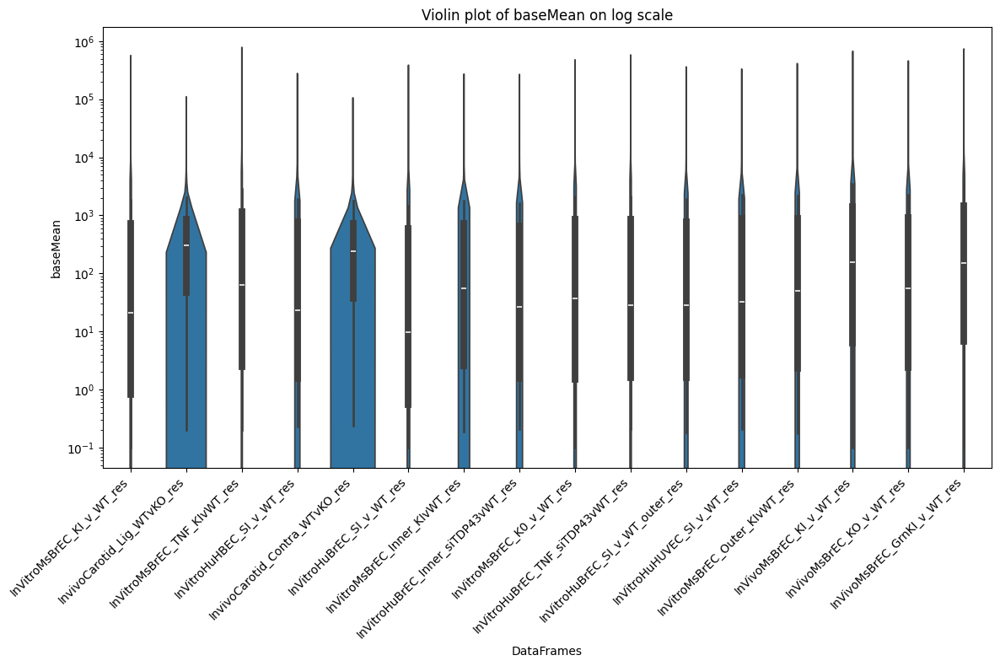

In [7]:
# Original DataFrame names and objects
df_dict = {
    'InVitroMsBrEC_KI_v_WT_res': InVitroMsBrEC_KI_v_WT_res,
    'InvivoCarotid_Lig_WTvKO_res': InvivoCarotid_Lig_WTvKO_res,
    'InVitroMsBrEC_TNF_KIvWT_res': InVitroMsBrEC_TNF_KIvWT_res,
    'InVitroHuHBEC_SI_v_WT_res' : InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res' : InvivoCarotid_Contra_WTvKO_res, 
    'InVitroHuBrEC_SI_v_WT_res' : InVitroHuBrEC_SI_v_WT_res,
    'InVitroMsBrEC_Inner_KIvWT_res' : InVitroMsBrEC_Inner_KIvWT_res,
    'InVitroHuBrEC_Inner_siTDP43vWT_res' : InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res' : InVitroMsBrEC_K0_v_WT_res,
    'InVitroHuBrEC_TNF_siTDP43vWT_res' : InVitroHuBrEC_TNF_siTDP43vWT_res,
    'InVitroHuBrEC_SI_v_WT_outer_res' : InVitroHuBrEC_SI_v_WT_outer_res,
    'InVitroHuHUVEC_SI_v_WT_res' : InVitroHuHUVEC_SI_v_WT_res,
    'InVitroMsBrEC_Outer_KIvWT_res' : InVitroMsBrEC_Outer_KIvWT_res,
    'InVivoMsBrEC_KI_v_WT_res' : InVivoMsBrEC_KI_v_WT_res,
    'InVivoMsBrEC_KO_v_WT_res' : InVivoMsBrEC_KO_v_WT_res,
    'InVivoMsBrEC_GrnKI_v_WT_res' : InVivoMsBrEC_GrnKI_v_WT_res#,
    #'InVivoMsEC_KO_vs_WT_JCIinsight_res' : InVivoMsEC_KO_vs_WT_JCIinsight_res
}

# Extracting baseMean from each DataFrame and replacing 0 with a small number (0.1)
data = []
labels = []
for name, df in df_dict.items():
    if 'baseMean' in df.columns:
        baseMean_values = df['baseMean'].replace(0, np.nan).dropna().apply(lambda x: max(x, 0.1))
        data.append(baseMean_values)
        labels.append(name)
        print(f"Processed {name}: {len(baseMean_values)} values")

# Plotting the violin plot with a log scale
plt.figure(figsize=(12, 8))

# Create a list of all baseMean values along with their corresponding DataFrame name
all_baseMeans = []
all_labels = []
for label, baseMean_values in zip(labels, data):
    all_baseMeans.extend(baseMean_values)
    all_labels.extend([label] * len(baseMean_values))

# Creating a DataFrame for seaborn
plot_data = pd.DataFrame({
    'baseMean': all_baseMeans,
    'DataFrame': all_labels
})

# Plotting
sns.violinplot(x='DataFrame', y='baseMean', data=plot_data)
plt.yscale('log')
plt.title('Violin plot of baseMean on log scale')
plt.xlabel('DataFrames')
plt.ylabel('baseMean')
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

#Convert DESeq2 mouse to human

In [8]:
from biomart import BiomartServer

# Initialize the Biomart server
server = BiomartServer( "http://www.ensembl.org/biomart" )
server.verbose = True

# Choose the dataset
dataset = server.datasets['mmusculus_gene_ensembl']

# Define the attributes you want to retrieve
attributes = ['external_gene_name', 'hsapiens_homolog_associated_gene_name']

# Query mouse to human mappings
response = dataset.search({
    'attributes': attributes
})

# Create a dictionary for mouse to human gene mappings
m2h_dict = {}

# Process the response line by line
for line in response.iter_lines():
    line = line.decode('utf-8')  # Convert bytes to string if necessary
    row = line.split("\t")
    # Check if any of the required fields is missing
    if len(row) == 2 and None not in row:
        mouse_gene, human_homolog = row
        m2h_dict[mouse_gene] = human_homolog

[BiomartServer:'http://www.ensembl.org/biomart/martservice'] Fetching datasets
[BiomartServer:'http://www.ensembl.org/biomart/martservice'] Fetching databases
[BiomartDatabase:'Ensembl Genes 112'] Fetching datasets
[BiomartDatabase:'Mouse strains 112'] Fetching datasets
[BiomartDatabase:'Sequence'] Fetching datasets
[BiomartDatabase:'Ontology'] Fetching datasets
[BiomartDatabase:'Genomic features 112'] Fetching datasets
[BiomartDatabase:'Ensembl Variation 112'] Fetching datasets
[BiomartDatabase:'Ensembl Regulation 112'] Fetching datasets
[BiomartDataset:'mmusculus_gene_ensembl'] Searching using following params:
{'attributes': ['external_gene_name', 'hsapiens_homolog_associated_gene_name']}
[BiomartDataset:'mmusculus_gene_ensembl'] Fetching attributes
[BiomartDataset] search query:
b'<Query virtualSchemaName="default" formatter="TSV" header="0" uniqueRows="1" datasetConfigVersion="0.6" count=""><Dataset name="mmusculus_gene_ensembl" interface="default"><Attribute name="external_gene_n

In [9]:
# Create a dictionary where keys are names and values are dataframes
df_dict = {
    'InVitroMsBrEC_KI_v_WT_res': InVitroMsBrEC_KI_v_WT_res,
    'InvivoCarotid_Lig_WTvKO_res': InvivoCarotid_Lig_WTvKO_res,
    'InVitroMsBrEC_TNF_KIvWT_res': InVitroMsBrEC_TNF_KIvWT_res,
#    'InVitroHuHBEC_SI_v_WT_res' : InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res' : InvivoCarotid_Contra_WTvKO_res, 
#    'InVitroHuBrEC_SI_v_WT_res' : InVitroHuBrEC_SI_v_WT_res,
    'InVitroMsBrEC_Inner_KIvWT_res' : InVitroMsBrEC_Inner_KIvWT_res,
#    'InVitroHuBrEC_Inner_siTDP43vWT_res' : InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res' : InVitroMsBrEC_K0_v_WT_res,
#    'InVitroHuBrEC_TNF_siTDP43vWT_res' : InVitroHuBrEC_TNF_siTDP43vWT_res,
#    'InVitroHuBrEC_SI_v_WT_outer_res' : InVitroHuBrEC_SI_v_WT_outer_res,
#    'InVitroHuHUVEC_SI_v_WT_res' : InVitroHuHUVEC_SI_v_WT_res,
    'InVitroMsBrEC_Outer_KIvWT_res' : InVitroMsBrEC_Outer_KIvWT_res,
    'InVivoMsBrEC_KI_v_WT_res' : InVivoMsBrEC_KI_v_WT_res,
    'InVivoMsBrEC_KO_v_WT_res' : InVivoMsBrEC_KO_v_WT_res,
    'InVivoMsBrEC_GrnKI_v_WT_res' : InVivoMsBrEC_GrnKI_v_WT_res,
    'InVivoMsEC_KO_vs_WT_JCIinsight_res' : InVivoMsEC_KO_vs_WT_JCIinsight_res
}

def transform_dataframe(df, m2h_dict):
    old_index = df.index
    new_index = old_index.map(m2h_dict)  # map the old index to the new index
    df.index = new_index  # set the new index
    return df

# Apply the function to every dataframe in the dictionary
for df_name in df_dict:
    df = df_dict[df_name]
    transformed_df = transform_dataframe(df, m2h_dict)
    new_var_name = f"{df_name}_HsGeneID"  # appending "_HsGeneID" to the variable name
    globals()[new_var_name] = transformed_df  # save the transformed DataFrame as a new global variable

In [10]:
#Prepare single cell res file so that it is in the same format as others

def reformat_df(combined_df):
    # Create a copy of the DataFrame
    formatted_df = combined_df.copy()

    # Print original columns for debugging
    print("Original columns:", formatted_df.columns.tolist())

    # If DataFrame has a column to be set as index, set it as index
    if '1_names' in formatted_df.columns:
        formatted_df.set_index('1_names', inplace=True)
    
    # Rename columns
    formatted_df.columns = formatted_df.columns.str.replace('1_logfoldchanges', 'log2FoldChange')
    formatted_df.columns = formatted_df.columns.str.replace('1_pvals_adj', 'padj')
    formatted_df.columns = formatted_df.columns.str.replace('1_pvals', 'pvalue')

    # Print new columns for debugging
    print("New columns:", formatted_df.columns.tolist())
    
    return formatted_df

def reformat_and_assign(df_name, df):
    reformatted_df = reformat_df(df)
    globals()[df_name + '_formatted'] = reformatted_df

# Example usage
reformat_and_assign('InVivoNuclei_Clust1v3_res', InVivoNuclei_Clust1v3_res)

Original columns: ['Unnamed: 0', '1_names', '1_scores', '1_logfoldchanges', '1_pvals_adj', '1_pvals']
New columns: ['Unnamed: 0', '1_scores', 'log2FoldChange', 'padj', 'pvalue']


#Prepare X-Y plots for correlation between data from TDP43 KO, KI and KD relative to human brain ECs in vivo with low TDP43

In [139]:
filtered_df

,Unnamed: 0,1_scores,log2FoldChange_ref,padj_ref,pvalue_ref,pvalue_comp,padj_comp,log2FoldChange_comp
1_names,,,,,,,,
ABCG2,4.0,-15.992470,-1.762335,3.760651e-43,6.886167e-47,0.667642,0.999194,-0.150218
ABLIM3,1052.0,-3.731374,-0.652717,6.524292e-03,2.092664e-04,0.742183,0.999194,0.049240
ADAM15,4058.0,1.970748,0.650682,3.984908e-01,4.946019e-02,0.501515,0.999194,0.110472
ANGPT2,557.0,4.789320,1.287534,1.426448e-04,2.459619e-06,0.862090,0.999194,0.032569
AP1S2,3853.0,-2.012960,-0.566042,3.798800e-01,4.462288e-02,0.552578,0.999194,-0.073002
...,...,...,...,...,...,...,...,...
TBC1D4,643.0,-4.529145,-0.523911,3.856697e-04,7.568152e-06,0.190060,0.999194,0.201706
THSD1,283.0,-6.080716,-1.712922,2.232855e-07,1.901201e-09,0.167392,0.999194,0.145602
TRAF3IP2,1063.0,3.717996,1.852797,7.255223e-03,2.366965e-04,0.758379,0.999194,0.028985


/Users/patrickmurphy/mambaforge/envs/jupyterenv/lib/python3.11/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
/Users/patrickmurphy/mambaforge/envs/jupyterenv/lib/python3.11/site-packages/gseapy/plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/Users/patrickmurphy/mambaforge/envs/jupyterenv/lib/python3.11/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed 

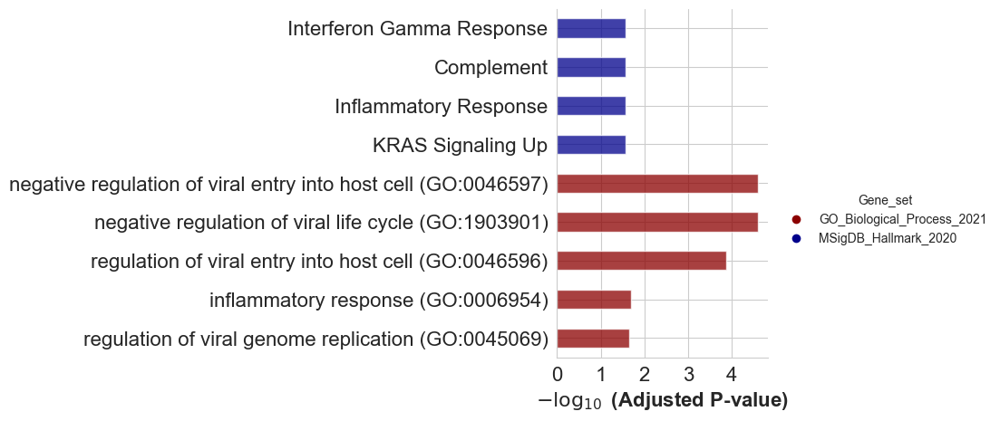

<Figure size 1200x800 with 0 Axes>

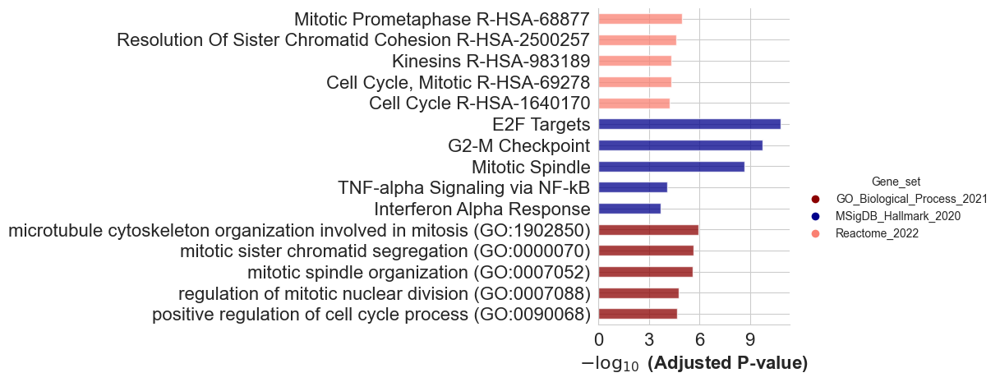

<Figure size 1200x800 with 0 Axes>

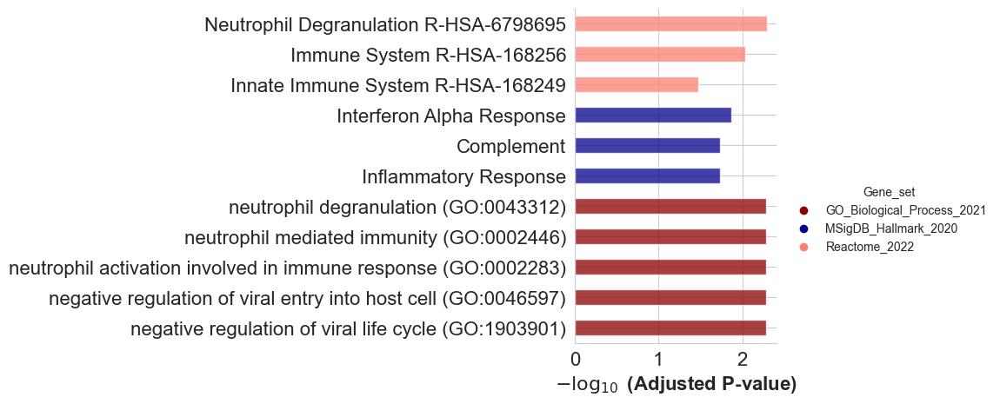

<Figure size 1200x800 with 0 Axes>

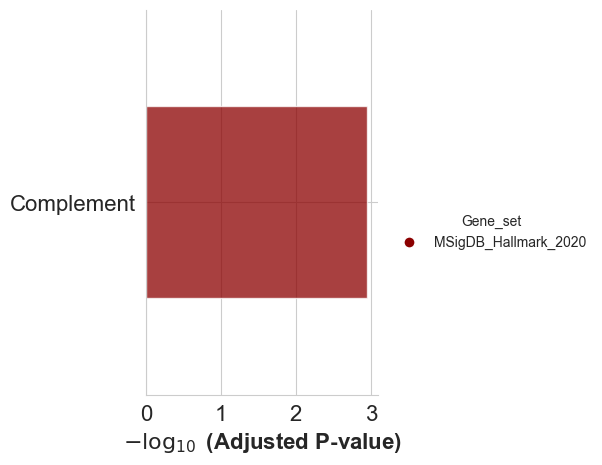

<Figure size 1200x800 with 0 Axes>

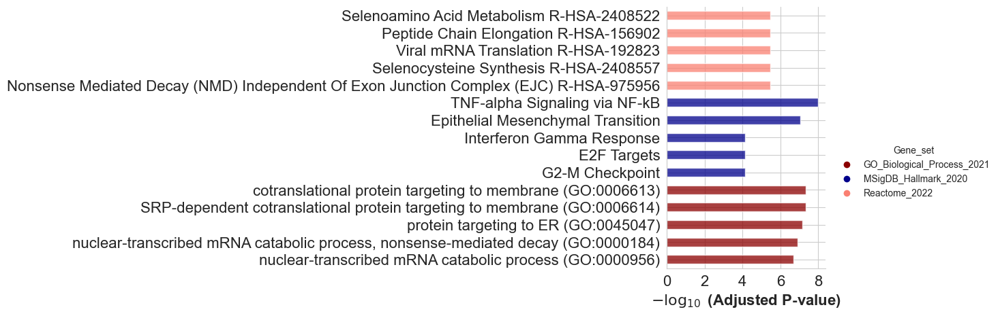

<Figure size 1200x800 with 0 Axes>

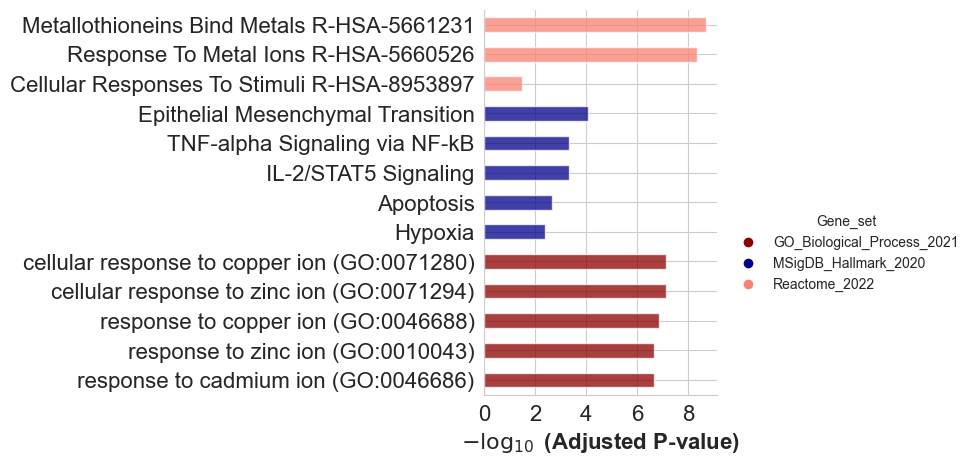

<Figure size 1200x800 with 0 Axes>

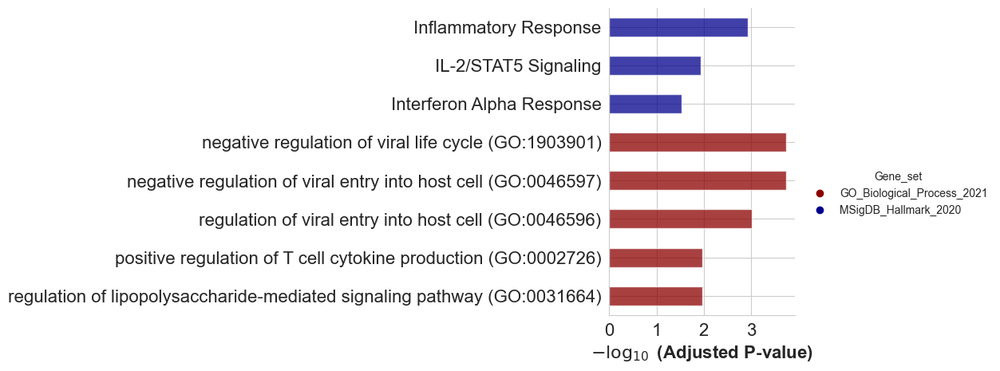

<Figure size 1200x800 with 0 Axes>

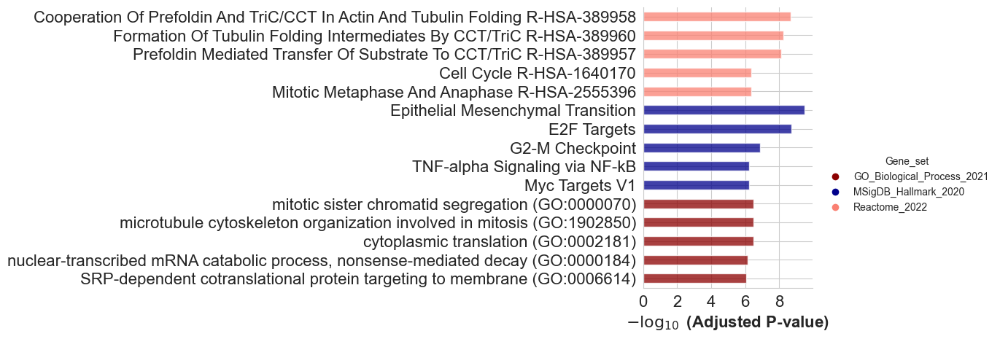

<Figure size 1200x800 with 0 Axes>

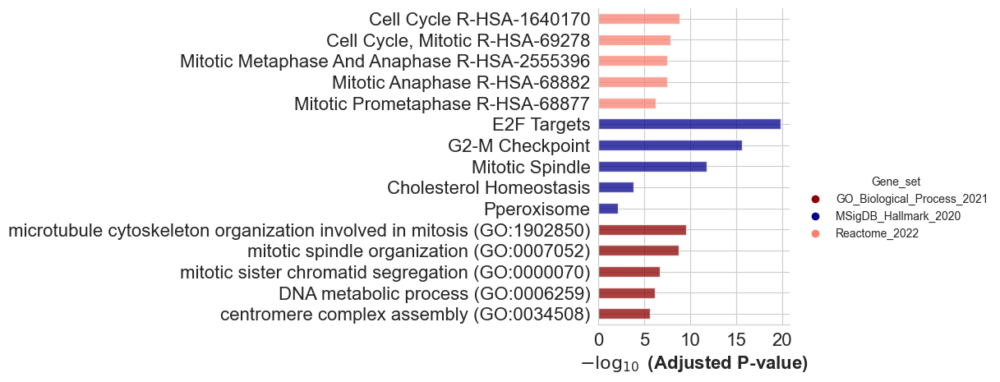

<Figure size 1200x800 with 0 Axes>

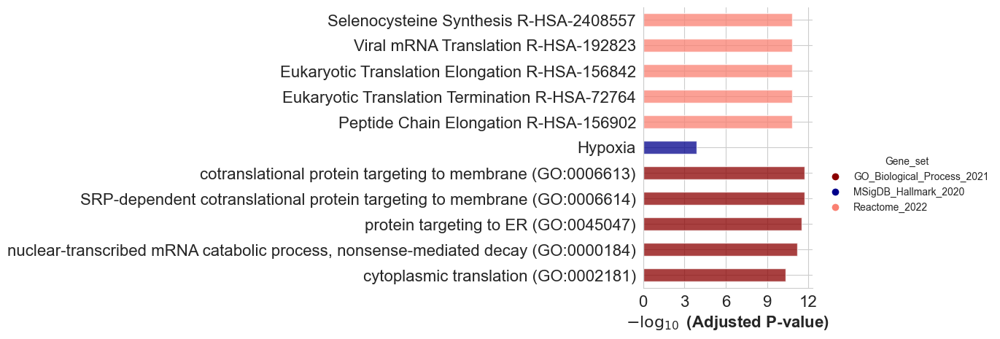

<Figure size 1200x800 with 0 Axes>

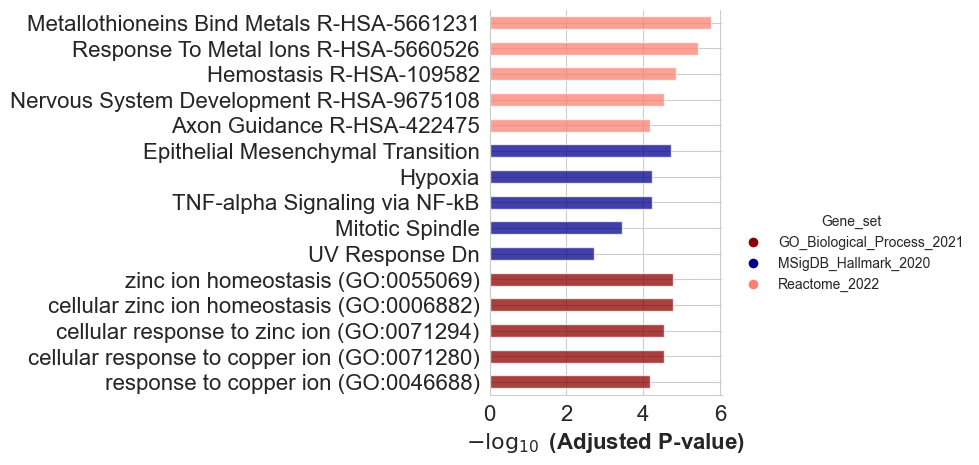

<Figure size 1200x800 with 0 Axes>

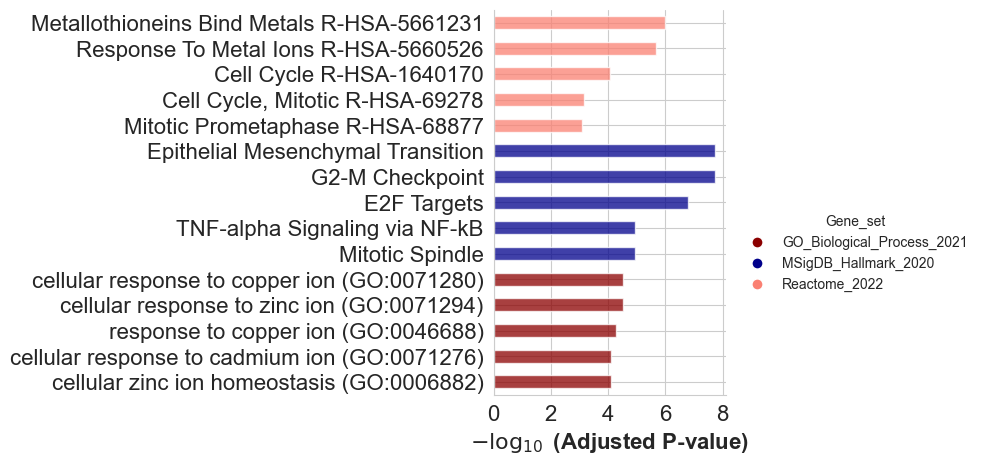

<Figure size 1200x800 with 0 Axes>

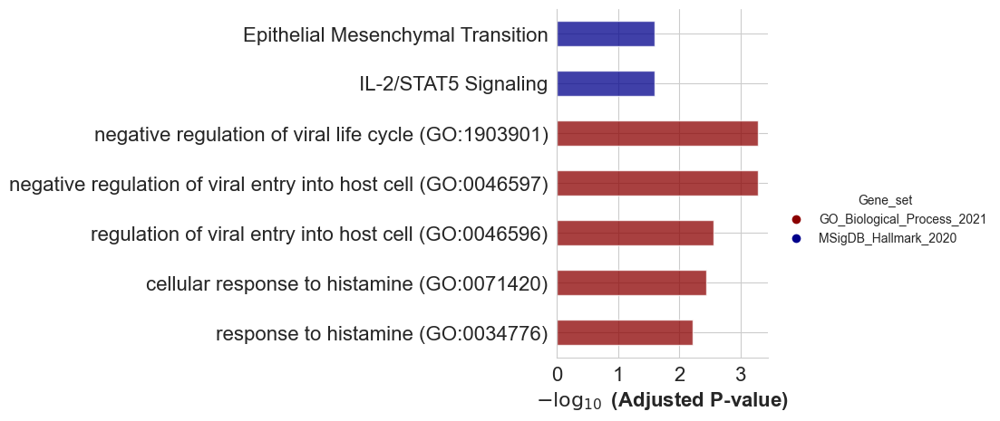

<Figure size 1200x800 with 0 Axes>

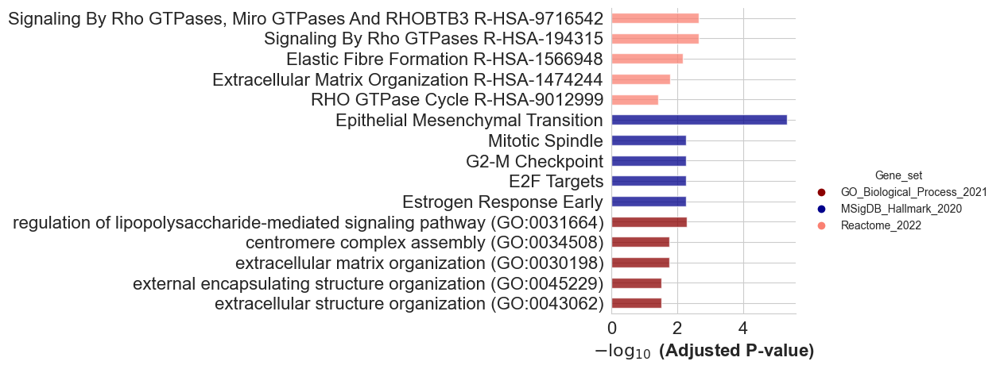

<Figure size 1200x800 with 0 Axes>

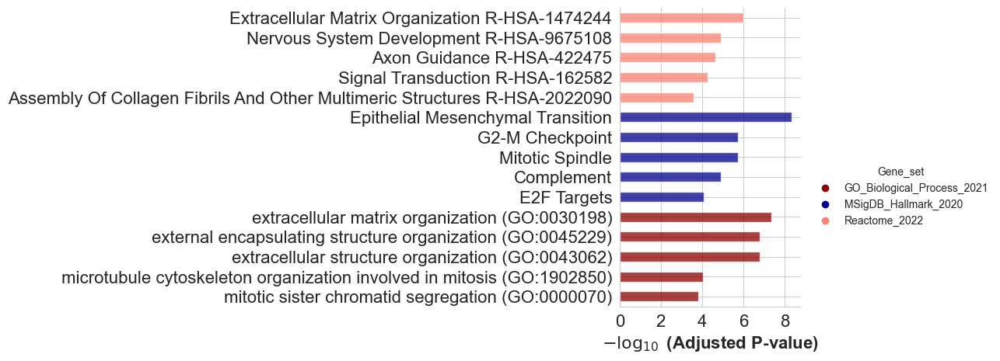

<Figure size 1200x800 with 0 Axes>

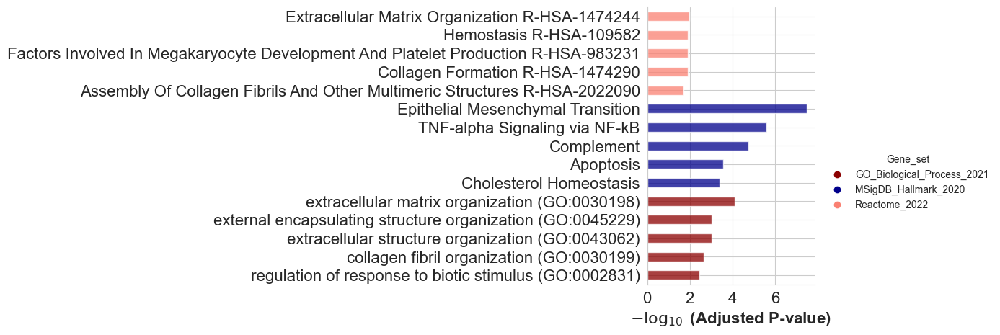

<Figure size 1200x800 with 0 Axes>

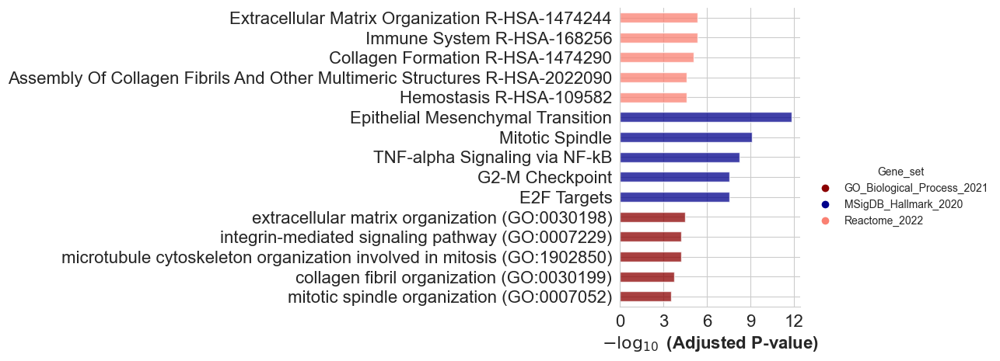

<Figure size 1200x800 with 0 Axes>

In [178]:
df_dict_humangene_res = {
    'InVitroMsBrEC_KI_v_WT_res_HsGeneID': InVitroMsBrEC_KI_v_WT_res_HsGeneID,
    'InvivoCarotid_Lig_WTvKO_res_HsGeneID': InvivoCarotid_Lig_WTvKO_res_HsGeneID,
    'InVitroMsBrEC_TNF_KIvWT_res_HsGeneID': InVitroMsBrEC_TNF_KIvWT_res_HsGeneID,
    'InVitroHuHBEC_SI_v_WT_res': InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res_HsGeneID': InvivoCarotid_Contra_WTvKO_res_HsGeneID, 
    'InVitroHuBrEC_SI_v_WT_res': InVitroHuBrEC_SI_v_WT_res,
    'InVitroMsBrEC_Inner_KIvWT_res_HsGeneID': InVitroMsBrEC_Inner_KIvWT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_inner_res': InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res_HsGeneID': InVitroMsBrEC_K0_v_WT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_TNF_res': InVitroHuBrEC_TNF_siTDP43vWT_res,
    'InVitroHuBrEC_SI_v_WT_outer_res': InVitroHuBrEC_SI_v_WT_outer_res,
    'InVitroHuHUVEC_SI_v_WT_res': InVitroHuHUVEC_SI_v_WT_res,
    'InVitroMsBrEC_Outer_KIvWT_res_HsGeneID': InVitroMsBrEC_Outer_KIvWT_res_HsGeneID,
    'InVivoMsBrEC_KI_v_WT_res_HsGeneID': InVivoMsBrEC_KI_v_WT_res_HsGeneID,
    'InVivoMsBrEC_KO_v_WT_res_HsGeneID': InVivoMsBrEC_KO_v_WT_res_HsGeneID,
    'InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID': InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID,
    'InVivoMsEC_KO_vs_WT_JCIinsight_res_HsGeneID' : InVivoMsEC_KO_vs_WT_JCIinsight_res_HsGeneID,
    'InVivoNuclei_Clust1v3_res_format': InVivoNuclei_Clust1v3_res_formatted
}

# Function to join, filter, and plot for a single comparison DataFrame
def plot_log2foldchange_comparison(reference_df, compare_df, title, save_dir, compare_name):
    # Rename overlapping columns in reference_df (or compare_df if preferred)
    reference_df = reference_df.rename(
        columns={'pvalue': 'pvalue_ref', 'padj': 'padj_ref', 'log2FoldChange': 'log2FoldChange_ref'}
    )
    compare_df = compare_df.rename(
        columns={'pvalue': 'pvalue_comp', 'padj': 'padj_comp', 'log2FoldChange': 'log2FoldChange_comp'}
    )
    joined_df = reference_df.join(compare_df[['pvalue_comp', 'padj_comp', 'log2FoldChange_comp']], how='outer')
    filtered_df = joined_df.dropna(subset=['log2FoldChange_ref', 'log2FoldChange_comp'])
    filtered_df = filtered_df.rename(columns={'Unnamed: 0': 'gene_id'})
    filtered_df = filtered_df[(filtered_df['padj_ref'] < 0.05)] #& (filtered_df['padj_comp'] < 0.05)]
    filtered_df = filtered_df[(filtered_df['log2FoldChange_ref'] > -10) & (filtered_df['log2FoldChange_ref'] < 10)]
    filtered_df = filtered_df[(filtered_df['log2FoldChange_comp'] > -10) & (filtered_df['log2FoldChange_comp'] < 10)]
    
    log2fold_ref = filtered_df['log2FoldChange_ref']
    log2fold_comp = filtered_df['log2FoldChange_comp']

    # Determine the genes increased (>0.5) in both datasets
    increased_genes = filtered_df[(filtered_df['log2FoldChange_ref'] > 0.5) & (filtered_df['log2FoldChange_comp'] > 0.5)].index.tolist()

    # Perform Enrichr analysis
    enr = gseapy.enrichr(gene_list=increased_genes, gene_sets=['MSigDB_Hallmark_2020','Reactome_2022', 'GO_Biological_Process_2021'], organism='human', outdir=None)
    
    ax = barplot(enr.results,
              column="Adjusted P-value",
              group='Gene_set', # set group, so you could do a multi-sample/library comparsion
              size=10,
              top_term=5,
              figsize=(3,5),
              color=['darkred', 'darkblue', 'salmon'] # set colors for group
              #color = {'KEGG_2021_Human': 'salmon', 'MSigDB_Hallmark_2020':'darkblue'}
             )
    
    # Calculate the correlation
    correlation, p_value = stats.pearsonr(log2fold_ref, log2fold_comp)

    # Create an enhanced scatter plot
    plt.figure(figsize=(12, 8))
    sns.set_style("whitegrid")

    # Create a joint plot
    g = sns.jointplot(
        x=log2fold_ref, 
        y=log2fold_comp, 
        kind="scatter",
        height=8,
        marginal_kws=dict(bins=30, fill=True),
        joint_kws=dict(alpha=0.5)
    )

    # Add a regression line
    sns.regplot(x=log2fold_ref, y=log2fold_comp, scatter=False, ax=g.ax_joint, color="red")

    # Customize the plot
    g.ax_joint.set_xlabel('log2 Fold Change (Reference)', fontsize=12)
    g.ax_joint.set_ylabel('log2 Fold Change (Compare)', fontsize=12)
    g.fig.suptitle(f'{title}\nCorrelation of Non-Zero Gene Values\nr = {correlation:.2f}, p = {p_value:.2e}', fontsize=16)

    # Add quadrant lines
    g.ax_joint.axhline(y=0, color='gray', linestyle='--', linewidth=1)
    g.ax_joint.axvline(x=0, color='gray', linestyle='--', linewidth=1)

    # Add text annotations for quadrants
    g.ax_joint.text(0.95, 0.95, 'Both Up', ha='right', va='top', transform=g.ax_joint.transAxes)
    g.ax_joint.text(0.05, 0.95, 'Compare Up\nReference Down', ha='left', va='top', transform=g.ax_joint.transAxes)
    g.ax_joint.text(0.95, 0.05, 'Reference Up\nCompare Down', ha='right', va='bottom', transform=g.ax_joint.transAxes)
    g.ax_joint.text(0.05, 0.05, 'Both Down', ha='left', va='bottom', transform=g.ax_joint.transAxes)
    
    # Plot Enrichr results
    #plt.figure(figsize=(12, 8))
    #ax = plt.subplot(121)
    #sns.barplot(x='Adjusted P-value', y='Term', data=enr.results.head(10), ax=ax)
    #ax.set_title('Top 10 Enrichment Terms')

    # Save the plot to a PDF
    pdf_path = os.path.join(save_dir, f'{compare_name}.pdf')
    with PdfPages(pdf_path) as pdf:
        pdf.savefig(g.fig)
        pdf.savefig()  # Save the enrichment plots
    plt.close(g.fig)

# Example usage:
# Create a directory for saving the plots
save_dir = 'comparison_plots'
os.makedirs(save_dir, exist_ok=True)

# Reference DataFrame (assuming you have a separate reference)
reference_df = df_dict_humangene_res['InVivoNuclei_Clust1v3_res_format']  # Example reference

# Loop through comparison DataFrames in the dictionary
for compare_name, compare_df in df_dict_humangene_res.items():
    # Skip the reference DataFrame (if it's included in the dictionary)
    if compare_name == 'InVivoNuclei_Clust1v3_res_format':
        continue
    title = f'log2 Fold Change Comparison (Ref vs {compare_name})'
    plot_log2foldchange_comparison(reference_df, compare_df, title, save_dir, compare_name)

<Figure size 1200x800 with 0 Axes>

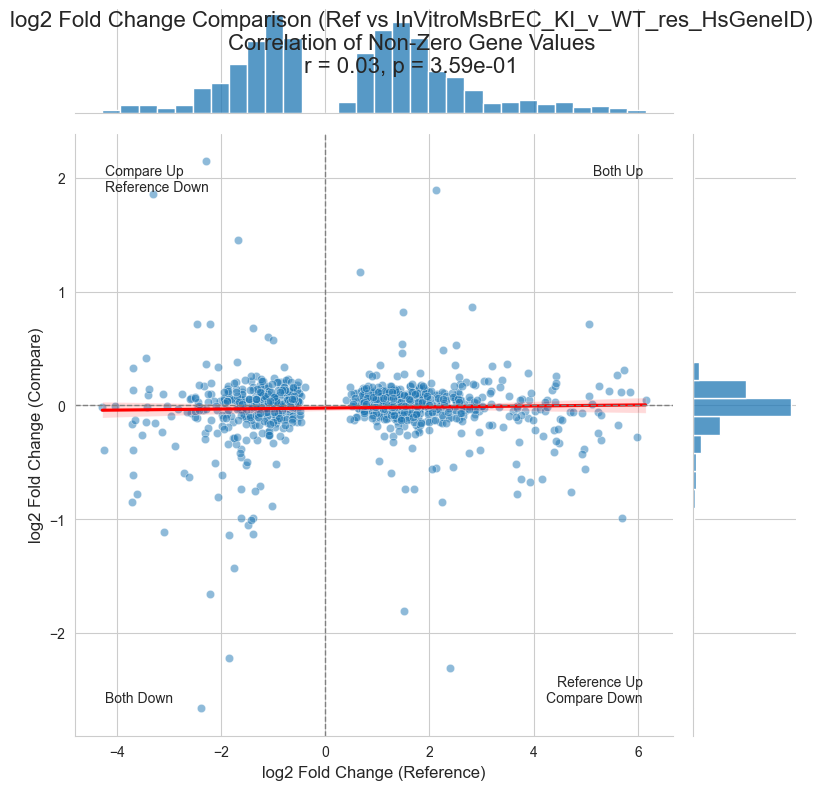

<Figure size 1200x800 with 0 Axes>

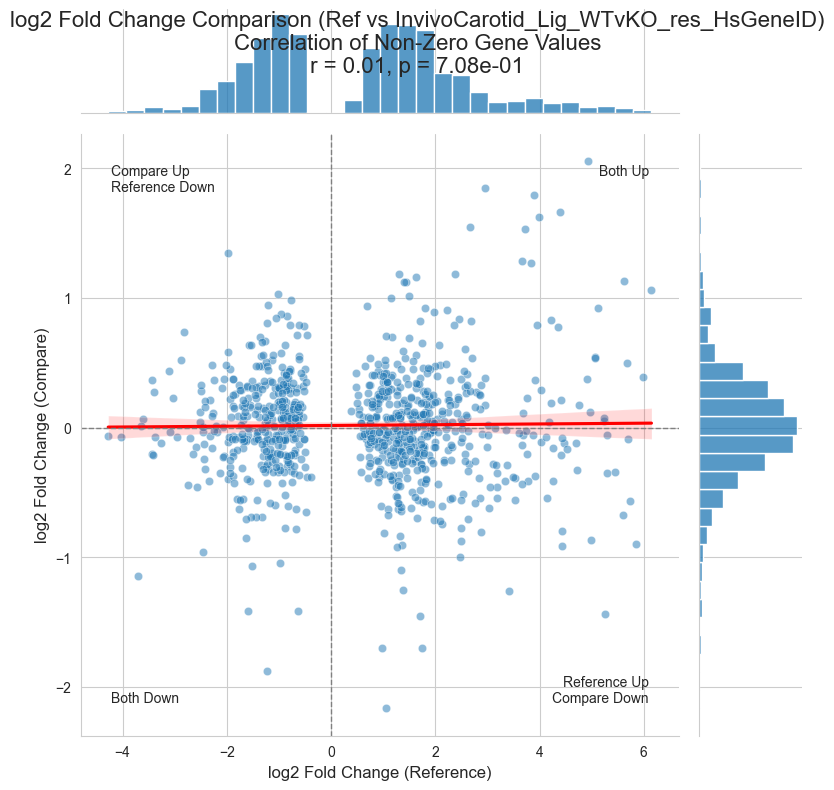

<Figure size 1200x800 with 0 Axes>

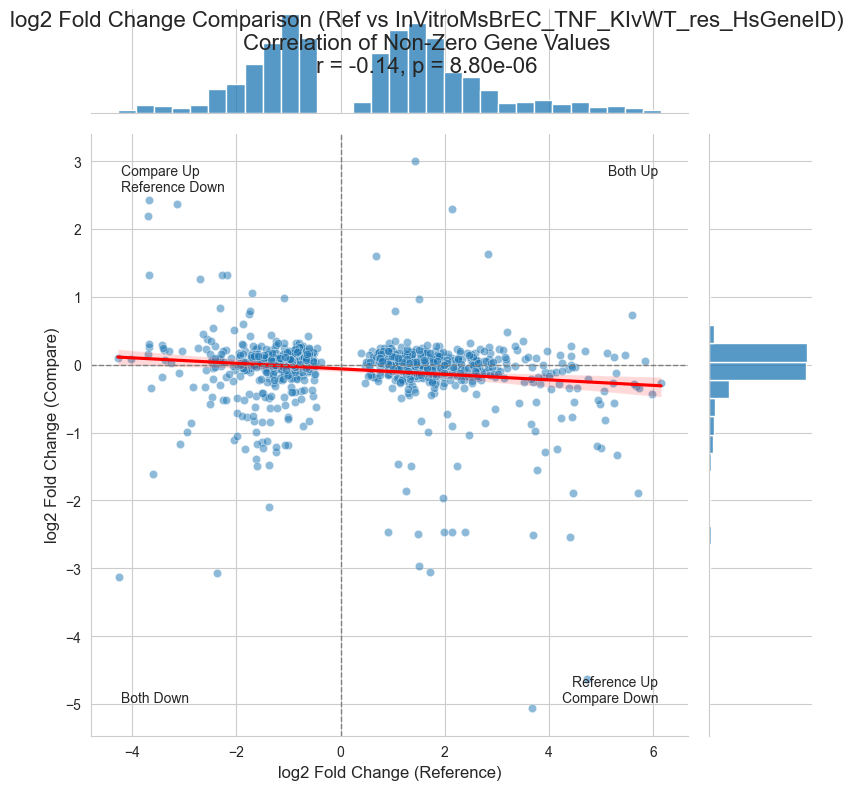

<Figure size 1200x800 with 0 Axes>

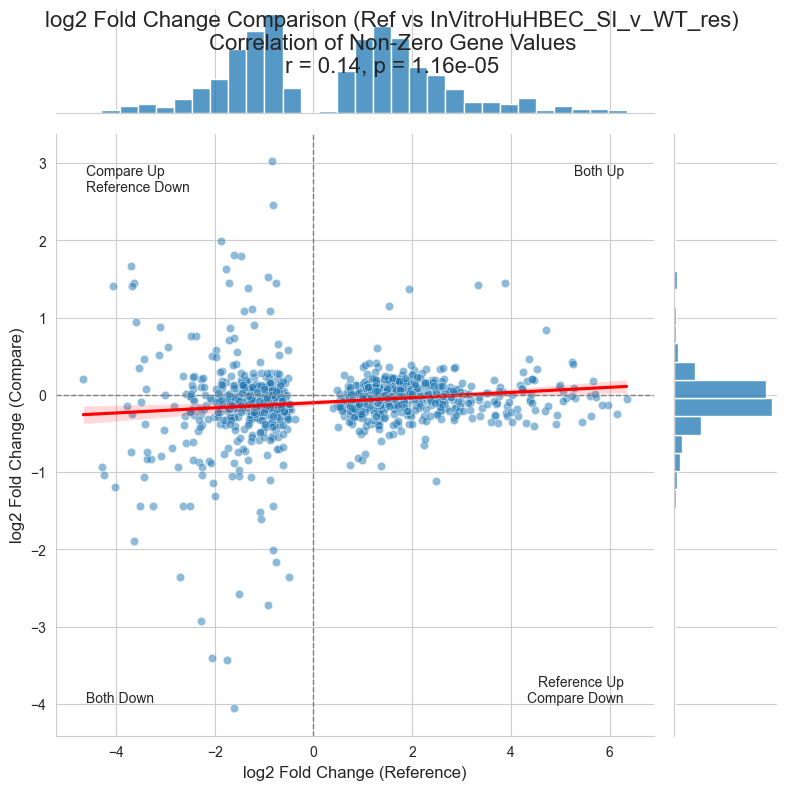

<Figure size 1200x800 with 0 Axes>

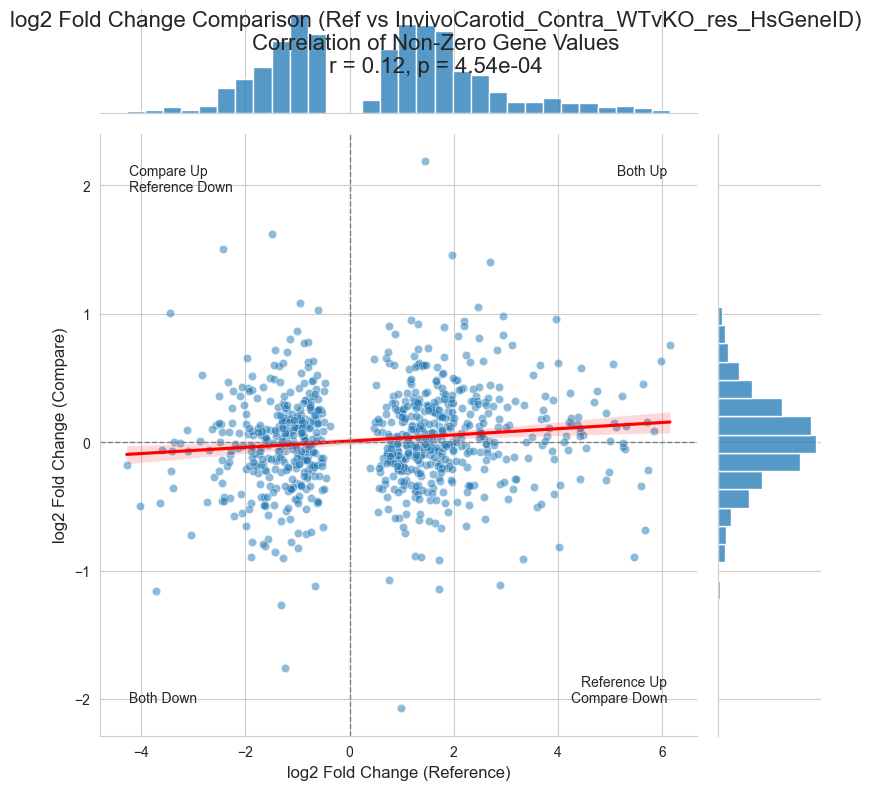

<Figure size 1200x800 with 0 Axes>

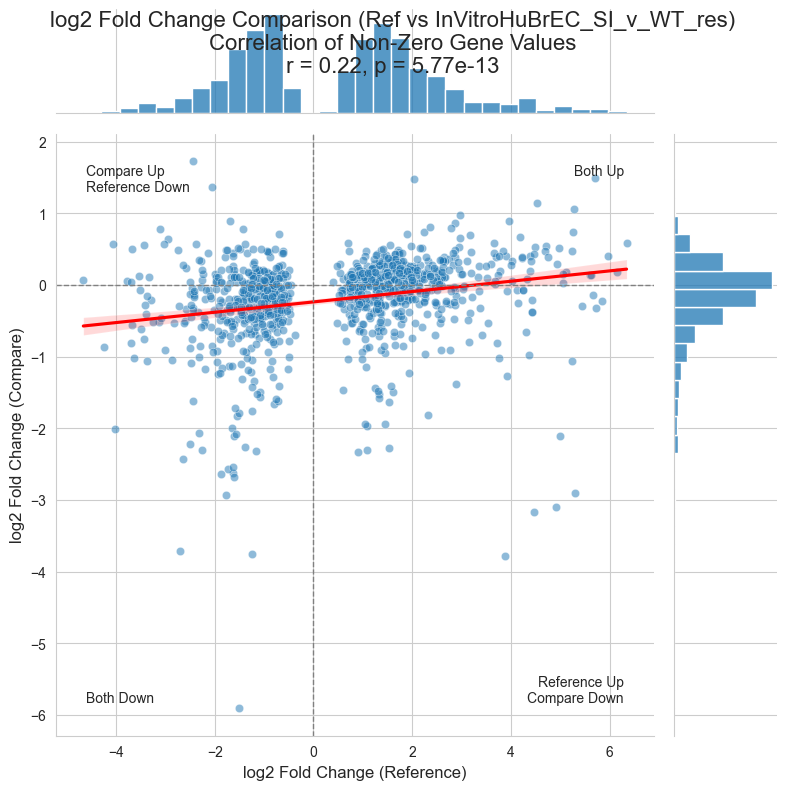

<Figure size 1200x800 with 0 Axes>

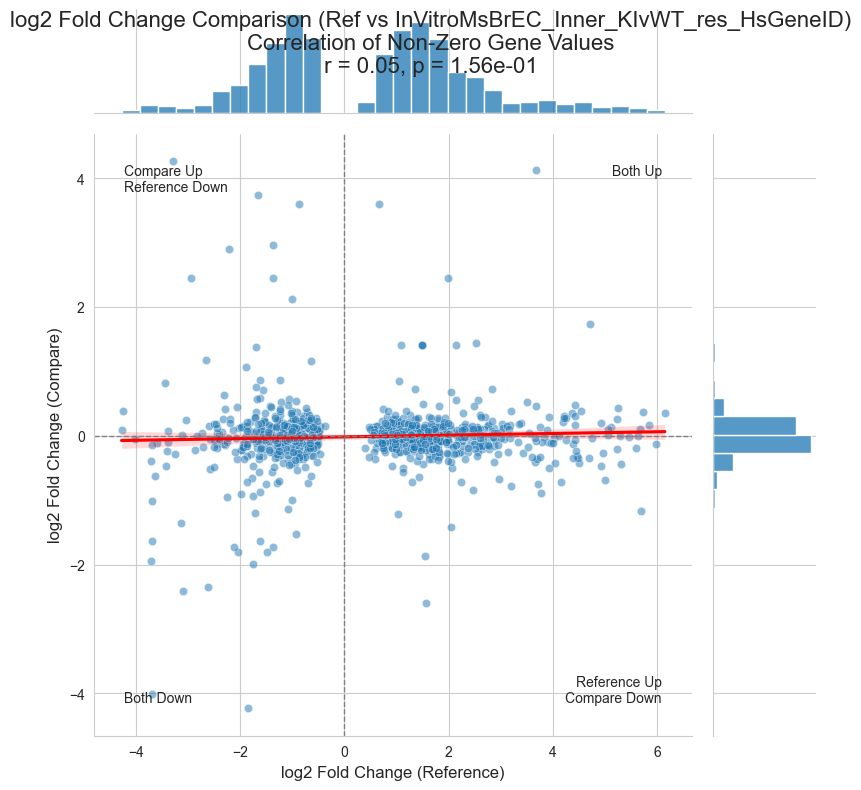

<Figure size 1200x800 with 0 Axes>

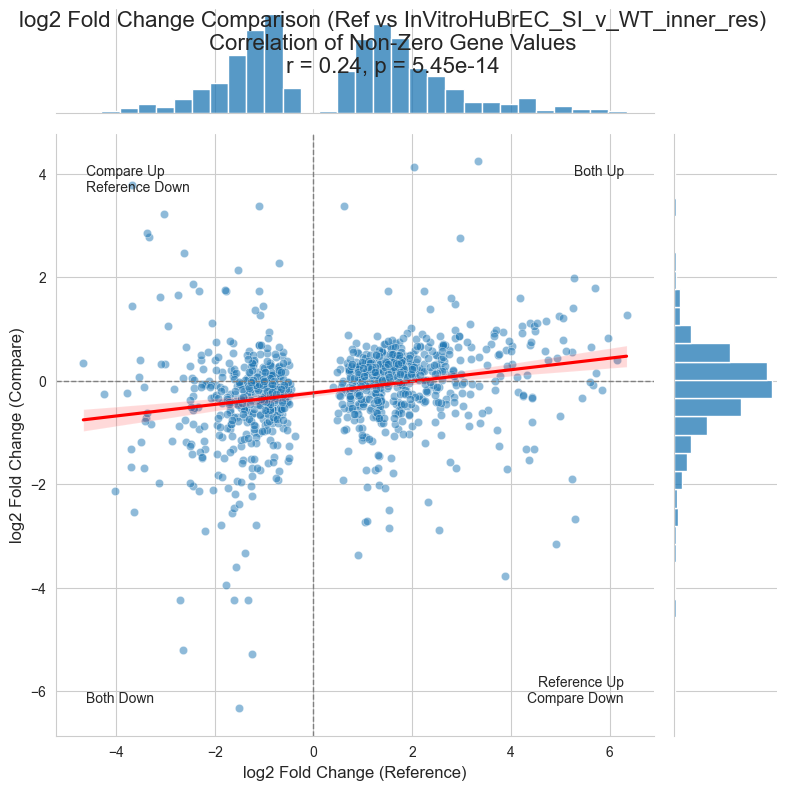

<Figure size 1200x800 with 0 Axes>

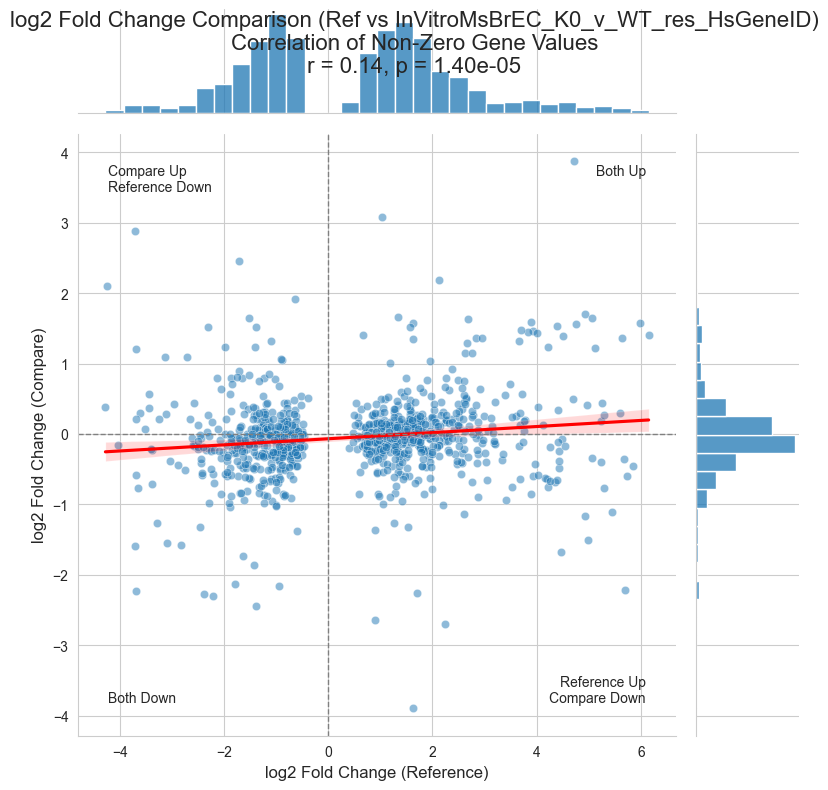

<Figure size 1200x800 with 0 Axes>

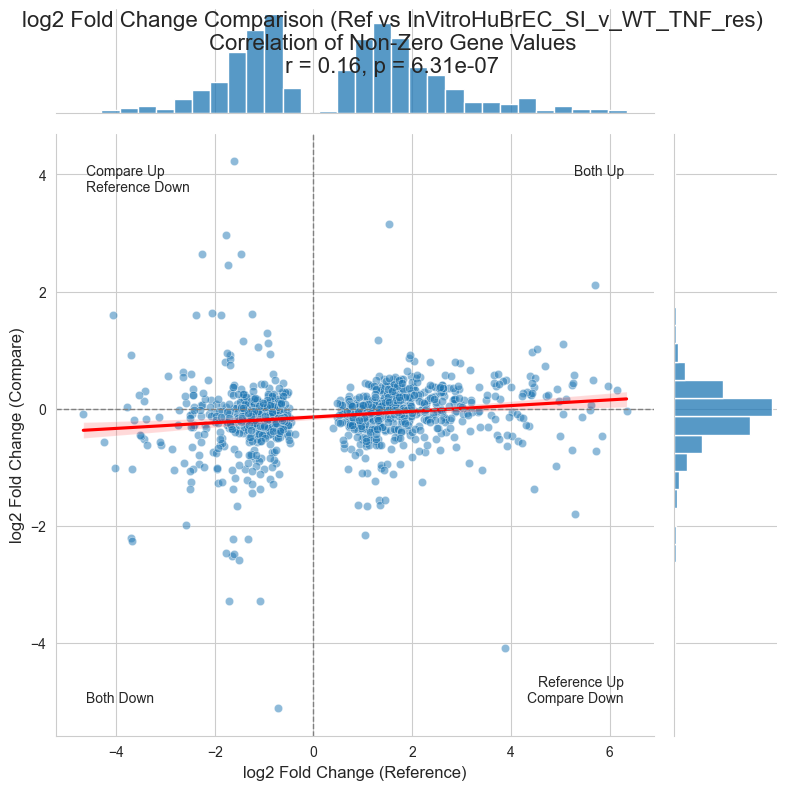

<Figure size 1200x800 with 0 Axes>

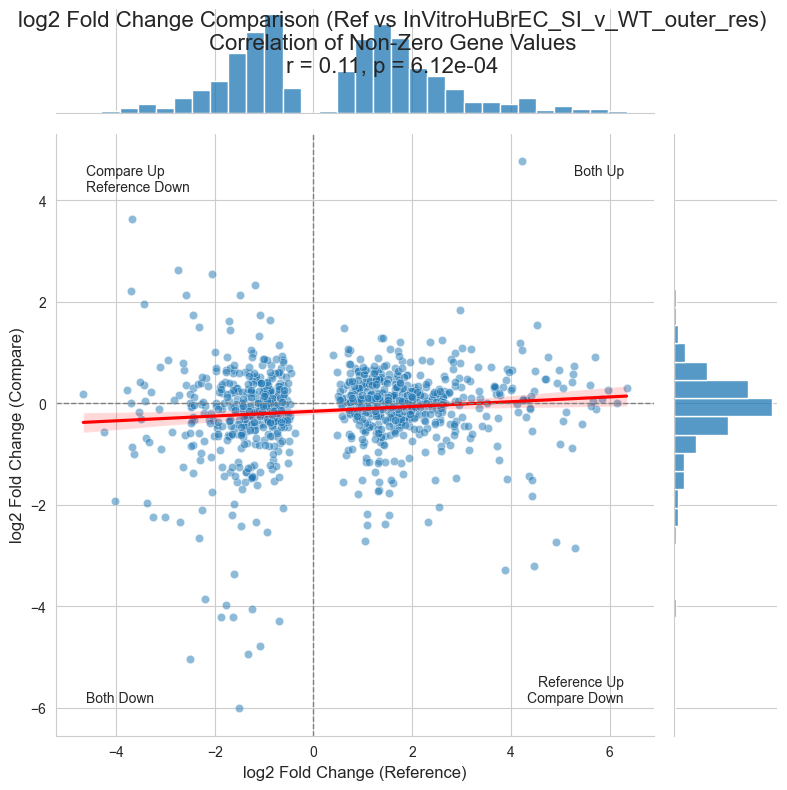

<Figure size 1200x800 with 0 Axes>

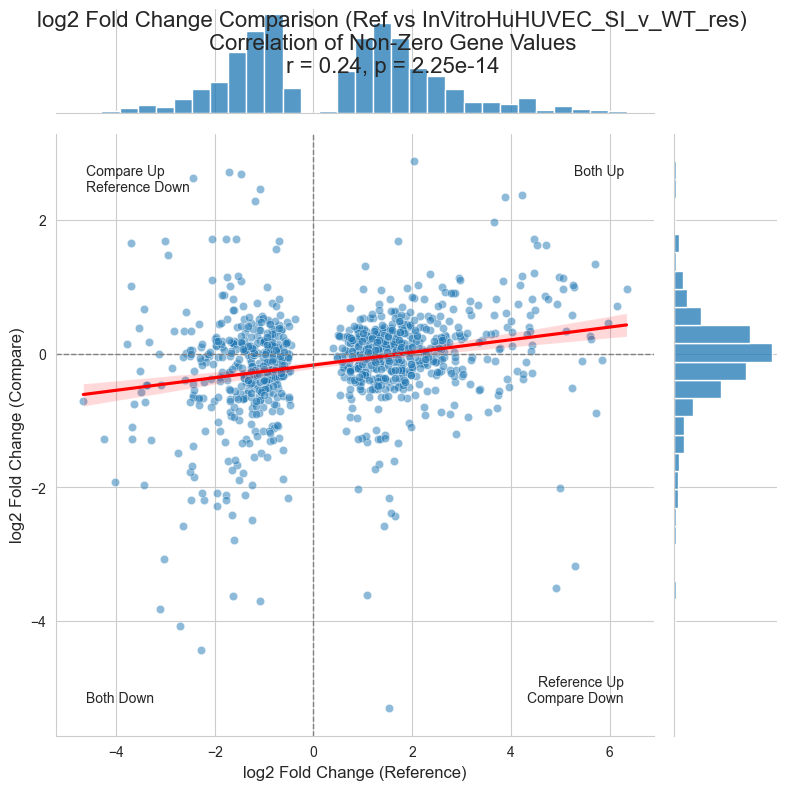

<Figure size 1200x800 with 0 Axes>

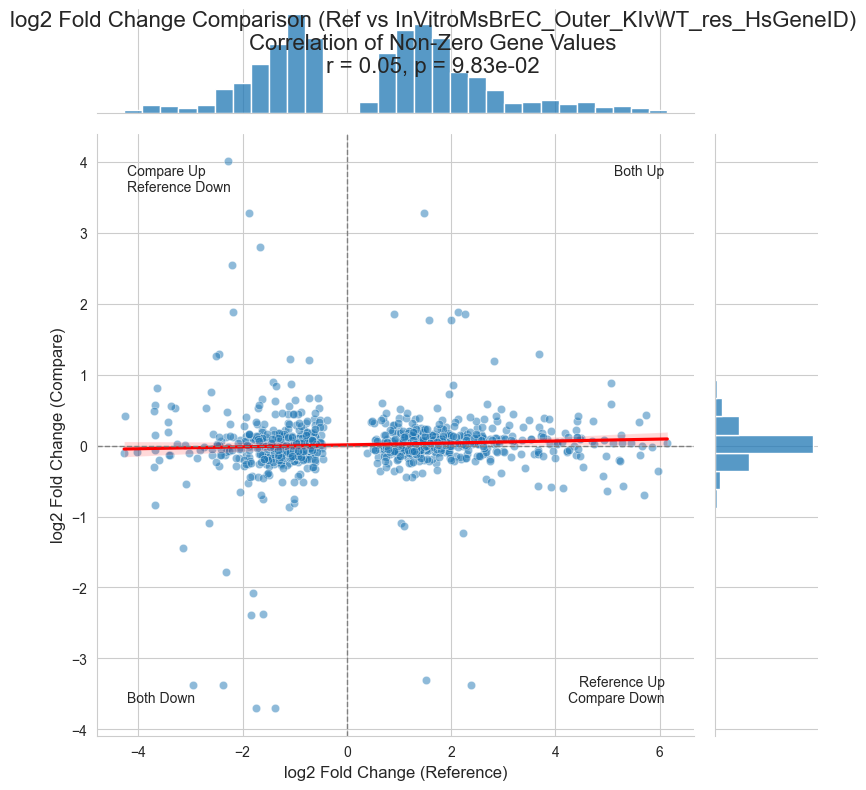

<Figure size 1200x800 with 0 Axes>

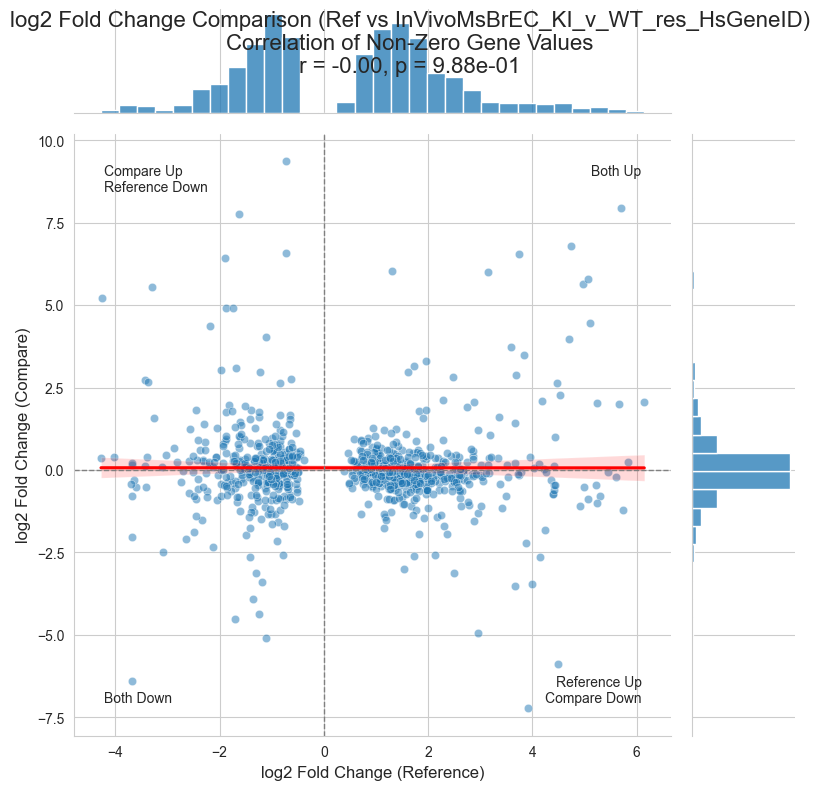

<Figure size 1200x800 with 0 Axes>

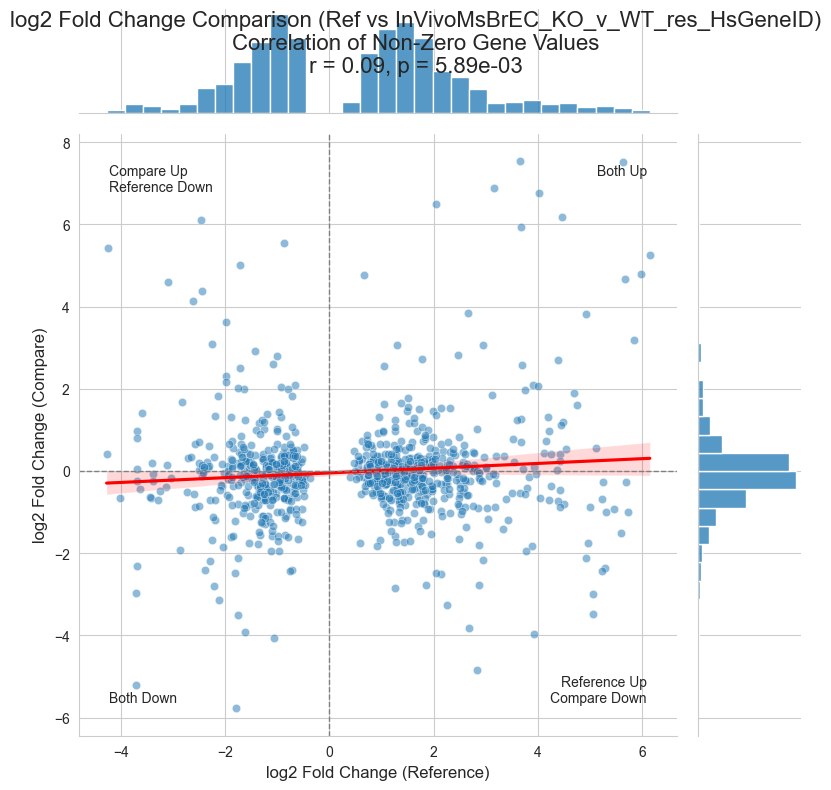

<Figure size 1200x800 with 0 Axes>

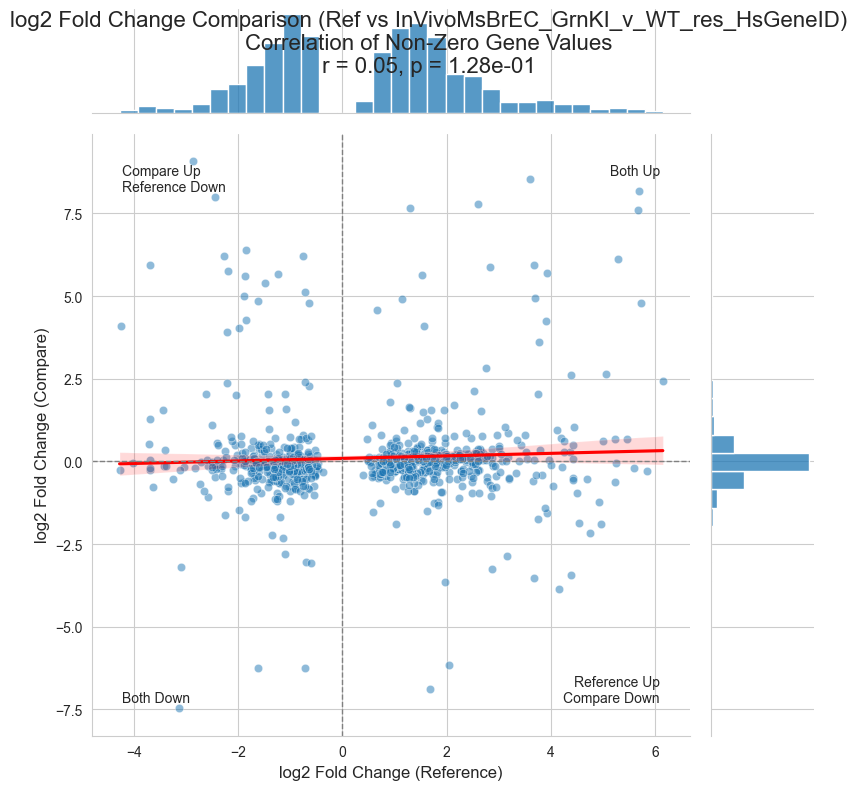

<Figure size 1200x800 with 0 Axes>

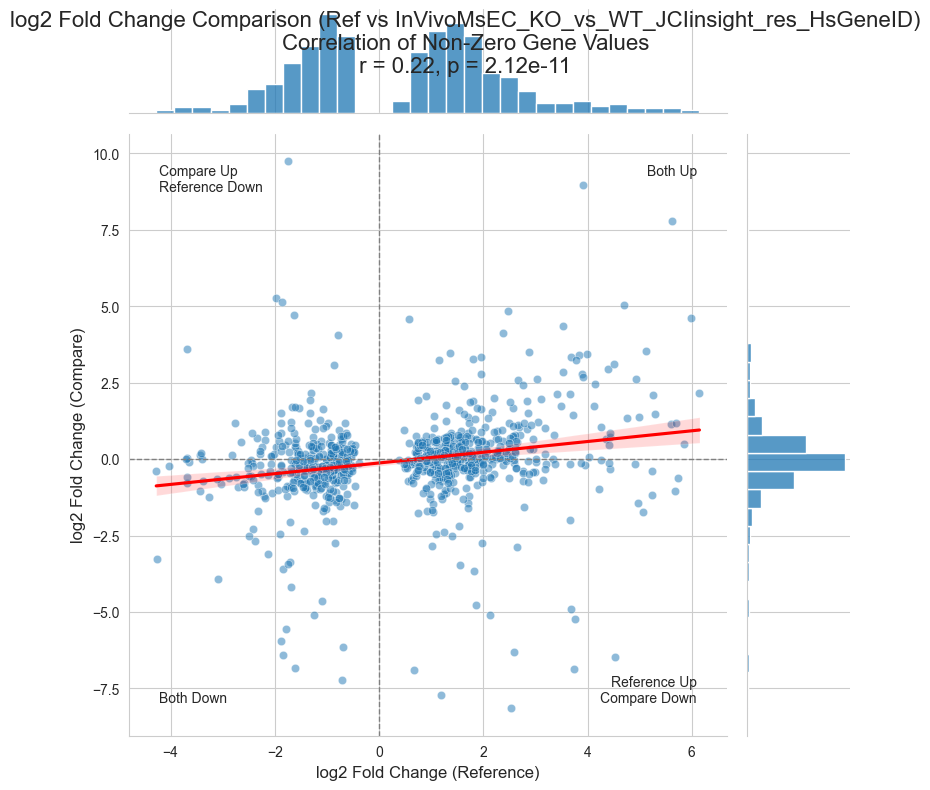

In [153]:
# To extract a specific gene set
#gene_set_name = "HuAEC_TNF_Up" #Replace with your actual gene set name
gene_set_name = "p3_iPSC_EC_CHIRvDMSO_PMID34755601_Down" #Replace with your actual gene set name
gsea_term_genes = custom_endo_human_genesets.get(gene_set_name, [])

# Convert the set of genes to a list for the DataFrame index
gsea_term_genes_list = list(gsea_term_genes)

df_dict_humangene_res = {
    'InVitroMsBrEC_KI_v_WT_res_HsGeneID': InVitroMsBrEC_KI_v_WT_res_HsGeneID,
    'InvivoCarotid_Lig_WTvKO_res_HsGeneID': InvivoCarotid_Lig_WTvKO_res_HsGeneID,
    'InVitroMsBrEC_TNF_KIvWT_res_HsGeneID': InVitroMsBrEC_TNF_KIvWT_res_HsGeneID,
    'InVitroHuHBEC_SI_v_WT_res': InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res_HsGeneID': InvivoCarotid_Contra_WTvKO_res_HsGeneID, 
    'InVitroHuBrEC_SI_v_WT_res': InVitroHuBrEC_SI_v_WT_res,
    'InVitroMsBrEC_Inner_KIvWT_res_HsGeneID': InVitroMsBrEC_Inner_KIvWT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_inner_res': InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res_HsGeneID': InVitroMsBrEC_K0_v_WT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_TNF_res': InVitroHuBrEC_TNF_siTDP43vWT_res,
    'InVitroHuBrEC_SI_v_WT_outer_res': InVitroHuBrEC_SI_v_WT_outer_res,
    'InVitroHuHUVEC_SI_v_WT_res': InVitroHuHUVEC_SI_v_WT_res,
    'InVitroMsBrEC_Outer_KIvWT_res_HsGeneID': InVitroMsBrEC_Outer_KIvWT_res_HsGeneID,
    'InVivoMsBrEC_KI_v_WT_res_HsGeneID': InVivoMsBrEC_KI_v_WT_res_HsGeneID,
    'InVivoMsBrEC_KO_v_WT_res_HsGeneID': InVivoMsBrEC_KO_v_WT_res_HsGeneID,
    'InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID': InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID,
    'InVivoMsEC_KO_vs_WT_JCIinsight_res_HsGeneID' : InVivoMsEC_KO_vs_WT_JCIinsight_res_HsGeneID,
    'InVivoNuclei_Clust1v3_res_format': InVivoNuclei_Clust1v3_res_formatted
}

# Function to join, filter, and plot for a single comparison DataFrame
def plot_log2foldchange_comparison(reference_df, compare_df, title):
    # Rename overlapping columns in reference_df (or compare_df if preferred)
    reference_df = reference_df.rename(
        columns={'pvalue': 'pvalue_ref', 'padj': 'padj_ref', 'log2FoldChange': 'log2FoldChange_ref'}
    )
    compare_df = compare_df.rename(
        columns={'pvalue': 'pvalue_comp', 'padj': 'padj_comp', 'log2FoldChange': 'log2FoldChange_comp'}
    )
    joined_df = reference_df.join(compare_df[['pvalue_comp', 'padj_comp', 'log2FoldChange_comp']], how='outer')
    filtered_df = joined_df.dropna(subset=['log2FoldChange_ref', 'log2FoldChange_comp'])
    filtered_df = filtered_df.rename(columns={'Unnamed: 0': 'gene_id'})
    filtered_df = filtered_df[(filtered_df['padj_ref'] < 0.05)] #& (filtered_df['padj_comp'] < 0.05)]
    filtered_df = filtered_df[(filtered_df['log2FoldChange_ref'] > -10) & (filtered_df['log2FoldChange_ref'] < 10)]
    filtered_df = filtered_df[(filtered_df['log2FoldChange_comp'] > -10) & (filtered_df['log2FoldChange_comp'] < 10)]
    
    # Filter for genes in the gene_list
    #filtered_df = filtered_df[filtered_df.index.isin(gsea_term_genes_list)]
    
    log2fold_ref = filtered_df['log2FoldChange_ref']
    log2fold_comp = filtered_df['log2FoldChange_comp']
    
    # Calculate the correlation
    correlation, p_value = stats.pearsonr(log2fold_ref, log2fold_comp)

    # Create an enhanced scatter plot
    plt.figure(figsize=(12, 8))
    sns.set_style("whitegrid")

    # Create a joint plot
    g = sns.jointplot(
        x=log2fold_ref, 
        y=log2fold_comp, 
        kind="scatter",
        height=8,
        marginal_kws=dict(bins=30, fill=True),
        joint_kws=dict(alpha=0.5)
    )

    # Add a regression line
    sns.regplot(x=log2fold_ref, y=log2fold_comp, scatter=False, ax=g.ax_joint, color="red")

    # Customize the plot
    g.ax_joint.set_xlabel('log2 Fold Change (Reference)', fontsize=12)
    g.ax_joint.set_ylabel('log2 Fold Change (Compare)', fontsize=12)
    g.fig.suptitle(f'{title}\nCorrelation of Non-Zero Gene Values\nr = {correlation:.2f}, p = {p_value:.2e}', fontsize=16)

    # Add quadrant lines
    g.ax_joint.axhline(y=0, color='gray', linestyle='--', linewidth=1)
    g.ax_joint.axvline(x=0, color='gray', linestyle='--', linewidth=1)

    # Add text annotations for quadrants
    g.ax_joint.text(0.95, 0.95, 'Both Up', ha='right', va='top', transform=g.ax_joint.transAxes)
    g.ax_joint.text(0.05, 0.95, 'Compare Up\nReference Down', ha='left', va='top', transform=g.ax_joint.transAxes)
    g.ax_joint.text(0.95, 0.05, 'Reference Up\nCompare Down', ha='right', va='bottom', transform=g.ax_joint.transAxes)
    g.ax_joint.text(0.05, 0.05, 'Both Down', ha='left', va='bottom', transform=g.ax_joint.transAxes)

    plt.show()

# Example usage:
# Reference DataFrame (assuming you have a separate reference)
reference_df = df_dict_humangene_res['InVivoNuclei_Clust1v3_res_format']  # Example reference

# Loop through comparison DataFrames in the dictionary
for compare_name, compare_df in df_dict_humangene_res.items():
    # Skip the reference DataFrame (if it's included in the dictionary)
    if compare_name == 'InVivoNuclei_Clust1v3_res_format':
        continue
    title = f'log2 Fold Change Comparison (Ref vs {compare_name})'
    plot_log2foldchange_comparison(reference_df, compare_df, title)


<Figure size 1200x800 with 0 Axes>

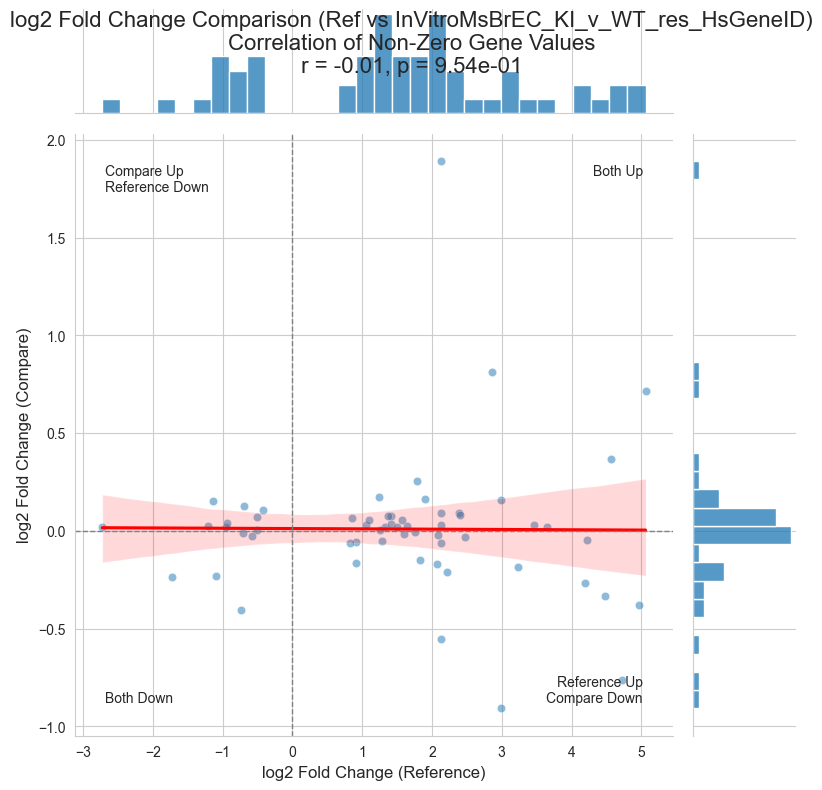

<Figure size 1200x800 with 0 Axes>

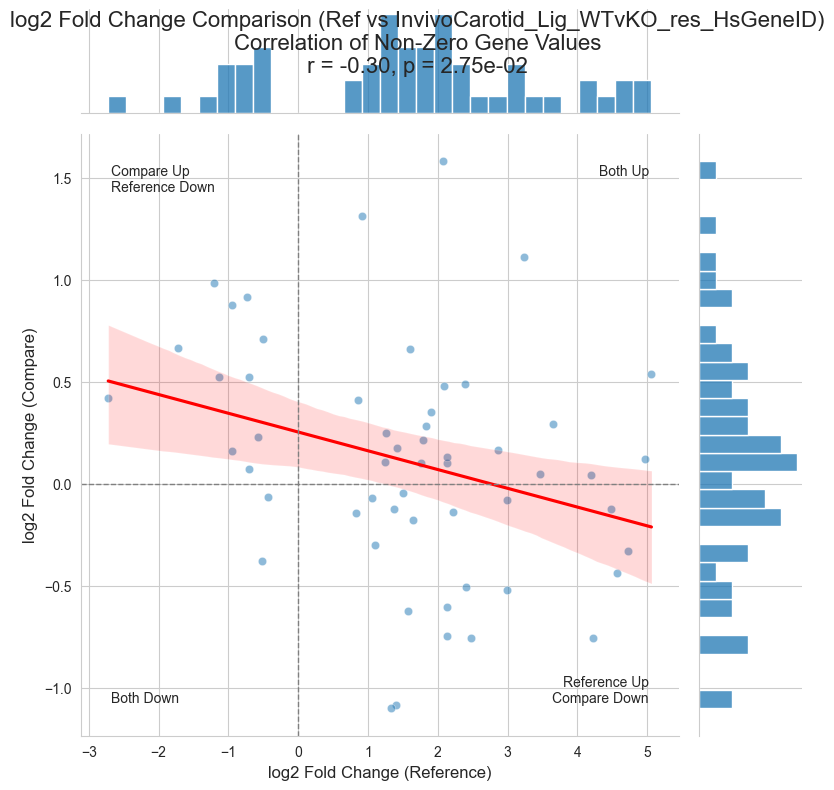

<Figure size 1200x800 with 0 Axes>

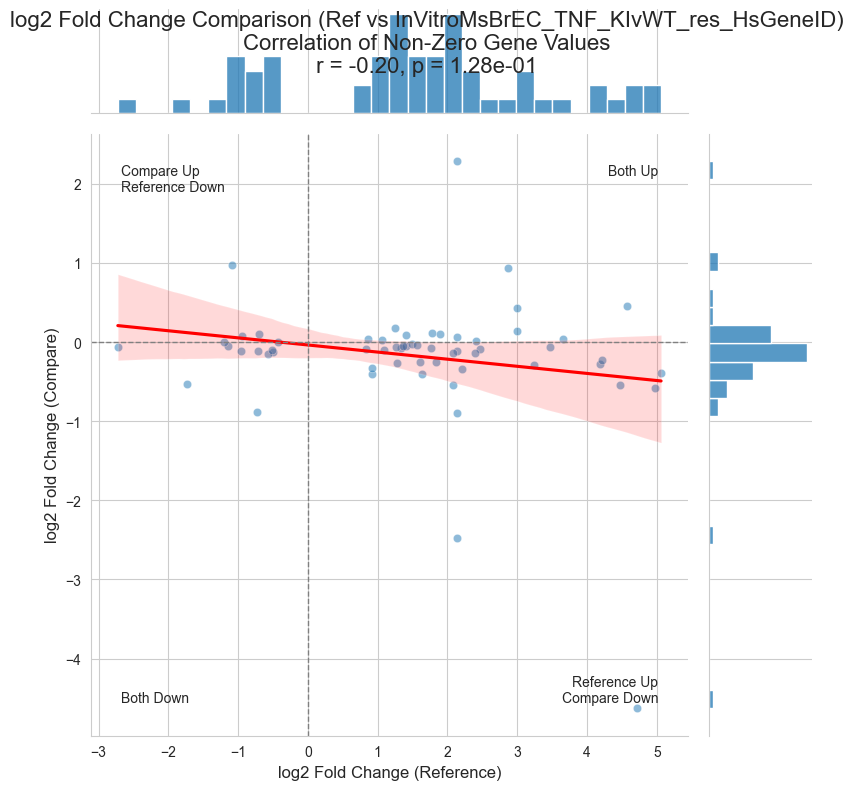

<Figure size 1200x800 with 0 Axes>

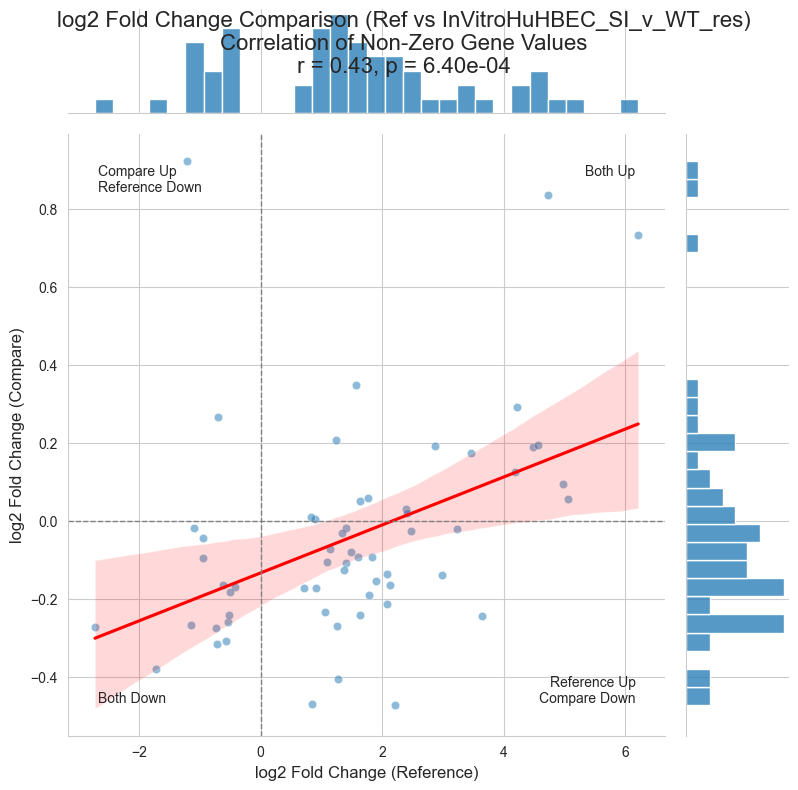

<Figure size 1200x800 with 0 Axes>

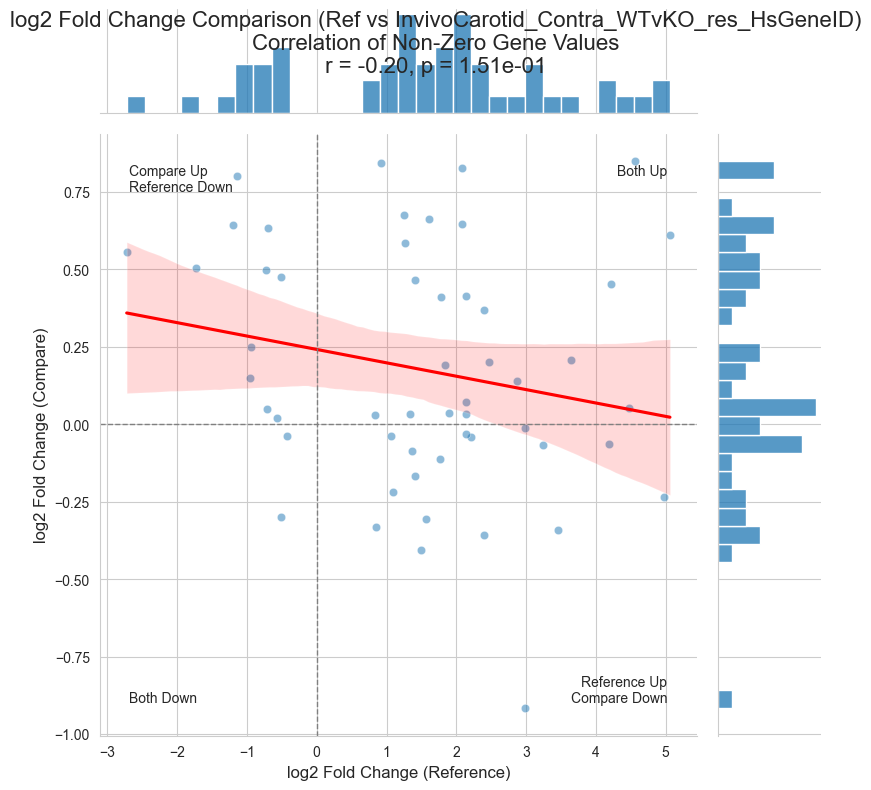

<Figure size 1200x800 with 0 Axes>

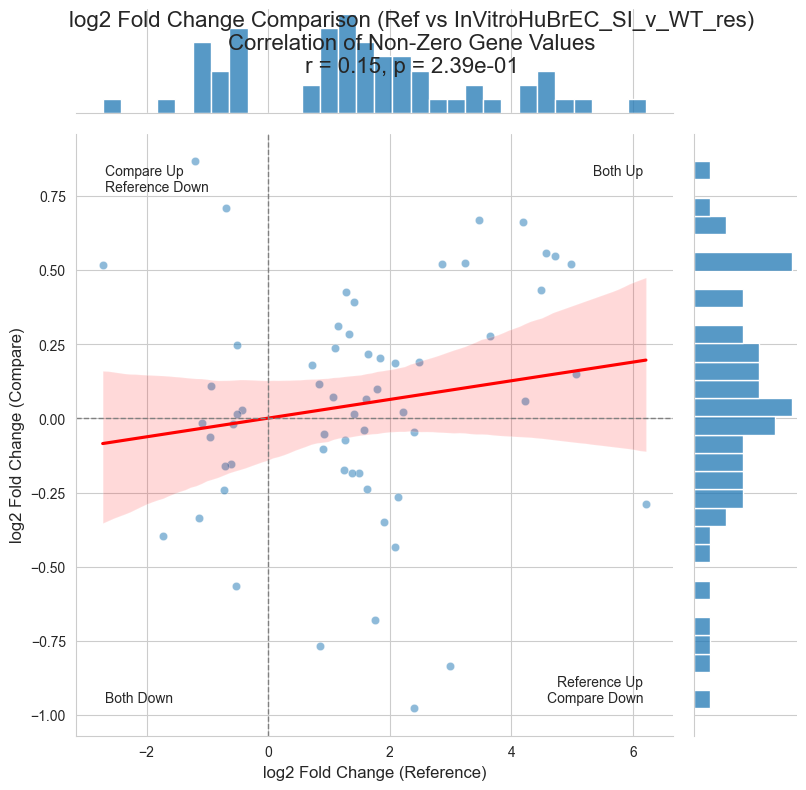

<Figure size 1200x800 with 0 Axes>

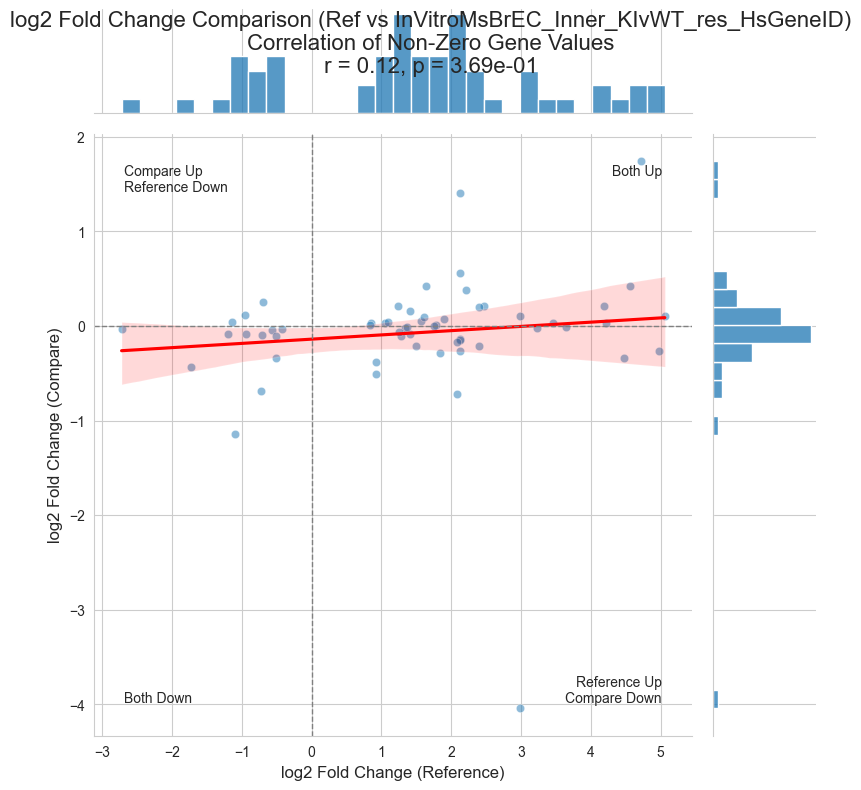

<Figure size 1200x800 with 0 Axes>

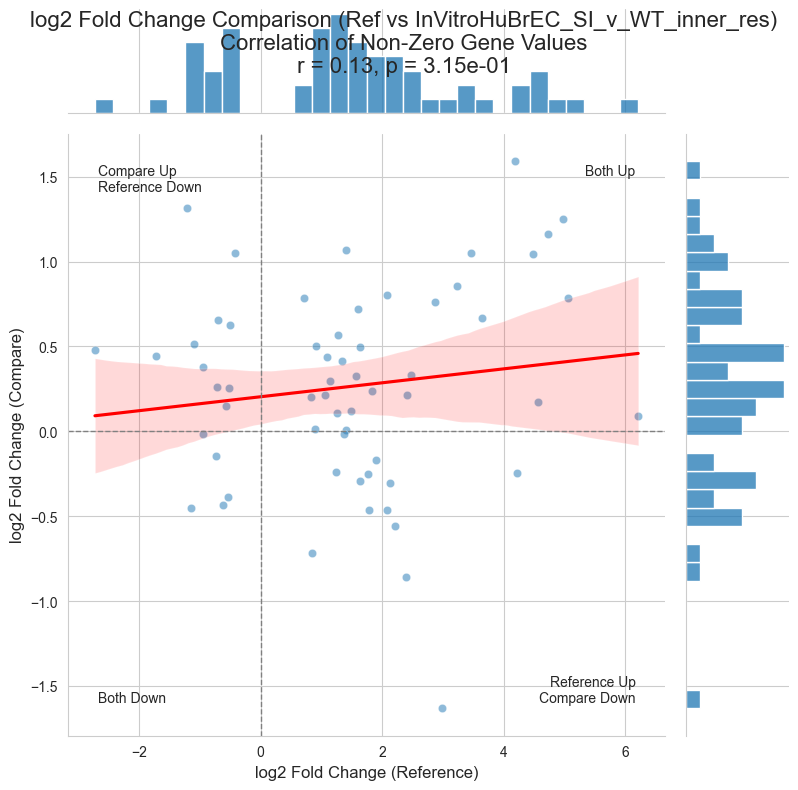

<Figure size 1200x800 with 0 Axes>

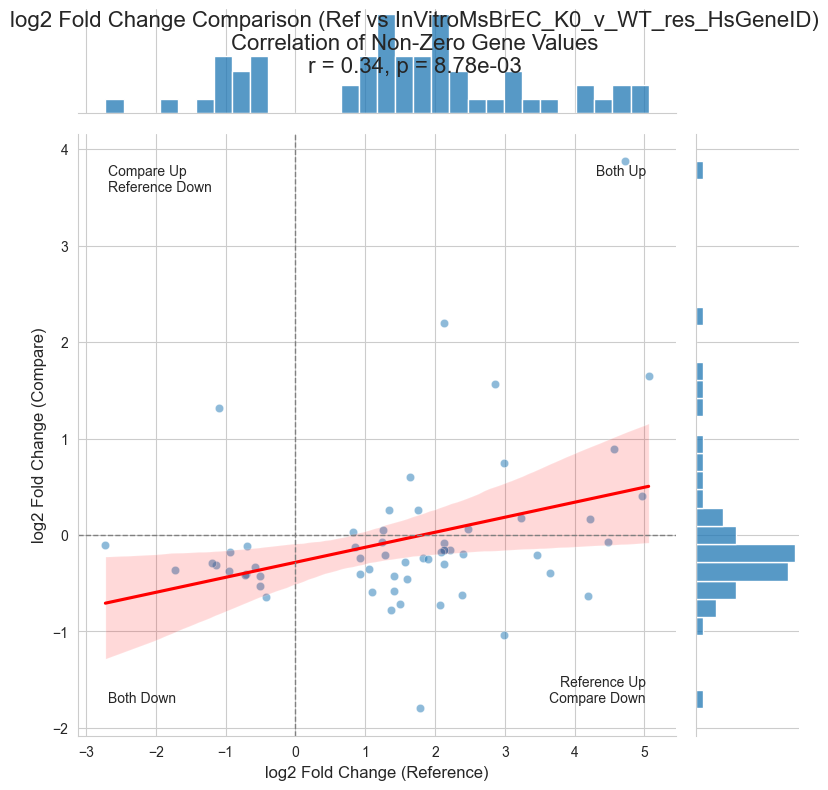

<Figure size 1200x800 with 0 Axes>

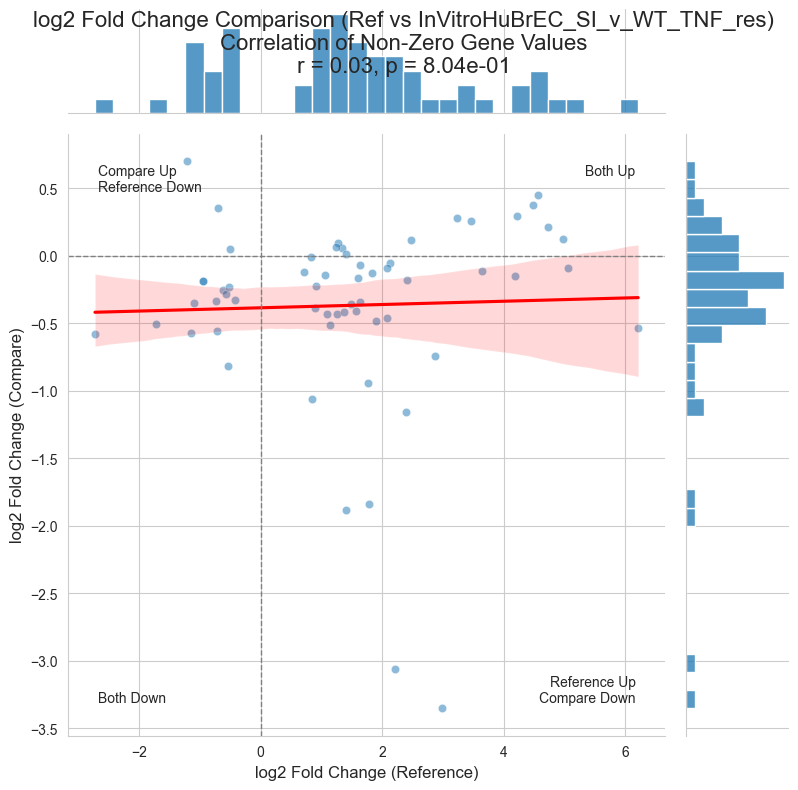

<Figure size 1200x800 with 0 Axes>

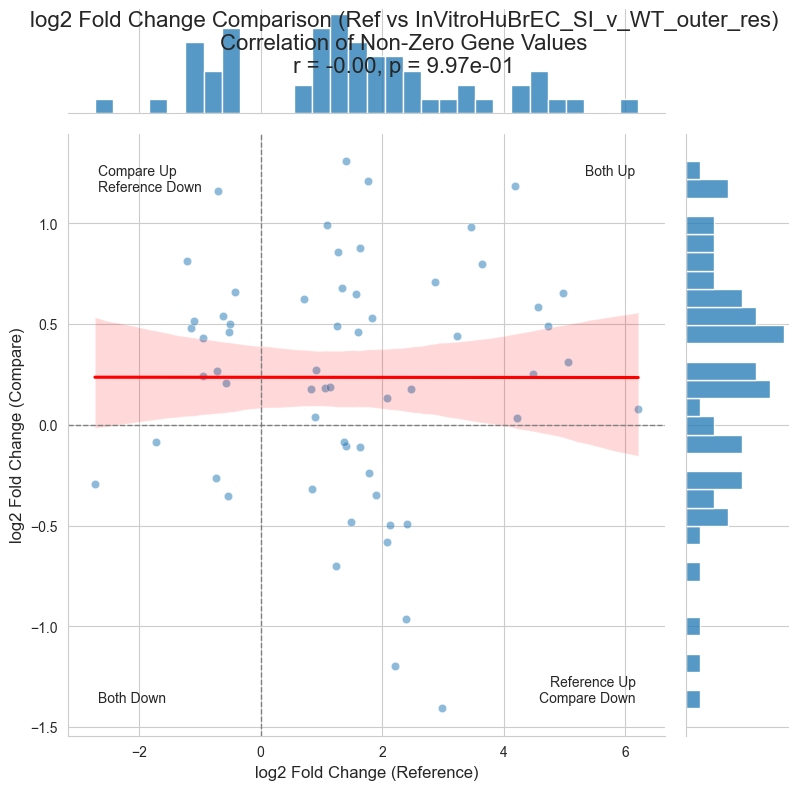

<Figure size 1200x800 with 0 Axes>

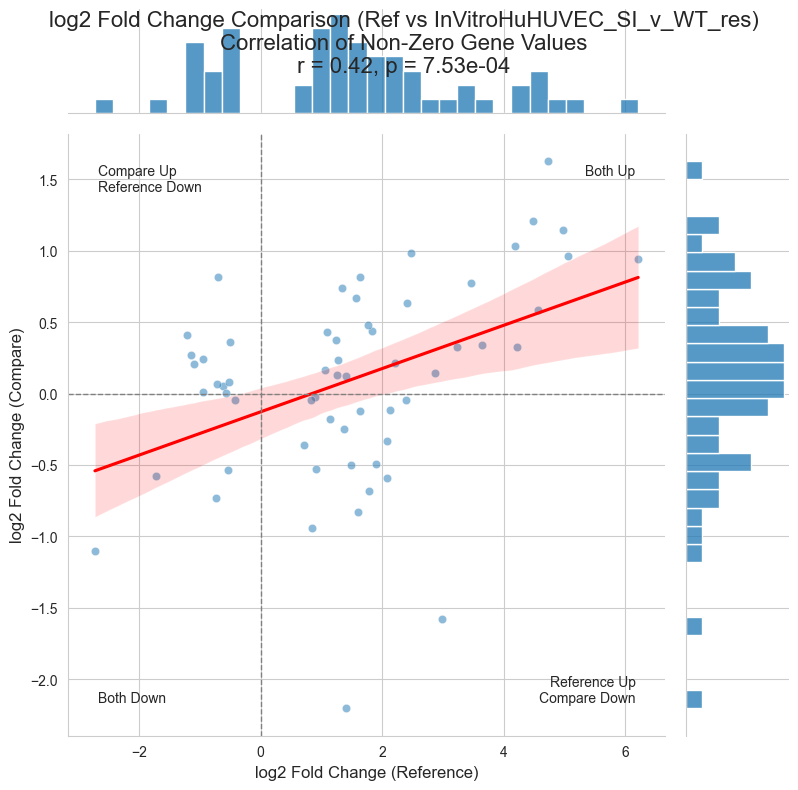

<Figure size 1200x800 with 0 Axes>

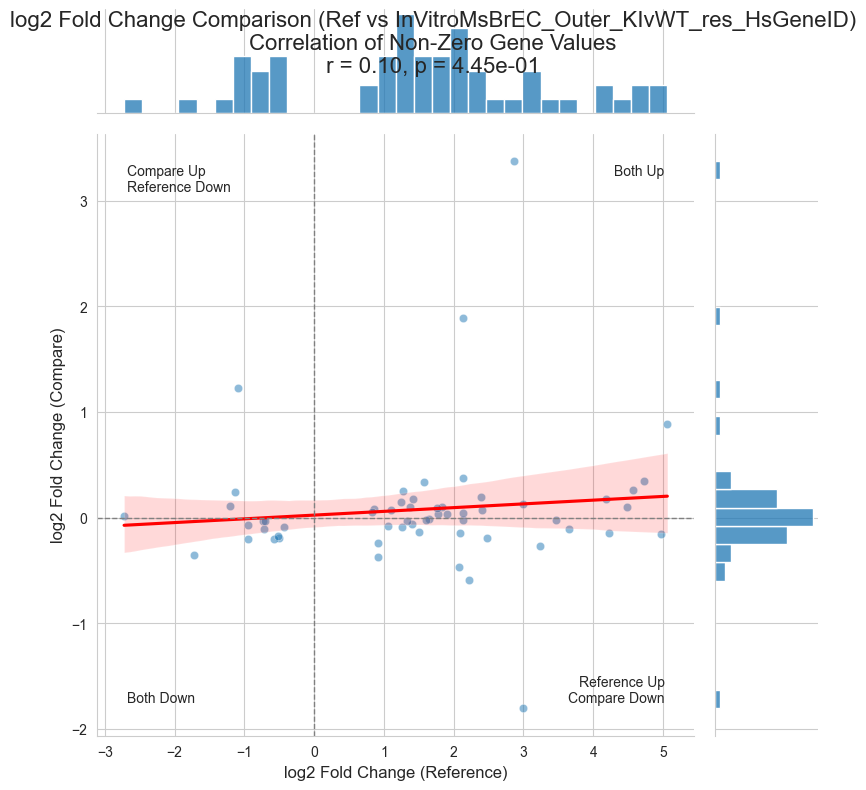

<Figure size 1200x800 with 0 Axes>

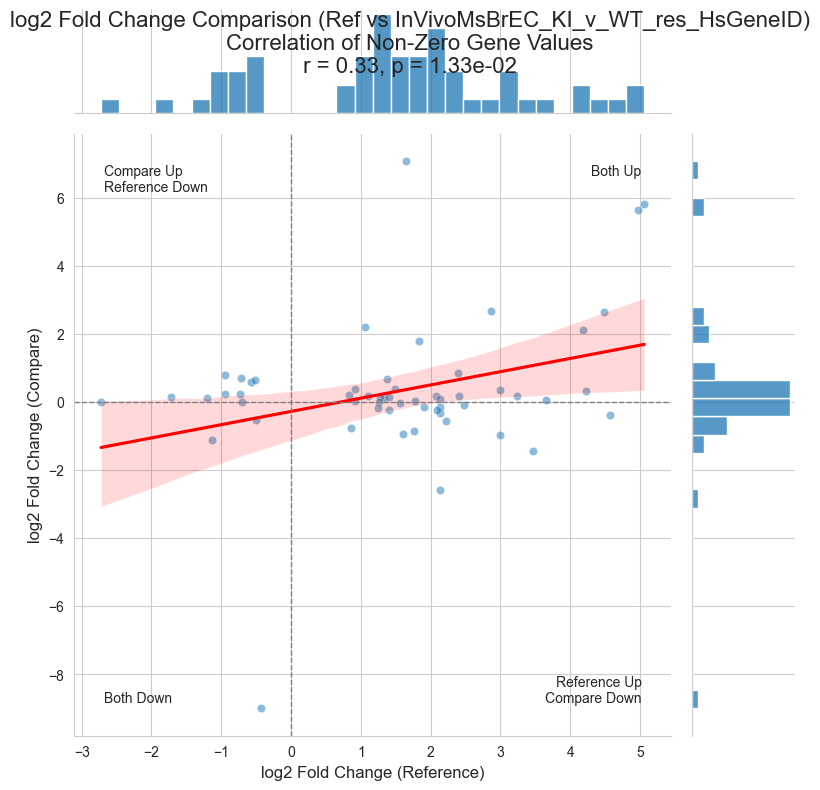

<Figure size 1200x800 with 0 Axes>

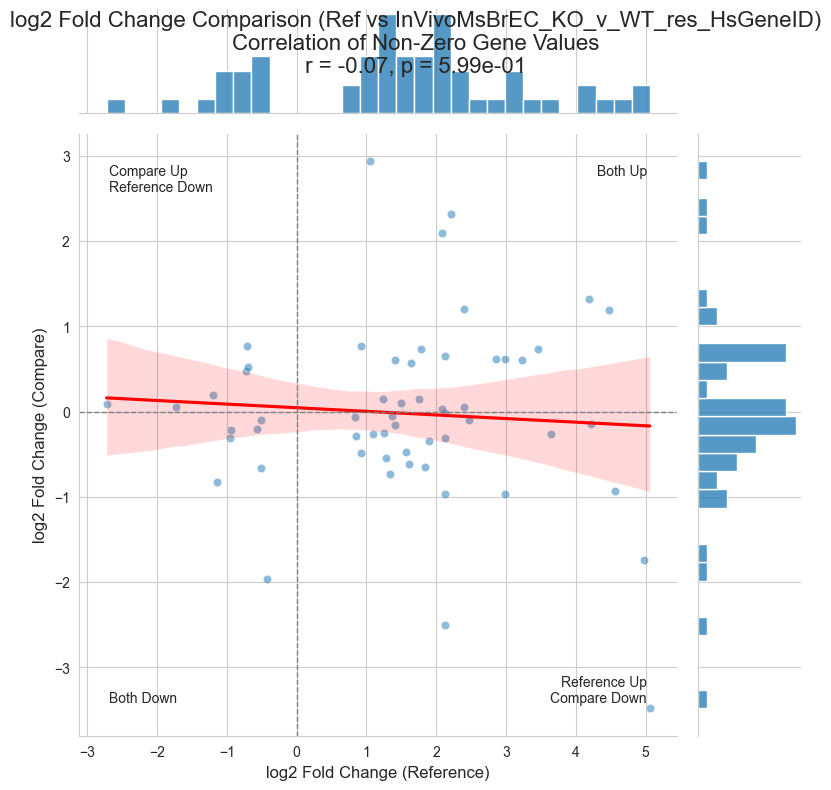

<Figure size 1200x800 with 0 Axes>

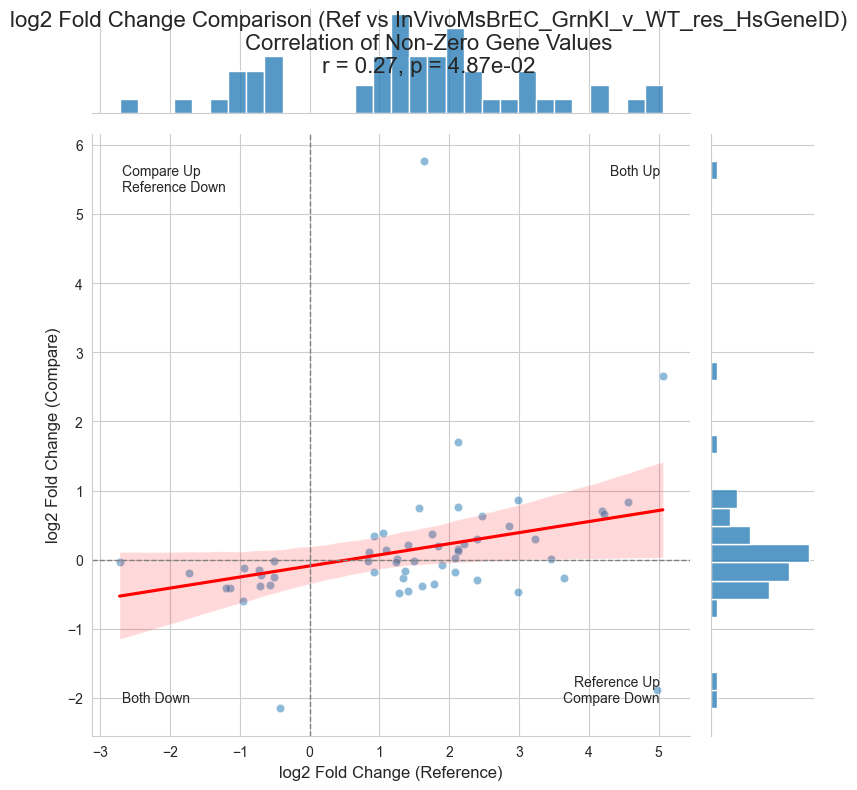

<Figure size 1200x800 with 0 Axes>

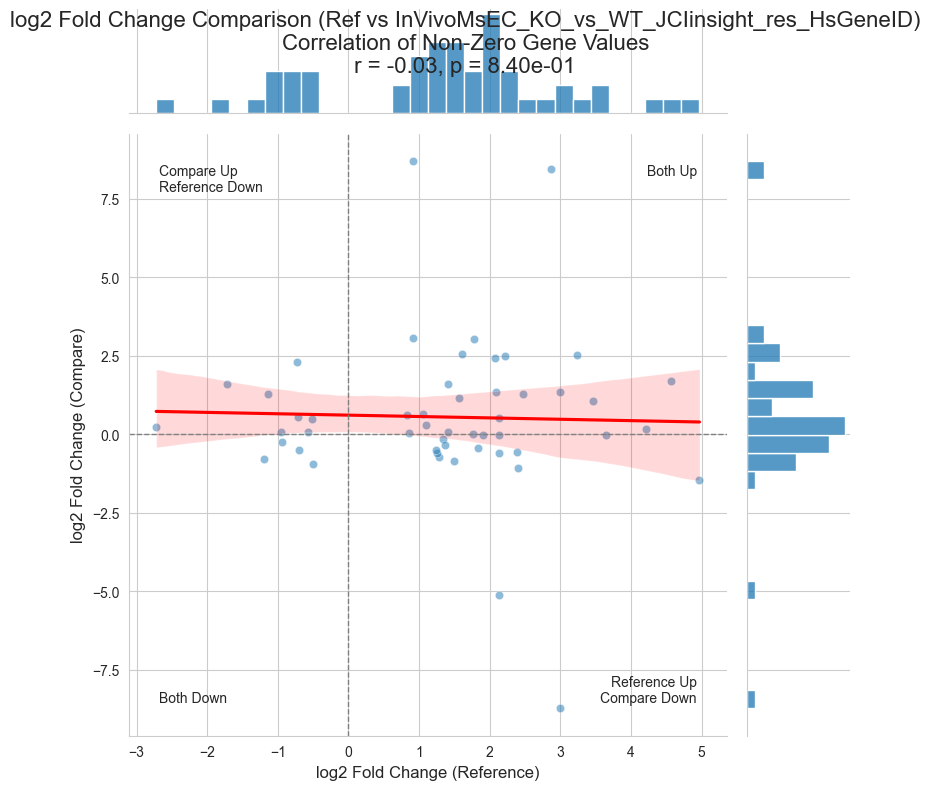

In [164]:
# To extract a specific gene set
gene_set_name = "HuAEC_TNF_Up" #Replace with your actual gene set name
#gene_set_name = "p3_iPSC_EC_CHIRvDMSO_PMID34755601_Down" #Replace with your actual gene set name
gsea_term_genes = custom_endo_human_genesets.get(gene_set_name, [])

# Convert the set of genes to a list for the DataFrame index
gsea_term_genes_list = list(gsea_term_genes)

df_dict_humangene_res = {
    'InVitroMsBrEC_KI_v_WT_res_HsGeneID': InVitroMsBrEC_KI_v_WT_res_HsGeneID,
    'InvivoCarotid_Lig_WTvKO_res_HsGeneID': InvivoCarotid_Lig_WTvKO_res_HsGeneID,
    'InVitroMsBrEC_TNF_KIvWT_res_HsGeneID': InVitroMsBrEC_TNF_KIvWT_res_HsGeneID,
    'InVitroHuHBEC_SI_v_WT_res': InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res_HsGeneID': InvivoCarotid_Contra_WTvKO_res_HsGeneID, 
    'InVitroHuBrEC_SI_v_WT_res': InVitroHuBrEC_SI_v_WT_res,
    'InVitroMsBrEC_Inner_KIvWT_res_HsGeneID': InVitroMsBrEC_Inner_KIvWT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_inner_res': InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res_HsGeneID': InVitroMsBrEC_K0_v_WT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_TNF_res': InVitroHuBrEC_TNF_siTDP43vWT_res,
    'InVitroHuBrEC_SI_v_WT_outer_res': InVitroHuBrEC_SI_v_WT_outer_res,
    'InVitroHuHUVEC_SI_v_WT_res': InVitroHuHUVEC_SI_v_WT_res,
    'InVitroMsBrEC_Outer_KIvWT_res_HsGeneID': InVitroMsBrEC_Outer_KIvWT_res_HsGeneID,
    'InVivoMsBrEC_KI_v_WT_res_HsGeneID': InVivoMsBrEC_KI_v_WT_res_HsGeneID,
    'InVivoMsBrEC_KO_v_WT_res_HsGeneID': InVivoMsBrEC_KO_v_WT_res_HsGeneID,
    'InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID': InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID,
    'InVivoMsEC_KO_vs_WT_JCIinsight_res_HsGeneID' : InVivoMsEC_KO_vs_WT_JCIinsight_res_HsGeneID,
    'InVivoNuclei_Clust1v3_res_format': InVivoNuclei_Clust1v3_res_formatted
}

# Set the font type to ensure text blocks are preserved
rcParams['pdf.fonttype'] = 42

# Function to join, filter, and plot for a single comparison DataFrame
def plot_log2foldchange_comparison(reference_df, compare_df, title, save_dir, compare_name):
    # Rename overlapping columns in reference_df (or compare_df if preferred)
    reference_df = reference_df.rename(
        columns={'pvalue': 'pvalue_ref', 'padj': 'padj_ref', 'log2FoldChange': 'log2FoldChange_ref'}
    )
    compare_df = compare_df.rename(
        columns={'pvalue': 'pvalue_comp', 'padj': 'padj_comp', 'log2FoldChange': 'log2FoldChange_comp'}
    )
    joined_df = reference_df.join(compare_df[['pvalue_comp', 'padj_comp', 'log2FoldChange_comp']], how='outer')
    filtered_df = joined_df.dropna(subset=['log2FoldChange_ref', 'log2FoldChange_comp'])
    filtered_df = filtered_df.rename(columns={'Unnamed: 0': 'gene_id'})
    filtered_df = filtered_df[(filtered_df['pvalue_ref'] < 0.05) | (filtered_df['pvalue_comp'] < 0.05)]
    filtered_df = filtered_df[(filtered_df['log2FoldChange_ref'] > -10) & (filtered_df['log2FoldChange_ref'] < 10)]
    filtered_df = filtered_df[(filtered_df['log2FoldChange_comp'] > -10) & (filtered_df['log2FoldChange_comp'] < 10)]
    
    # Filter for genes in the gene_list
    filtered_df = filtered_df[filtered_df.index.isin(gsea_term_genes_list)]
    
    log2fold_ref = filtered_df['log2FoldChange_ref']
    log2fold_comp = filtered_df['log2FoldChange_comp']
    
    # Calculate the correlation
    correlation, p_value = stats.pearsonr(log2fold_ref, log2fold_comp)

    # Create an enhanced scatter plot
    plt.figure(figsize=(12, 8))
    sns.set_style("whitegrid")

    # Create a joint plot
    g = sns.jointplot(
        x=log2fold_ref, 
        y=log2fold_comp, 
        kind="scatter",
        height=8,
        marginal_kws=dict(bins=30, fill=True),
        joint_kws=dict(alpha=0.5)
    )

    # Add a regression line
    sns.regplot(x=log2fold_ref, y=log2fold_comp, scatter=False, ax=g.ax_joint, color="red")

    # Customize the plot
    g.ax_joint.set_xlabel('log2 Fold Change (Reference)', fontsize=12)
    g.ax_joint.set_ylabel('log2 Fold Change (Compare)', fontsize=12)
    g.fig.suptitle(f'{title}\nCorrelation of Non-Zero Gene Values\nr = {correlation:.2f}, p = {p_value:.2e}', fontsize=16)

    # Add quadrant lines
    g.ax_joint.axhline(y=0, color='gray', linestyle='--', linewidth=1)
    g.ax_joint.axvline(x=0, color='gray', linestyle='--', linewidth=1)

    # Add text annotations for quadrants
    g.ax_joint.text(0.95, 0.95, 'Both Up', ha='right', va='top', transform=g.ax_joint.transAxes)
    g.ax_joint.text(0.05, 0.95, 'Compare Up\nReference Down', ha='left', va='top', transform=g.ax_joint.transAxes)
    g.ax_joint.text(0.95, 0.05, 'Reference Up\nCompare Down', ha='right', va='bottom', transform=g.ax_joint.transAxes)
    g.ax_joint.text(0.05, 0.05, 'Both Down', ha='left', va='bottom', transform=g.ax_joint.transAxes)

    # Save the plot to a PDF
    pdf_path = os.path.join(save_dir, f'{compare_name}.pdf')
    with PdfPages(pdf_path) as pdf:
        pdf.savefig(g.fig)
    plt.show(g.fig)
    
    plt.close(g.fig)

# Example usage:
# Create a directory for saving the plots
save_dir = '/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/Cluster0_vs_Cluster3_genewise_TNF_Up/'
os.makedirs(save_dir, exist_ok=True)

# Reference DataFrame (assuming you have a separate reference)
reference_df = df_dict_humangene_res['InVivoNuclei_Clust1v3_res_format']  # Example reference

# Loop through comparison DataFrames in the dictionary
for compare_name, compare_df in df_dict_humangene_res.items():
    # Skip the reference DataFrame (if it's included in the dictionary)
    if compare_name == 'InVivoNuclei_Clust1v3_res_format':
        continue
    title = f'log2 Fold Change Comparison (Ref vs {compare_name})'
    plot_log2foldchange_comparison(reference_df, compare_df, title, save_dir, compare_name)


In [117]:
InvivoCarotid_Lig_WTvKO_res_HsGeneID

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
NaN,876.254488,-0.659721,0.295056,-2.235916,0.025357,0.619674
NaN,2066.542682,0.047767,0.279188,0.171093,0.864151,0.996792
NaN,267.921926,0.336988,0.398663,0.845296,0.397946,0.976713
NaN,447.813904,0.098292,0.372835,0.263633,0.792063,0.994375
NaN,245.533098,-0.082444,0.367891,-0.224101,0.822679,0.994636
...,...,...,...,...,...,...
ZYX,21954.448944,0.393087,0.221236,1.776774,0.075605,0.915787
ZZEF1,584.454352,0.016579,0.368259,0.045020,0.964092,0.998400
ZZZ3,1074.440874,0.167865,0.292859,0.573195,0.566513,0.976713
ASIP,0.000000,NaN,NaN,NaN,NaN,NaN


# Create RNK files for GSEA

In [180]:
InVitroMsBrEC_KI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_KI_v_WT_res.txt", sep=" ")
InVivoMsBrEC_KI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVivoTardbpKI_KI_v_WT_res_2v4.txt", sep=" ")
InvivoCarotid_Lig_WTvKO_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InvivoCarotid_Lig_WTvKO_res.txt", sep=" ")
InVitroMsBrEC_TNF_KIvWT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_TNF_KIvWT_res.txt", sep=" ")
InVitroHuHBEC_SI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuHBEC_SI_v_WT_res.txt", sep=" ")
InVivoMsBrEC_KO_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVivoTardbpECKO_KO_v_WT_res_6v6.txt", sep=" ")
InVivoMsBrEC_GrnKI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVivoGrnKI_KI_v_WT_res_4v2.txt", sep=" ")
InvivoCarotid_Contra_WTvKO_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InvivoCarotid_Contra_WTvKO_res.txt", sep=" ")
InVitroHuBrEC_SI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuBrEC_SI_v_WT_res.txt", sep=" ")
InVitroMsBrEC_Inner_KIvWT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_Inner_KIvWT_res.txt", sep=" ")
InVitroHuBrEC_Inner_siTDP43vWT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuBrEC_Inner_siTDP43vWT_res.txt", sep=" ")
InVitroMsBrEC_K0_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_K0_v_WT_res.txt", sep=" ")
InVitroHuBrEC_TNF_siTDP43vWT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuBrEC_TNF_siTDP43vWT_res.txt", sep=" ")
InVitroHuBrEC_SI_v_WT_outer_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuBrEC_SI_v_WT_outer_res.txt", sep=" ")
InVitroHuHUVEC_SI_v_WT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroHuHUVEC_SI_v_WT_res.txt", sep=" ")
InVitroMsBrEC_Outer_KIvWT_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/InVitroMsBrEC_Outer_KIvWT_res.txt", sep=" ")
InVivoNuclei_Clust1v3_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/Capillary_c1v3.csv")
InVivoMsEC_KO_vs_WT_JCIinsight_res = pd.read_csv("/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/2023_DESeq2_RSEM_Counts/MusJCI_EC_KO_v_WT_res.txt", sep=" ")


In [181]:
#Create RNK files for GSEA from DESeq2 data

# Original DataFrame names and objects
df_dict = {
    'InVitroMsBrEC_KI_v_WT_res': InVitroMsBrEC_KI_v_WT_res,
    'InvivoCarotid_Lig_WTvKO_res': InvivoCarotid_Lig_WTvKO_res,
    'InVitroMsBrEC_TNF_KIvWT_res': InVitroMsBrEC_TNF_KIvWT_res,
    'InVitroHuHBEC_SI_v_WT_res' : InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res' : InvivoCarotid_Contra_WTvKO_res, 
    'InVitroHuBrEC_SI_v_WT_res' : InVitroHuBrEC_SI_v_WT_res,
    'InVitroMsBrEC_Inner_KIvWT_res' : InVitroMsBrEC_Inner_KIvWT_res,
    'InVitroHuBrEC_Inner_siTDP43vWT_res' : InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res' : InVitroMsBrEC_K0_v_WT_res,
    'InVitroHuBrEC_TNF_siTDP43vWT_res' : InVitroHuBrEC_TNF_siTDP43vWT_res,
    'InVitroHuBrEC_SI_v_WT_outer_res' : InVitroHuBrEC_SI_v_WT_outer_res,
    'InVitroHuHUVEC_SI_v_WT_res' : InVitroHuHUVEC_SI_v_WT_res,
    'InVitroMsBrEC_Outer_KIvWT_res' : InVitroMsBrEC_Outer_KIvWT_res,
    'InVivoMsBrEC_KI_v_WT_res' : InVivoMsBrEC_KI_v_WT_res,
    'InVivoMsBrEC_KO_v_WT_res' : InVivoMsBrEC_KO_v_WT_res,
    'InVivoMsBrEC_GrnKI_v_WT_res' : InVivoMsBrEC_GrnKI_v_WT_res,
    'InVivoMsEC_KO_vs_WT_JCIinsight_res' : InVivoMsEC_KO_vs_WT_JCIinsight_res
}

# New DataFrame dictionary
new_df_dict = {}

# Iterating through each item in the df_dict dictionary
for name, df in df_dict.items():
    # Filtering the DataFrame to keep only rows by baseMean
    df = df[df['baseMean'] >= 200]

    # Selecting only the 'log2FoldChange' column
    new_df = df[['log2FoldChange']]
    # Sorting the values based on 'log2FoldChange' in descending order
    new_df = new_df.sort_values(by='log2FoldChange', ascending=False)
    # Assigning no column names
    new_df.columns = ['']
    # Creating the new name by replacing 'res' with 'Log2FC' in the original name
    new_name = name.replace('_res', '_Log2FC')
    # Adding the new DataFrame to the new_df_dict dictionary with the new name
    new_df_dict[new_name] = new_df

# Assigning each DataFrame to a variable with its name
for name in new_df_dict:
    globals()[name] = new_df_dict[name]

In [182]:
# Create a dictionary where keys are names and values are dataframes
dfs_dict = {
    'InVitroMsBrEC_KI_v_WT_Log2FC': InVitroMsBrEC_KI_v_WT_Log2FC,
    'InvivoCarotid_Lig_WTvKO_Log2FC': InvivoCarotid_Lig_WTvKO_Log2FC,
    'InVitroMsBrEC_TNF_KIvWT_Log2FC': InVitroMsBrEC_TNF_KIvWT_Log2FC,
    'InvivoCarotid_Contra_WTvKO_Log2FC': InvivoCarotid_Contra_WTvKO_Log2FC,
    'InVitroMsBrEC_Inner_KIvWT_Log2FC': InVitroMsBrEC_Inner_KIvWT_Log2FC,
    'InVitroMsBrEC_K0_v_WT_Log2FC': InVitroMsBrEC_K0_v_WT_Log2FC,
    'InVitroMsBrEC_Outer_KIvWT_Log2FC': InVitroMsBrEC_Outer_KIvWT_Log2FC,
    'InVivoMsBrEC_KI_v_WT_Log2FC': InVivoMsBrEC_KI_v_WT_Log2FC,
    'InVivoMsBrEC_KO_v_WT_Log2FC': InVivoMsBrEC_KO_v_WT_Log2FC,
    'InVivoMsBrEC_GrnKI_v_WT_Log2FC': InVivoMsBrEC_GrnKI_v_WT_Log2FC
}

def transform_dataframe(df, m2h_dict):
    df = df.reset_index()
    df.columns = ['GeneID', 'Value']
    df['Human_GeneID'] = df['GeneID'].map(m2h_dict)
    df.set_index('Human_GeneID', inplace=True)
    df = df[['Value']]
    return df

# Apply the function to every dataframe in the dictionary
for df_name, df in dfs_dict.items():
    transformed_df = transform_dataframe(df, m2h_dict)
    new_var_name = f"{df_name}_HsGeneID"
    globals()[new_var_name] = transformed_df

In [183]:
#Create RNK files for DESeq2 from single nuclei analysis

# Original DataFrame names and objects
df_dict = {
    'InVivoNuclei_Clust1v3_res': InVivoNuclei_Clust1v3_res
}

new_df_dict = {}

# Iterating through each item in the df_dict dictionary
for name, df in df_dict.items():
    # Set '1_names' as the index
    df = df.set_index('1_names')
    
    # Selecting only the columns that contain 'logfoldchanges'
    selected_columns = [col for col in df.columns if 'logfoldchanges' in col.lower()]
    new_df = df[selected_columns]
    
    # If selected_columns is not empty, proceed to sort and other operations
    if selected_columns:
        # Sorting the values based on the selected column in descending order
        new_df = new_df.sort_values(by=selected_columns[0], ascending=False)
        
        # Assigning no column names
        new_df.columns = ['']
        
        # Creating the new name by replacing 'res' with 'Log2FC' in the original name
        new_name = name.replace('_res', '_Log2FC')
        
        # Adding the new DataFrame to the new_df_dict dictionary with the new name
        new_df_dict[new_name] = new_df
    
# Assigning each DataFrame to a variable with its name
for name in new_df_dict:
    globals()[name] = new_df_dict[name]

# Convert RNK files from mouse to human

# Get GSEA Public Datasets

In [184]:
# Create a dictionary where keys are names and values are dataframes
dfs_dict = {
    'InVitroMsBrEC_KI_v_WT_Log2FC': InVitroMsBrEC_KI_v_WT_Log2FC,
    'InvivoCarotid_Lig_WTvKO_Log2FC': InvivoCarotid_Lig_WTvKO_Log2FC,
    'InVitroMsBrEC_TNF_KIvWT_Log2FC': InVitroMsBrEC_TNF_KIvWT_Log2FC,
    'InvivoCarotid_Contra_WTvKO_Log2FC': InvivoCarotid_Contra_WTvKO_Log2FC,
    'InVitroMsBrEC_Inner_KIvWT_Log2FC': InVitroMsBrEC_Inner_KIvWT_Log2FC,
    'InVitroMsBrEC_K0_v_WT_Log2FC': InVitroMsBrEC_K0_v_WT_Log2FC,
    'InVitroMsBrEC_Outer_KIvWT_Log2FC': InVitroMsBrEC_Outer_KIvWT_Log2FC,
    'InVivoMsBrEC_KI_v_WT_Log2FC': InVivoMsBrEC_KI_v_WT_Log2FC,
    'InVivoMsBrEC_KO_v_WT_Log2FC': InVivoMsBrEC_KO_v_WT_Log2FC,
    'InVivoMsBrEC_GrnKI_v_WT_Log2FC': InVivoMsBrEC_GrnKI_v_WT_Log2FC,
    'InVivoMsEC_KO_vs_WT_JCIinsight_Log2FC': InVivoMsEC_KO_vs_WT_JCIinsight_Log2FC
}

def transform_dataframe(df, m2h_dict):
    df = df.reset_index()
    df.columns = ['GeneID', 'Value']
    df['Human_GeneID'] = df['GeneID'].map(m2h_dict)
    df.set_index('Human_GeneID', inplace=True)
    df = df[['Value']]
    return df

# Apply the function to every dataframe in the dictionary
for df_name, df in dfs_dict.items():
    transformed_df = transform_dataframe(df, m2h_dict)
    new_var_name = f"{df_name}_HsGeneID"
    globals()[new_var_name] = transformed_df

In [185]:
# Get all library names
all_names = gseapy.get_library_name()

# Filter names that contain the string "XXX"
#filt_names = [name for name in all_names if "KEGG" in name]
#filt_names = [name for name in all_names if "React" in name]
filt_names = [name for name in all_names if "GO" in name]

# Display the first 10
print(filt_names[:10])

['GO_Biological_Process_2013', 'GO_Biological_Process_2015', 'GO_Biological_Process_2017', 'GO_Biological_Process_2017b', 'GO_Biological_Process_2018', 'GO_Biological_Process_2021', 'GO_Biological_Process_2023', 'GO_Cellular_Component_2013', 'GO_Cellular_Component_2015', 'GO_Cellular_Component_2017']


# Get GSEA Custom datasets (and convert mouse to human)

In [186]:
# Replace 'your_file.csv' with the path to your .csv file
file_path_human = '/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/CreationCustomGeneSetList/CustomGeneSetsHum2023.csv'

# Read the first three rows without considering them as headers
header_df = pd.read_csv(file_path_human, nrows=3, header=None)

# Merge the headers
merged_headers = ["_".join(header_df.iloc[:, col].astype(str)) for col in range(header_df.shape[1])]

# Read the rest of the file using the merged headers as column names, skipping the first four rows (including the original header)
df_human = pd.read_csv(file_path_human, skiprows=4, names=merged_headers)

# Initialize an empty dictionary
custom_endo_human_genesets = {}

# Iterate over the columns in the DataFrame
for column in df_human.columns:
    # Add a new key-value pair to the dictionary
    # Key: merged header, Value: list of non-null genes in that column
    custom_endo_human_genesets[column] = df_human[column].dropna().tolist()

In [187]:
# Replace 'your_file.csv' with the path to your .csv file
file_path_mouse = '/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/CreationCustomGeneSetList/CustomGeneSetsMus2023.csv'

# Read the first three rows without considering them as headers
header_df = pd.read_csv(file_path_mouse, nrows=3, header=None)

# Merge the headers
merged_headers = ["_".join(header_df.iloc[:, col].astype(str)) for col in range(header_df.shape[1])]

# Read the rest of the file using the merged headers as column names, skipping the first four rows (including the original header)
df_mouse = pd.read_csv(file_path_mouse, skiprows=4, names=merged_headers)

# Initialize an empty dictionary
custom_endo_mus_genesets = {}

# Iterate over the columns in the DataFrame
for column in df_mouse.columns:
    # Add a new key-value pair to the dictionary
    # Key: merged header, Value: list of non-null genes in that column
    custom_endo_mus_genesets[column] = df_mouse[column].dropna().tolist()

In [188]:
def convert_mouse_to_human_genesets(custom_endo_mus_genesets, m2h_dict):

  custom_endo_mus_HsID_genesets = {}
  for geneset_name, mouse_genes in custom_endo_mus_genesets.items():
    human_genes = []
    for mouse_gene in mouse_genes:
      # Handle missing entries in m2h_dict gracefully (e.g., keep the original gene name)
      human_gene = m2h_dict.get(mouse_gene, mouse_gene)
      human_genes.append(human_gene)
    custom_endo_mus_HsID_genesets[geneset_name] = human_genes

  return custom_endo_mus_HsID_genesets

custom_endo_mus_HsID_genesets = convert_mouse_to_human_genesets(custom_endo_mus_genesets, m2h_dict)

In [189]:
def transform_gene_id(gene_id, mapping_dict):
    # Return the mapped gene ID or the original if not found in the mapping
    return mapping_dict.get(gene_id, gene_id)

def transform_dataframe(df_mouse, mapping_dict):
    # Apply transformation to each cell in the DataFrame
    return df_mouse.applymap(lambda x: transform_gene_id(x, mapping_dict))

# Apply the transformation
transformed_df = transform_dataframe(df_mouse, m2h_dict)

# Optionally, save the transformed DataFrame with a new variable name
df_mouse_HsGeneID = transformed_df


/var/folders/jg/0_nc4hf97r35tfbtk88gdln40000gn/T/ipykernel_17921/3190091879.py:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.


In [190]:
df_mouse_HsGeneID

,MsAEC_TNF_Up,MsAEC_LPS_Up,MsAEC_l1b_Up,MsAEC_Plasma_v_basal_Up,MsAEC_Serum_v_plasma_Up,Carotid_Low_v_High_Up,Carotid_AntiplatletLow_v_Low_Up,Carotid_ClodronatelLow_v_Low_Up,Carotid_RibotagLow_v_High_Up,BrainEC_TardbpECKO_6v6_invivo_Up,...,ArterialEC_PMID32091396_S1p_GFPlow,ArterialEC_PMID32091396_S1p_GFPhi,ArterialEC_PMID32091396_S1pECKO_Down,ArterialEC_PMID32091396_S1pECKO_Up,BrainEC_PMID32234477_Up_AMP_v_YMP,BrainEC_PMID32234477_Down_AMP_v_YMP,CardiacEC_PMID28239661_KLF2KL4_dKO_Up,CardiacEC_PMID28239661_KLF2KL4_dKO_Down,Cultured_BrainECsAll_bCatenin_PMID34755601_Down,Cultured_BrainECsAll_bCatenin_PMID34755601_Up
0,CCL7,,LCN2,CA2,LCN2,ANGPT2,FAM83D,TREML4,FAM184A,SHCBP1,...,Hbb-b1,DUOXA2,KLK3,PRND,RPL13,GBP5,CXCL3,RNU6-1305P,Raet1b,ESR1
1,,CCL7,,1810011O10Rik,SERPINA3,CD177,TG,Pira6,,PIMREG,...,Hbb-b2,NTS,KLK3,Clca5,,IFIT1B,SLC26A9,,CRHBP,GRIN2A
2,,,IL6,2210404O07Rik,CCL7,KIT,MXD3,LY6S,TRIM29,ACKR2,...,LGR6,TEC,GRIA1,NOS2,PPP1R16B,ARID5A,TMEM212,,,
3,CCL20,IL6,CCL7,ANGPTL4,SERPINA3,CD300LF,PRND,,PTGER2,BUB1B,...,Beta-s,OTOS,F13A1,CD2,,,,CYP1A1,,FOSB
4,GBP5,CXCL6,,FKBP5,,IL1B,TREM1,LRRC55,IGFBP2,SPRN,...,CCL15,PDCD1,KLK3,,KDELR2,RTP4,GKN1,,LARS2,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197,STX11,Gm5803,PDLIM4,MFAP2,Gm12603,,ANKRD1,TIFAB,UBASH3B,CDCA7L,...,ABCC9,Hist1h2bb,NaN,GBP6,NaN,NaN,SHROOM2,ANXA8L1,BMP2,AIM2
198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,,Gm21747,NaN,SLC35F1
199,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,CCNF,NaN,NaN,NaN
200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Hist1h2bk,NaN,NaN,NaN


In [191]:
# Initialize an empty dictionary
custom_endo_mus_HsID_genesets = {}

# Iterate over the columns in the DataFrame
for column in df_mouse_HsGeneID.columns:
    # Add a new key-value pair to the dictionary
    # Key: merged header, Value: list of non-null genes in that column
    custom_endo_mus_HsID_genesets[column] = df_mouse_HsGeneID[column].dropna().tolist()

# custom_endo_genesets now contains your gene sets in the desired format

# Run GSEA (three searches, for Public, Custom Mouse and Custom Human Sets)

In [192]:
import gseapy

# List available gene set libraries
libraries = gseapy.get_library_name()
print(libraries)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'Diabetes_Perturbations_GEO_2022', 'DisGeNET', 'Disease_Per

In [193]:
# Assume df_list is your list of DataFrames
df_list = [
            #InVitroHuHBEC_SI_v_WT_Log2FC,
            InVitroHuBrEC_SI_v_WT_Log2FC,
            InVitroHuBrEC_Inner_siTDP43vWT_Log2FC,
            InVitroHuBrEC_TNF_siTDP43vWT_Log2FC,
            InVitroHuBrEC_SI_v_WT_outer_Log2FC,
            InVitroHuHUVEC_SI_v_WT_Log2FC,
            InVitroMsBrEC_KI_v_WT_Log2FC_HsGeneID, 
            InvivoCarotid_Lig_WTvKO_Log2FC_HsGeneID, 
            InVitroMsBrEC_TNF_KIvWT_Log2FC_HsGeneID, 
            InvivoCarotid_Contra_WTvKO_Log2FC_HsGeneID, 
            InVitroMsBrEC_Inner_KIvWT_Log2FC_HsGeneID, 
            InVitroMsBrEC_K0_v_WT_Log2FC_HsGeneID, 
            InVitroMsBrEC_Outer_KIvWT_Log2FC_HsGeneID,
            InVivoMsBrEC_KI_v_WT_Log2FC_HsGeneID, 
            InVivoMsBrEC_KO_v_WT_Log2FC_HsGeneID, 
            #InVivoMsBrEC_GrnKI_v_WT_Log2FC_HsGeneID,
            InVivoMsEC_KO_vs_WT_JCIinsight_Log2FC_HsGeneID,
            InVivoNuclei_Clust1v3_Log2FC
            ]

# Corresponding list of names for the output
df_names = [
            #'InVitroHuHBEC_SI_v_WT_Log2FC',
            'InVitroHuBrEC_SI_v_WT_Log2FC',
            'InVitroHuBrEC_Inner_siTDP43vWT_Log2FC',
            'InVitroHuBrEC_TNF_siTDP43vWT_Log2FC',
            'InVitroHuBrEC_SI_v_WT_outer_Log2FC',
            'InVitroHuHUVEC_SI_v_WT_Log2FC',
            'InVitroMsBrEC_KI_v_WT_Log2FC_HsGeneID', 
            'InvivoCarotid_Lig_WTvKO_Log2FC_HsGeneID', 
            'InVitroMsBrEC_TNF_KIvWT_Log2FC_HsGeneID', 
            'InvivoCarotid_Contra_WTvKO_Log2FC_HsGeneID', 
            'InVitroMsBrEC_Inner_KIvWT_Log2FC_HsGeneID', 
            'InVitroMsBrEC_K0_v_WT_Log2FC_HsGeneID', 
            'InVitroMsBrEC_Outer_KIvWT_Log2FC_HsGeneID',
            'InVivoMsBrEC_KI_v_WT_Log2FC_HsGeneID', 
            'InVivoMsBrEC_KO_v_WT_Log2FC_HsGeneID', 
            #'InVivoMsBrEC_GrnKI_v_WT_Log2FC_HsGeneID',
            'InVivoMsEC_KO_vs_WT_JCIinsight_Log2FC_HsGeneID',
            'InVivoNuclei_Clust1v3_Log2FC'
            ]

# Loop through each DataFrame in the list and perform GSEA
for i, df in enumerate(df_list):
    results = gseapy.prerank(rnk=df,
                             gene_sets=custom_endo_mus_HsID_genesets,
                             threads=4,
                             min_size=5,
                             method='log2_ratio_of_classes',
                             weighted_score_type=1,
                             max_size=1000,
                             permutation_num=1000,  # reduce number to speed up testing
                             outdir=None,  # don't write to disk
                             seed=6,
                             verbose=True,  # see what's going on behind the scenes
                             )

    # If you want to assign the result to a variable with a specific name
    globals()[f'{df_names[i]}_rankedGSEA_log2_weighted1_custom'] = results

2024-06-28 15:47:16,272 [INFO] Parsing data files for GSEA.............................
2024-06-28 15:47:16,276 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=5
2024-06-28 15:47:16,277 [INFO] 0042 gene_sets used for further statistical testing.....
2024-06-28 15:47:16,277 [INFO] Start to run GSEA...Might take a while..................
2024-06-28 15:47:17,134 [INFO] Congratulations. GSEApy runs successfully................

2024-06-28 15:47:17,140 [INFO] Parsing data files for GSEA.............................
2024-06-28 15:47:17,142 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=5
2024-06-28 15:47:17,143 [INFO] 0042 gene_sets used for further statistical testing.....
2024-06-28 15:47:17,143 [INFO] Start to run GSEA...Might take a while..................
2024-06-28 15:47:17,886 [INFO] Congratulations. GSEApy runs successfully................

2024-06-28 15:47:17,889 [INFO] Parsing data files for GSEA............................

In [194]:
# Assume df_list is your list of DataFrames
df_list = [
            #InVitroHuHBEC_SI_v_WT_Log2FC,
            InVitroHuBrEC_SI_v_WT_Log2FC,
            InVitroHuBrEC_Inner_siTDP43vWT_Log2FC,
            InVitroHuBrEC_TNF_siTDP43vWT_Log2FC,
            InVitroHuBrEC_SI_v_WT_outer_Log2FC,
            InVitroHuHUVEC_SI_v_WT_Log2FC,
            InVitroMsBrEC_KI_v_WT_Log2FC_HsGeneID, 
            InvivoCarotid_Lig_WTvKO_Log2FC_HsGeneID, 
            InVitroMsBrEC_TNF_KIvWT_Log2FC_HsGeneID, 
            InvivoCarotid_Contra_WTvKO_Log2FC_HsGeneID, 
            InVitroMsBrEC_Inner_KIvWT_Log2FC_HsGeneID, 
            InVitroMsBrEC_K0_v_WT_Log2FC_HsGeneID, 
            InVitroMsBrEC_Outer_KIvWT_Log2FC_HsGeneID,
            InVivoMsBrEC_KI_v_WT_Log2FC_HsGeneID, 
            InVivoMsBrEC_KO_v_WT_Log2FC_HsGeneID, 
            #InVivoMsBrEC_GrnKI_v_WT_Log2FC_HsGeneID,
            InVivoMsEC_KO_vs_WT_JCIinsight_Log2FC_HsGeneID,
            InVivoNuclei_Clust1v3_Log2FC
            ]

# Corresponding list of names for the output
df_names = [
            #'InVitroHuHBEC_SI_v_WT_Log2FC',
            'InVitroHuBrEC_SI_v_WT_Log2FC',
            'InVitroHuBrEC_Inner_siTDP43vWT_Log2FC',
            'InVitroHuBrEC_TNF_siTDP43vWT_Log2FC',
            'InVitroHuBrEC_SI_v_WT_outer_Log2FC',
            'InVitroHuHUVEC_SI_v_WT_Log2FC',
            'InVitroMsBrEC_KI_v_WT_Log2FC_HsGeneID', 
            'InvivoCarotid_Lig_WTvKO_Log2FC_HsGeneID', 
            'InVitroMsBrEC_TNF_KIvWT_Log2FC_HsGeneID', 
            'InvivoCarotid_Contra_WTvKO_Log2FC_HsGeneID', 
            'InVitroMsBrEC_Inner_KIvWT_Log2FC_HsGeneID', 
            'InVitroMsBrEC_K0_v_WT_Log2FC_HsGeneID', 
            'InVitroMsBrEC_Outer_KIvWT_Log2FC_HsGeneID',
            'InVivoMsBrEC_KI_v_WT_Log2FC_HsGeneID', 
            'InVivoMsBrEC_KO_v_WT_Log2FC_HsGeneID', 
            #'InVivoMsBrEC_GrnKI_v_WT_Log2FC_HsGeneID',
            'InVivoMsEC_KO_vs_WT_JCIinsight_Log2FC_HsGeneID',
            'InVivoNuclei_Clust1v3_Log2FC'
            ]

# Loop through each DataFrame in the list and perform GSEA
for i, df in enumerate(df_list):
    results = gseapy.prerank(rnk=df,
                             gene_sets=custom_endo_human_genesets,
                             threads=4,
                             min_size=5,
                             method='log2_ratio_of_classes',
                             weighted_score_type=1,
                             max_size=1000,
                             permutation_num=1000,  # reduce number to speed up testing
                             outdir=None,  # don't write to disk
                             seed=6,
                             verbose=True,  # see what's going on behind the scenes
                             )

    # If you want to assign the result to a variable with a specific name
    globals()[f'{df_names[i]}_rankedGSEA_log2_weighted1_custom2'] = results

2024-06-28 15:47:27,653 [INFO] Parsing data files for GSEA.............................
2024-06-28 15:47:27,655 [INFO] 0001 gene_sets have been filtered out when max_size=1000 and min_size=5
2024-06-28 15:47:27,655 [INFO] 0034 gene_sets used for further statistical testing.....
2024-06-28 15:47:27,655 [INFO] Start to run GSEA...Might take a while..................
2024-06-28 15:47:28,518 [INFO] Congratulations. GSEApy runs successfully................

2024-06-28 15:47:28,529 [INFO] Parsing data files for GSEA.............................
2024-06-28 15:47:28,532 [INFO] 0001 gene_sets have been filtered out when max_size=1000 and min_size=5
2024-06-28 15:47:28,533 [INFO] 0034 gene_sets used for further statistical testing.....
2024-06-28 15:47:28,534 [INFO] Start to run GSEA...Might take a while..................
2024-06-28 15:47:29,486 [INFO] Congratulations. GSEApy runs successfully................

2024-06-28 15:47:29,497 [INFO] Parsing data files for GSEA............................

In [195]:
# Assume df_list is your list of DataFrames
df_list = [
            #InVitroHuHBEC_SI_v_WT_Log2FC,
            InVitroHuBrEC_SI_v_WT_Log2FC,
            InVitroHuBrEC_Inner_siTDP43vWT_Log2FC,
            InVitroHuBrEC_TNF_siTDP43vWT_Log2FC,
            InVitroHuBrEC_SI_v_WT_outer_Log2FC,
            InVitroHuHUVEC_SI_v_WT_Log2FC,
            InVitroMsBrEC_KI_v_WT_Log2FC_HsGeneID, 
            InvivoCarotid_Lig_WTvKO_Log2FC_HsGeneID, 
            InVitroMsBrEC_TNF_KIvWT_Log2FC_HsGeneID, 
            InvivoCarotid_Contra_WTvKO_Log2FC_HsGeneID, 
            InVitroMsBrEC_Inner_KIvWT_Log2FC_HsGeneID, 
            InVitroMsBrEC_K0_v_WT_Log2FC_HsGeneID, 
            InVitroMsBrEC_Outer_KIvWT_Log2FC_HsGeneID,
            InVivoMsBrEC_KI_v_WT_Log2FC_HsGeneID, 
            InVivoMsBrEC_KO_v_WT_Log2FC_HsGeneID, 
            #InVivoMsBrEC_GrnKI_v_WT_Log2FC_HsGeneID,
            InVivoMsEC_KO_vs_WT_JCIinsight_Log2FC_HsGeneID,
            InVivoNuclei_Clust1v3_Log2FC
            ]

# Corresponding list of names for the output
df_names = [
            #'InVitroHuHBEC_SI_v_WT_Log2FC',
            'InVitroHuBrEC_SI_v_WT_Log2FC',
            'InVitroHuBrEC_Inner_siTDP43vWT_Log2FC',
            'InVitroHuBrEC_TNF_siTDP43vWT_Log2FC',
            'InVitroHuBrEC_SI_v_WT_outer_Log2FC',
            'InVitroHuHUVEC_SI_v_WT_Log2FC',
            'InVitroMsBrEC_KI_v_WT_Log2FC_HsGeneID', 
            'InvivoCarotid_Lig_WTvKO_Log2FC_HsGeneID', 
            'InVitroMsBrEC_TNF_KIvWT_Log2FC_HsGeneID', 
            'InvivoCarotid_Contra_WTvKO_Log2FC_HsGeneID', 
            'InVitroMsBrEC_Inner_KIvWT_Log2FC_HsGeneID', 
            'InVitroMsBrEC_K0_v_WT_Log2FC_HsGeneID', 
            'InVitroMsBrEC_Outer_KIvWT_Log2FC_HsGeneID',
            'InVivoMsBrEC_KI_v_WT_Log2FC_HsGeneID', 
            'InVivoMsBrEC_KO_v_WT_Log2FC_HsGeneID', 
            #'InVivoMsBrEC_GrnKI_v_WT_Log2FC_HsGeneID',
            'InVivoMsEC_KO_vs_WT_JCIinsight_Log2FC_HsGeneID',
            'InVivoNuclei_Clust1v3_Log2FC'
            ]

# Loop through each DataFrame in the list and perform GSEA
for i, df in enumerate(df_list):
    results = gseapy.prerank(rnk=df,
                             gene_sets='KEGG_2021_Human,MSigDB_Hallmark_2020,',
                             threads=4,
                             min_size=5,
                             method='log2_ratio_of_classes',
                             weighted_score_type=1,
                             max_size=1000,
                             permutation_num=1000,  # reduce number to speed up testing
                             outdir=None,  # don't write to disk
                             seed=6,
                             verbose=True,  # see what's going on behind the scenes
                             )

    # If you want to assign the result to a variable with a specific name
    globals()[f'{df_names[i]}_rankedGSEA_log2_weighted1'] = results

2024-06-28 15:47:38,313 [INFO] Parsing data files for GSEA.............................
2024-06-28 15:47:38,314 [INFO] Enrichr library gene sets already downloaded in: /Users/patrickmurphy/.cache/gseapy, use local file
2024-06-28 15:47:38,324 [INFO] Enrichr library gene sets already downloaded in: /Users/patrickmurphy/.cache/gseapy, use local file
2024-06-28 15:47:38,452 [ERROR] No supported gene_sets: 
2024-06-28 15:47:38,461 [INFO] 0014 gene_sets have been filtered out when max_size=1000 and min_size=5
2024-06-28 15:47:38,461 [INFO] 0356 gene_sets used for further statistical testing.....
2024-06-28 15:47:38,461 [INFO] Start to run GSEA...Might take a while..................
2024-06-28 15:47:42,662 [INFO] Congratulations. GSEApy runs successfully................

2024-06-28 15:47:42,670 [INFO] Parsing data files for GSEA.............................
2024-06-28 15:47:42,670 [INFO] Enrichr library gene sets already downloaded in: /Users/patrickmurphy/.cache/gseapy, use local file
2024-

In [196]:
# List all variables in the global scope
all_vars = globals()

# Filter variables containing the string "rankedGSEA_log2"
rankedGSEA_vars = {var_name: var_value for var_name, var_value in all_vars.items() if "rankedGSEA_log2" in var_name}

# Display the filtered variables
rankedGSEA_vars

{'InVitroHuBrEC_SI_v_WT_Log2FC_rankedGSEA_log2_weighted1_custom': <gseapy.gsea.Prerank at 0x1687ec890>,
 'InVitroHuBrEC_Inner_siTDP43vWT_Log2FC_rankedGSEA_log2_weighted1_custom': <gseapy.gsea.Prerank at 0x3813c9a90>,
 'InVitroHuBrEC_TNF_siTDP43vWT_Log2FC_rankedGSEA_log2_weighted1_custom': <gseapy.gsea.Prerank at 0x16c7d73d0>,
 'InVitroHuBrEC_SI_v_WT_outer_Log2FC_rankedGSEA_log2_weighted1_custom': <gseapy.gsea.Prerank at 0x16c7c5410>,
 'InVitroHuHUVEC_SI_v_WT_Log2FC_rankedGSEA_log2_weighted1_custom': <gseapy.gsea.Prerank at 0x17c199190>,
 'InVitroMsBrEC_KI_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom': <gseapy.gsea.Prerank at 0x16c8ac450>,
 'InvivoCarotid_Lig_WTvKO_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom': <gseapy.gsea.Prerank at 0x16c8a6890>,
 'InVitroMsBrEC_TNF_KIvWT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom': <gseapy.gsea.Prerank at 0x16838f710>,
 'InvivoCarotid_Contra_WTvKO_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom': <gseapy.gsea.Prerank at 0x16c7ae99

# Merge GSEA results (and Cat into a single saved csv file)

In [98]:
gsea_result = {
    'InVitroMsBrEC_KI_v_WT' : InVitroMsBrEC_KI_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1,
    'InVivoCarotid_Lig_KOvWT' : InvivoCarotid_Lig_WTvKO_Log2FC_HsGeneID_rankedGSEA_log2_weighted1,
#    'InVitroHuHBEC_SI_v_WT' : InVitroHuHBEC_SI_v_WT_Log2FC_rankedGSEA_log2_weighted1, 
    'InVitroHuBrEC_SI_v_WT' : InVitroHuBrEC_SI_v_WT_Log2FC_rankedGSEA_log2_weighted1, 
    'InVitroHuBrEC_Inner_SI_v_WT' : InVitroHuBrEC_Inner_siTDP43vWT_Log2FC_rankedGSEA_log2_weighted1, 
    'InVitroHuBrEC_TNF_SI_v_WT' : InVitroHuBrEC_TNF_siTDP43vWT_Log2FC_rankedGSEA_log2_weighted1, 
    'InVitroHuBrEC_SI_v_WT_outer' : InVitroHuBrEC_SI_v_WT_outer_Log2FC_rankedGSEA_log2_weighted1, 
    'InVitroHuHUVEC_SI_v_WT' : InVitroHuHUVEC_SI_v_WT_Log2FC_rankedGSEA_log2_weighted1, 
    'InVitroMsBrEC_TNF_KIvWT' : InVitroMsBrEC_TNF_KIvWT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1, 
    'InvivoCarotid_Contra_KOvWT' : InvivoCarotid_Contra_WTvKO_Log2FC_HsGeneID_rankedGSEA_log2_weighted1, 
    'InVitroMsBrEC_Inner_KIvWT' : InVitroMsBrEC_Inner_KIvWT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1, 
    'InVitroMsBrEC_K0_v_WT' : InVitroMsBrEC_K0_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1, 
    'InVitroMsBrEC_Outer_KIvWT' : InVitroMsBrEC_Outer_KIvWT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1,
    'InVivoMsBrEC_KI_v_WT' : InVivoMsBrEC_KI_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1, 
    'InVivoMsBrEC_K0_v_WT' : InVivoMsBrEC_KO_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1, 
#    'InVivoMsBrEC_GrnKI_v_WT' : InVivoMsBrEC_GrnKI_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1,
    'InVivoMsEC_KO_vs_WT_JCIinsight' : InVivoMsEC_KO_vs_WT_JCIinsight_Log2FC_HsGeneID_rankedGSEA_log2_weighted1,
    'InVivoNuclei_Clust1v3' : InVivoNuclei_Clust1v3_Log2FC_rankedGSEA_log2_weighted1 
}

# The result dataframe
merged_GSEA_df = None

for df_name, gsea_res in gsea_result.items():
    # Extract result DataFrame from the GSEA result object
    df = gsea_res.res2d[['Term', 'NES', 'NOM p-val', 'FDR q-val', 'FWER p-val']].copy()
    
    # Rename the columns except 'Term'
    df.columns = ['Term'] + [f"{col}_{df_name}" for col in df.columns if col != 'Term']
    
    # If merged_GSEA_df is None, assign the current df, else merge with existing merged_GSEA_df
    if merged_GSEA_df is None:
        merged_GSEA_df = df
    else:
        merged_GSEA_df = pd.merge(merged_GSEA_df, df, on='Term', how='outer')

In [99]:
merged_GSEA_df

,Term,NES_InVitroMsBrEC_KI_v_WT,NOM p-val_InVitroMsBrEC_KI_v_WT,FDR q-val_InVitroMsBrEC_KI_v_WT,FWER p-val_InVitroMsBrEC_KI_v_WT,NES_InVivoCarotid_Lig_KOvWT,NOM p-val_InVivoCarotid_Lig_KOvWT,FDR q-val_InVivoCarotid_Lig_KOvWT,FWER p-val_InVivoCarotid_Lig_KOvWT,NES_InVitroHuBrEC_SI_v_WT,...,FDR q-val_InVivoMsBrEC_K0_v_WT,FWER p-val_InVivoMsBrEC_K0_v_WT,NES_InVivoMsEC_KO_vs_WT_JCIinsight,NOM p-val_InVivoMsEC_KO_vs_WT_JCIinsight,FDR q-val_InVivoMsEC_KO_vs_WT_JCIinsight,FWER p-val_InVivoMsEC_KO_vs_WT_JCIinsight,NES_InVivoNuclei_Clust1v3,NOM p-val_InVivoNuclei_Clust1v3,FDR q-val_InVivoNuclei_Clust1v3,FWER p-val_InVivoNuclei_Clust1v3
0,KEGG_2021_Human__ABC transporters,1.466803,0.042226,0.808271,0.993,-0.921952,0.563964,1.0,1.0,-1.76532,...,0.99504,1.0,-1.989072,0.00495,0.098157,0.188,0.442279,0.964052,0.997171,1.0
1,KEGG_2021_Human__AGE-RAGE signaling pathway in...,-1.06762,0.343013,0.762237,1.0,1.06271,0.326034,0.681854,1.0,-1.101383,...,1.0,1.0,1.705053,0.0162,0.205934,0.774,1.461081,0.018519,0.661606,0.993
2,KEGG_2021_Human__AMPK signaling pathway,0.688198,0.970917,1.0,1.0,-0.964852,0.511886,1.0,1.0,-0.812498,...,1.0,1.0,0.914922,0.607143,0.827786,1.0,-1.034389,0.461343,1.0,1.0
3,KEGG_2021_Human__Acute myeloid leukemia,0.734877,0.87965,1.0,1.0,-0.816566,0.783217,1.0,1.0,1.219019,...,1.0,1.0,1.413622,0.063593,0.313368,1.0,1.178488,0.257895,0.650388,1.0
4,KEGG_2021_Human__Adherens junction,-1.082136,0.328897,0.753785,1.0,-0.646916,0.97373,1.0,1.0,-0.812473,...,1.0,1.0,-1.367189,0.060423,0.329749,1.0,1.423206,0.052083,0.638666,0.997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
357,MSigDB_Hallmark_2020__Wnt-beta Catenin Signaling,-0.670629,0.897751,1.0,1.0,0.832891,0.723898,0.908852,1.0,-0.84308,...,0.520531,0.94,-0.699324,0.910412,1.0,1.0,0.576232,0.851541,0.957103,1.0
358,MSigDB_Hallmark_2020__Xenobiotic Metabolism,-1.059249,0.326715,0.777952,1.0,-0.971515,0.519199,1.0,1.0,-1.66289,...,0.999287,1.0,1.060891,0.330422,0.656048,1.0,0.949787,0.538462,0.84085,1.0
359,MSigDB_Hallmark_2020__heme Metabolism,1.109433,0.230435,0.846801,1.0,-0.667749,0.992063,1.0,1.0,-1.662923,...,1.0,1.0,0.706622,0.974324,0.983281,1.0,-0.47802,0.995704,1.0,1.0
360,MSigDB_Hallmark_2020__mTORC1 Signaling,-0.865451,0.779197,0.95398,1.0,0.74983,0.9729,0.937006,1.0,1.766388,...,1.0,1.0,1.435169,0.022697,0.301227,1.0,1.455376,0.027778,0.637357,0.995


In [100]:
gsea_result_custom = {
    'InVitroMsBrEC_KI_v_WT' : InVitroMsBrEC_KI_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom,
    'InVivoCarotid_Lig_KOvWT' : InvivoCarotid_Lig_WTvKO_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom,
#    'InVitroHuHBEC_SI_v_WT' : InVitroHuHBEC_SI_v_WT_Log2FC_rankedGSEA_log2_weighted1, 
    'InVitroHuBrEC_SI_v_WT' : InVitroHuBrEC_SI_v_WT_Log2FC_rankedGSEA_log2_weighted1_custom, 
    'InVitroHuBrEC_Inner_SI_v_WT' : InVitroHuBrEC_Inner_siTDP43vWT_Log2FC_rankedGSEA_log2_weighted1_custom, 
    'InVitroHuBrEC_TNF_SI_v_WT' : InVitroHuBrEC_TNF_siTDP43vWT_Log2FC_rankedGSEA_log2_weighted1_custom, 
    'InVitroHuBrEC_SI_v_WT_outer' : InVitroHuBrEC_SI_v_WT_outer_Log2FC_rankedGSEA_log2_weighted1_custom, 
    'InVitroHuHUVEC_SI_v_WT' : InVitroHuHUVEC_SI_v_WT_Log2FC_rankedGSEA_log2_weighted1_custom, 
    'InVitroMsBrEC_TNF_KIvWT' : InVitroMsBrEC_TNF_KIvWT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1, 
    'InvivoCarotid_Contra_KOvWT' : InvivoCarotid_Contra_WTvKO_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom, 
    'InVitroMsBrEC_Inner_KIvWT' : InVitroMsBrEC_Inner_KIvWT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1, 
    'InVitroMsBrEC_K0_v_WT' : InVitroMsBrEC_K0_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom, 
    'InVitroMsBrEC_Outer_KIvWT' : InVitroMsBrEC_Outer_KIvWT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1,
    'InVivoMsBrEC_KI_v_WT' : InVivoMsBrEC_KI_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom, 
    'InVivoMsBrEC_K0_v_WT' : InVivoMsBrEC_KO_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom, 
#    'InVivoMsBrEC_GrnKI_v_WT' : InVivoMsBrEC_GrnKI_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom,
    'InVivoMsEC_KO_vs_WT_JCIinsight' : InVivoMsEC_KO_vs_WT_JCIinsight_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom,
    'InVivoNuclei_Clust1v3' : InVivoNuclei_Clust1v3_Log2FC_rankedGSEA_log2_weighted1_custom 
}

merged_GSEA_df_custom = None

for df_name, gsea_res in gsea_result_custom.items():
    # Extract result DataFrame from the GSEA result object
    df = gsea_res.res2d[['Term', 'NES', 'NOM p-val', 'FDR q-val', 'FWER p-val']].copy()
    
    # Rename the columns except 'Term'
    df.columns = ['Term'] + [f"{col}_{df_name}" for col in df.columns if col != 'Term']
    
    # Merge with existing merged_GSEA_df_custom
    if merged_GSEA_df_custom is None:
        merged_GSEA_df_custom = df
    else:
        merged_GSEA_df_custom = pd.merge(merged_GSEA_df_custom, df, on='Term', how='outer')

In [101]:
gsea_result_custom2 = {
    'InVitroMsBrEC_KI_v_WT' : InVitroMsBrEC_KI_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom2,
    'InVivoCarotid_Lig_KOvWT' : InvivoCarotid_Lig_WTvKO_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom2,
#    'InVitroHuHBEC_SI_v_WT' : InVitroHuHBEC_SI_v_WT_Log2FC_rankedGSEA_log2_weighted1, 
    'InVitroHuBrEC_SI_v_WT' : InVitroHuBrEC_SI_v_WT_Log2FC_rankedGSEA_log2_weighted1_custom2, 
    'InVitroHuBrEC_Inner_SI_v_WT' : InVitroHuBrEC_Inner_siTDP43vWT_Log2FC_rankedGSEA_log2_weighted1_custom2, 
    'InVitroHuBrEC_TNF_SI_v_WT' : InVitroHuBrEC_TNF_siTDP43vWT_Log2FC_rankedGSEA_log2_weighted1_custom2, 
    'InVitroHuBrEC_SI_v_WT_outer' : InVitroHuBrEC_SI_v_WT_outer_Log2FC_rankedGSEA_log2_weighted1_custom2, 
    'InVitroHuHUVEC_SI_v_WT' : InVitroHuHUVEC_SI_v_WT_Log2FC_rankedGSEA_log2_weighted1_custom2, 
    'InVitroMsBrEC_TNF_KIvWT' : InVitroMsBrEC_TNF_KIvWT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1, 
    'InvivoCarotid_Contra_KOvWT' : InvivoCarotid_Contra_WTvKO_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom2, 
    'InVitroMsBrEC_Inner_KIvWT' : InVitroMsBrEC_Inner_KIvWT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1, 
    'InVitroMsBrEC_K0_v_WT' : InVitroMsBrEC_K0_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom2, 
    'InVitroMsBrEC_Outer_KIvWT' : InVitroMsBrEC_Outer_KIvWT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1,
    'InVivoMsBrEC_KI_v_WT' : InVivoMsBrEC_KI_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom2, 
    'InVivoMsBrEC_K0_v_WT' : InVivoMsBrEC_KO_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom2, 
#    'InVivoMsBrEC_GrnKI_v_WT' : InVivoMsBrEC_GrnKI_v_WT_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom2,
    'InVivoMsEC_KO_vs_WT_JCIinsight' : InVivoMsEC_KO_vs_WT_JCIinsight_Log2FC_HsGeneID_rankedGSEA_log2_weighted1_custom2,
    'InVivoNuclei_Clust1v3' : InVivoNuclei_Clust1v3_Log2FC_rankedGSEA_log2_weighted1_custom2 
}

merged_GSEA_df_custom2 = None

for df_name, gsea_res in gsea_result_custom2.items():
    # Extract result DataFrame from the GSEA result object
    df = gsea_res.res2d[['Term', 'NES', 'NOM p-val', 'FDR q-val', 'FWER p-val']].copy()
    
    # Rename the columns except 'Term'
    df.columns = ['Term'] + [f"{col}_{df_name}" for col in df.columns if col != 'Term']
    
    # Merge with existing merged_GSEA_df_custom
    if merged_GSEA_df_custom2 is None:
        merged_GSEA_df_custom2 = df
    else:
        merged_GSEA_df_custom2 = pd.merge(merged_GSEA_df_custom2, df, on='Term', how='outer')

In [102]:
merged_GSEA_df_custom2

,Term,NES_InVitroMsBrEC_KI_v_WT,NOM p-val_InVitroMsBrEC_KI_v_WT,FDR q-val_InVitroMsBrEC_KI_v_WT,FWER p-val_InVitroMsBrEC_KI_v_WT,NES_InVivoCarotid_Lig_KOvWT,NOM p-val_InVivoCarotid_Lig_KOvWT,FDR q-val_InVivoCarotid_Lig_KOvWT,FWER p-val_InVivoCarotid_Lig_KOvWT,NES_InVitroHuBrEC_SI_v_WT,...,FDR q-val_InVivoMsBrEC_K0_v_WT,FWER p-val_InVivoMsBrEC_K0_v_WT,NES_InVivoMsEC_KO_vs_WT_JCIinsight,NOM p-val_InVivoMsEC_KO_vs_WT_JCIinsight,FDR q-val_InVivoMsEC_KO_vs_WT_JCIinsight,FWER p-val_InVivoMsEC_KO_vs_WT_JCIinsight,NES_InVivoNuclei_Clust1v3,NOM p-val_InVivoNuclei_Clust1v3,FDR q-val_InVivoNuclei_Clust1v3,FWER p-val_InVivoNuclei_Clust1v3
0,BrainEC_TardbpSI_HuBrEC_Down,-1.696578,0.002053,0.018356,0.074,1.106725,0.259434,0.303811,0.954,-3.08476,...,0.006442,0.037,-1.613811,0.017442,0.036567,0.147,-0.821999,0.759156,1.0,1.0
1,BrainEC_TardbpSI_HuBrEC_TNF_Down,-1.259408,0.142599,0.148406,0.821,1.69866,0.002457,0.009787,0.042,-3.012237,...,0.023589,0.195,1.238708,0.147416,0.192739,0.933,-1.02695,0.470191,1.0,1.0
2,BrainEC_TardbpSI_HuBrEC_TNF_Up,-1.56861,0.02,0.040139,0.189,-1.970692,0.0,0.00141,0.003,3.741451,...,0.259958,0.965,1.872634,0.009709,0.016491,0.073,1.668235,0.018519,0.02248,0.031
3,BrainEC_TardbpSI_HuBrEC_Up,-1.654449,0.012868,0.022179,0.1,-1.498743,0.042672,0.051583,0.302,3.781718,...,0.014,0.103,1.495343,0.049914,0.067147,0.47,1.545163,0.068063,0.050102,0.074
4,BrainEC_TardbpSI_HuBrEC_innerflow_Down,-1.48177,0.026694,0.063427,0.346,1.772648,0.002398,0.01468,0.026,-3.050136,...,0.0,0.0,-1.683306,0.012085,0.032771,0.097,-1.199131,0.199125,0.80958,0.991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
386,hPSC_EC_bCatenin_PMID34755601_Up,-1.356246,0.05482,0.105446,0.628,-1.048917,0.357383,0.499643,0.999,-1.713021,...,0.003551,0.007,-1.328281,0.050676,0.098427,0.508,-0.603374,0.96788,0.966603,1.0
387,p1_iPSC_EC_CHIRvDMSO_PMID34755601_Down,-1.909196,0.0,0.003538,0.008,-1.25781,0.096931,0.227838,0.874,-1.68936,...,0.000496,0.001,1.31221,0.083578,0.148486,0.833,2.082193,0.0,0.0,0.0
388,p1_iPSC_EC_CHIRvDMSO_PMID34755601_Up,1.053807,0.340961,0.390945,0.993,1.105933,0.270619,0.284052,0.955,-2.15682,...,0.007103,0.007,1.046165,0.341667,0.400988,1.0,-0.718889,0.936458,1.0,1.0
389,p3_iPSC_EC_CHIRvDMSO_PMID34755601_Down,-1.86137,0.0,0.003649,0.011,-2.560085,0.0,0.0,0.0,-1.298368,...,0.077985,0.374,2.559022,0.0,0.0,0.0,2.256168,0.0,0.0,0.0


In [103]:
merged_GSEA_df_custom

,Term,NES_InVitroMsBrEC_KI_v_WT,NOM p-val_InVitroMsBrEC_KI_v_WT,FDR q-val_InVitroMsBrEC_KI_v_WT,FWER p-val_InVitroMsBrEC_KI_v_WT,NES_InVivoCarotid_Lig_KOvWT,NOM p-val_InVivoCarotid_Lig_KOvWT,FDR q-val_InVivoCarotid_Lig_KOvWT,FWER p-val_InVivoCarotid_Lig_KOvWT,NES_InVitroHuBrEC_SI_v_WT,...,FDR q-val_InVivoMsBrEC_K0_v_WT,FWER p-val_InVivoMsBrEC_K0_v_WT,NES_InVivoMsEC_KO_vs_WT_JCIinsight,NOM p-val_InVivoMsEC_KO_vs_WT_JCIinsight,FDR q-val_InVivoMsEC_KO_vs_WT_JCIinsight,FWER p-val_InVivoMsEC_KO_vs_WT_JCIinsight,NES_InVivoNuclei_Clust1v3,NOM p-val_InVivoNuclei_Clust1v3,FDR q-val_InVivoNuclei_Clust1v3,FWER p-val_InVivoNuclei_Clust1v3
0,ArterialEC_PMID32091396_S1pECKO_Down,-1.317244,0.130178,0.128502,0.82,0.80667,0.707889,0.81075,1.0,0.842731,...,0.064878,0.629,1.678197,0.016694,0.016403,0.267,-0.919737,0.625758,1.0,1.0
1,ArterialEC_PMID32091396_S1pECKO_Up,1.425653,0.034783,0.088802,0.564,2.146446,0.0,0.0,0.0,-1.953536,...,0.0,0.0,2.457936,0.0,0.0,0.0,1.019729,0.4375,0.496091,0.909
2,ArterialEC_PMID32091396_S1p_GFPhi,1.626985,0.012526,0.024697,0.178,2.366365,0.0,0.0,0.0,-2.25317,...,0.249823,0.994,1.839051,0.003063,0.008944,0.126,-0.984544,0.540323,1.0,1.0
3,ArterialEC_PMID32091396_S1p_GFPlow,-1.610285,0.011111,0.029071,0.252,-1.798256,0.0,0.002043,0.028,-1.567544,...,0.04654,0.471,1.747897,0.02322,0.012337,0.188,1.169532,0.197917,0.376843,0.787
4,BrainEC_GrnKI_MsBrECs_4v2_invivo_Down,1.238564,0.162741,0.204231,0.895,-1.179829,0.21147,0.229426,0.976,-0.836357,...,0.080552,0.392,1.744045,0.007692,0.012379,0.194,-1.096577,0.351136,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
394,MsAEC_Serum_v_plasma_Up,1.905688,0.0,0.002724,0.01,1.311469,0.104701,0.138504,0.735,-1.101671,...,0.553203,0.996,2.255526,0.0,0.000307,0.003,-0.747991,0.849837,0.91171,1.0
395,MsAEC_TNF_Down,-1.814544,0.0,0.009858,0.041,-2.699804,0.0,0.0,0.0,-1.207485,...,0.100484,0.83,2.189503,0.0,0.000485,0.006,1.764475,0.0,0.024806,0.066
396,MsAEC_TNF_Up,1.927964,0.0,0.002542,0.007,1.120842,0.238095,0.295516,0.971,1.689788,...,0.35355,0.983,2.634829,0.0,0.0,0.0,-0.590168,0.961915,0.964566,1.0
397,MsAEC_l1b_Down,-1.750111,0.0,0.008368,0.069,-3.372634,0.0,0.0,0.0,1.95404,...,0.01597,0.076,2.662728,0.0,0.0,0.0,2.450139,0.0,0.0,0.0


In [104]:
# Ensure that merged_GSEA_df_custom2 also has the same columns as merged_GSEA_df
merged_GSEA_df_custom2 = merged_GSEA_df_custom2.reindex(columns=merged_GSEA_df.columns)

# Concatenate the DataFrames along rows
combined_df = pd.concat([merged_GSEA_df_custom, merged_GSEA_df, merged_GSEA_df_custom2], axis=0, ignore_index=True)

In [105]:
# Assuming InvivoCarotid_Contra_WTvKO_Log2FC_HsGeneID_rankedGSEA.res2d is your DataFrame
combined_df.to_csv('/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/GSEA_2024_June26.csv', header=True, index=True)

# Import GSEA results and plot heatmap

In [106]:
combined_df = pd.read_csv('/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/GSEA_2024_June26.csv', index_col=0)

In [107]:
combined_df

,Term,NES_InVitroMsBrEC_KI_v_WT,NOM p-val_InVitroMsBrEC_KI_v_WT,FDR q-val_InVitroMsBrEC_KI_v_WT,FWER p-val_InVitroMsBrEC_KI_v_WT,NES_InVivoCarotid_Lig_KOvWT,NOM p-val_InVivoCarotid_Lig_KOvWT,FDR q-val_InVivoCarotid_Lig_KOvWT,FWER p-val_InVivoCarotid_Lig_KOvWT,NES_InVitroHuBrEC_SI_v_WT,...,FDR q-val_InVivoMsBrEC_K0_v_WT,FWER p-val_InVivoMsBrEC_K0_v_WT,NES_InVivoMsEC_KO_vs_WT_JCIinsight,NOM p-val_InVivoMsEC_KO_vs_WT_JCIinsight,FDR q-val_InVivoMsEC_KO_vs_WT_JCIinsight,FWER p-val_InVivoMsEC_KO_vs_WT_JCIinsight,NES_InVivoNuclei_Clust1v3,NOM p-val_InVivoNuclei_Clust1v3,FDR q-val_InVivoNuclei_Clust1v3,FWER p-val_InVivoNuclei_Clust1v3
0,ArterialEC_PMID32091396_S1pECKO_Down,-1.317244,0.130178,0.128502,0.820,0.806670,0.707889,0.810750,1.000,0.842731,...,0.064878,0.629,1.678197,0.016694,0.016403,0.267,-0.919737,0.625758,1.000000,1.000
1,ArterialEC_PMID32091396_S1pECKO_Up,1.425653,0.034783,0.088802,0.564,2.146446,0.000000,0.000000,0.000,-1.953536,...,0.000000,0.000,2.457936,0.000000,0.000000,0.000,1.019729,0.437500,0.496091,0.909
2,ArterialEC_PMID32091396_S1p_GFPhi,1.626985,0.012526,0.024697,0.178,2.366365,0.000000,0.000000,0.000,-2.253170,...,0.249823,0.994,1.839051,0.003063,0.008944,0.126,-0.984544,0.540323,1.000000,1.000
3,ArterialEC_PMID32091396_S1p_GFPlow,-1.610285,0.011111,0.029071,0.252,-1.798256,0.000000,0.002043,0.028,-1.567544,...,0.046540,0.471,1.747897,0.023220,0.012337,0.188,1.169532,0.197917,0.376843,0.787
4,BrainEC_GrnKI_MsBrECs_4v2_invivo_Down,1.238564,0.162741,0.204231,0.895,-1.179829,0.211470,0.229426,0.976,-0.836357,...,0.080552,0.392,1.744045,0.007692,0.012379,0.194,-1.096577,0.351136,1.000000,1.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1147,hPSC_EC_bCatenin_PMID34755601_Up,-1.356246,0.054820,0.105446,0.628,-1.048917,0.357383,0.499643,0.999,-1.713021,...,0.003551,0.007,-1.328281,0.050676,0.098427,0.508,-0.603374,0.967880,0.966603,1.000
1148,p1_iPSC_EC_CHIRvDMSO_PMID34755601_Down,-1.909196,0.000000,0.003538,0.008,-1.257810,0.096931,0.227838,0.874,-1.689360,...,0.000496,0.001,1.312210,0.083578,0.148486,0.833,2.082193,0.000000,0.000000,0.000
1149,p1_iPSC_EC_CHIRvDMSO_PMID34755601_Up,1.053807,0.340961,0.390945,0.993,1.105933,0.270619,0.284052,0.955,-2.156820,...,0.007103,0.007,1.046165,0.341667,0.400988,1.000,-0.718889,0.936458,1.000000,1.000
1150,p3_iPSC_EC_CHIRvDMSO_PMID34755601_Down,-1.861370,0.000000,0.003649,0.011,-2.560085,0.000000,0.000000,0.000,-1.298368,...,0.077985,0.374,2.559022,0.000000,0.000000,0.000,2.256168,0.000000,0.000000,0.000


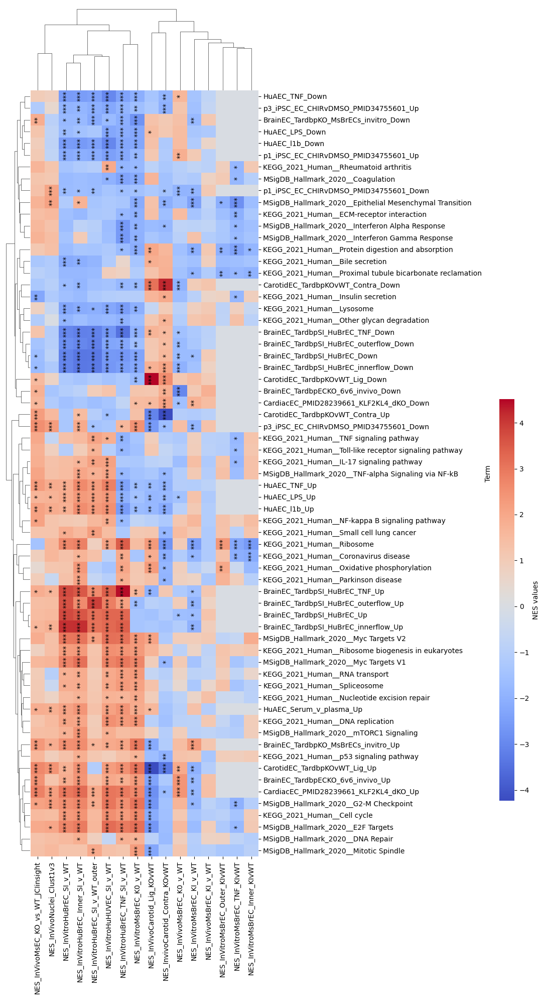

In [109]:
#This is all of the data, and used for string diagram

# List of FWER columns in the merged dataframe
fw_cols = [col for col in combined_df.columns if 'q-val' in col]

# List of direction columns (assuming they are 'NES' columns for example)
direction_cols = [col for col in combined_df.columns if 'NES' in col]

# Create a mask for rows with q-value < 0.1 in at least one datasets
qval_mask = (combined_df[fw_cols] < 0.05).sum(axis=1) >= 3

# For direction, count the number of positive and negative values in direction_cols
positive_counts = (combined_df[direction_cols] > 0).sum(axis=1)
negative_counts = (combined_df[direction_cols] < 0).sum(axis=1)

# Create masks for rows where the count of positive values or negative values is greater than 12
positive_direction_mask = positive_counts > 3
negative_direction_mask = negative_counts > 3

# Combine the two masks using bitwise OR operator
direction_mask = positive_direction_mask | negative_direction_mask

# Combine the two masks using bitwise AND operator
final_mask = qval_mask & direction_mask

# Filter the DataFrame based on the combined mask and specific terms
#filter_strings = ["KEGG", "MSigDB", "BrainEC_TardbpSI", "p3", "p1", "CardiacEC", "CarotidEC", "BrainEC_TardbpKO", "BrainEC_TardbpECKO", "BrainEC_TardbpKO", "HuAEC"]  # Replace with your specific strings
string_mask = combined_df['Term'].str.contains('|'.join(filter_strings))
final_mask = final_mask & string_mask
filtered_GSEA_df = combined_df[final_mask]

# Example threshold for significance
significance_threshold = 0.05
threshold_1 = 0.01  # Less than this value will get two asterisks
threshold_2 = 0.001  # Less than this value will get three asterisks

# Columns that contain p-values or q-values
pval_qval_columns = [col for col in filtered_GSEA_df.columns if 'q-val' in col]

# Corrected part for creating the significance matrix
significance_matrix = pd.DataFrame(index=filtered_GSEA_df.index, columns=direction_cols)  # Only NES columns needed

# Corrected part for creating the significance matrix
for col in pval_qval_columns:
    q_values = filtered_GSEA_df[col]
    corresponding_nes_col = col.replace('FDR q-val', 'NES')  # Assuming FDR q-val column names map directly to NES
    
    # Assign asterisks based on significance levels
    significance_matrix[corresponding_nes_col] = q_values.apply(
        lambda x: '***' if x < threshold_2 else ('**' if x < threshold_1 else ('*' if x < significance_threshold else '')))

# Select only the NES columns
# Assuming your DataFrame merged_GSEA_df has columns like 'NES_filename'
nes_cols = [col for col in filtered_GSEA_df.columns if 'NES' in col]
data_for_heatmap = filtered_GSEA_df.set_index('Term')[nes_cols]

# Replace NaN values with 0
data_for_heatmap = data_for_heatmap.fillna(0)

# Create the clustered heatmap
g = sns.clustermap(
    data_for_heatmap, 
    method='average', 
    cmap='coolwarm', 
    figsize=(10, 20),
    cbar_kws={"label": "NES values", "shrink": 0.5},
    xticklabels=True, 
    yticklabels=True,
    dendrogram_ratio=(.1, .1),  # Adjust the size of the dendrogram
    cbar_pos=(1, .2, .03, .4)   # Adjust the position of the colorbar
)

# Get the order of rows and columns after clustering
row_order = g.dendrogram_row.reordered_ind
col_order = g.dendrogram_col.reordered_ind

# Reorder the significance matrix to match the clustered heatmap
reordered_significance_matrix = significance_matrix.iloc[row_order, col_order]

# Add asterisks to the heatmap
for y in range(data_for_heatmap.shape[0]):
    for x in range(data_for_heatmap.shape[1]):
        asterisks = reordered_significance_matrix.iloc[y, x]
        if asterisks:  # Only add text if there are asterisks
            g.ax_heatmap.text(x + 0.5, y + 0.5, asterisks, ha='center', va='center', color='black', fontsize=10, rotation=90)

# Save the figure with 600 dpi
g.fig.savefig('/Users/patrickmurphy/Documents/UCONN/4_Notebooks/272_Leafcutter_GSEA_Tardbp/HeatMapNetwork.pdf', dpi=600, format='pdf')

# Plot overlap in terms

In [142]:
# Combine custom dataframes
GSEAterms_df = pd.concat([df_human, df_mouse_HsGeneID], axis=1)

# Combine Kegg and Hallmark dictionaries directly
all_terms = {**Kegg, **Hallmark}

# Add the terms from all_terms to GSEAterms_df
for term, genes in all_terms.items():
    GSEAterms_df[term] = pd.Series(genes)

# Get the list of index values from data_for_heatmap
index_values_to_keep = data_for_heatmap.index.tolist()

# Filter GSEAterms_df to include only columns whose names match the terms
GSEAterms_df_filtered = GSEAterms_df[GSEAterms_df.columns.intersection(index_values_to_keep)]

NameError: name 'Kegg' is not defined

In [210]:
data_for_heatmap

,NES_InVitroMsBrEC_KI_v_WT,NES_InVivoCarotid_Lig_KOvWT,NES_InVitroHuBrEC_SI_v_WT,NES_InVitroHuBrEC_Inner_SI_v_WT,NES_InVitroHuBrEC_TNF_SI_v_WT,NES_InVitroHuBrEC_SI_v_WT_outer,NES_InVitroHuHUVEC_SI_v_WT,NES_InvivoCarotid_Contra_KOvWT,NES_InVitroMsBrEC_K0_v_WT,NES_InVivoMsBrEC_KI_v_WT,NES_InVivoMsBrEC_K0_v_WT,NES_InVivoNuclei_Clust1v3
Term,,,,,,,,,,,,
BrainEC_TardbpKO_MsBrECs_invitro_Up,2.136504,2.455119,1.624853,2.005521,1.425643,1.118519,1.639212,1.771845,3.390864,-0.976002,1.794505,1.903752
CardiacEC_PMID28239661_KLF2KL4_dKO_Down,1.739965,-0.851541,-1.438455,-1.308590,1.033534,-1.442965,-1.474983,-1.253166,1.547946,-1.008868,1.179862,-1.135648
BrainEC_TardbpKO_MsBrECs_invitro_Down,-1.675709,-0.919928,-2.184231,-1.977111,-2.358815,-2.304802,-2.179791,1.450097,-3.368061,1.424216,1.414017,-0.881465
BrainEC_TardbpECKO_6v6_invivo_Up,1.284256,2.401631,-0.864586,1.754208,-1.111396,1.094954,1.259229,2.036532,2.063546,-1.145850,3.215405,1.264578
CardiacEC_PMID28239661_KLF2KL4_dKO_Up,-1.247564,2.992838,2.590785,3.016436,2.179159,1.878116,2.262134,2.618156,2.561810,-1.448369,2.611727,2.193470
CarotidEC_TardbpKOvWT_Contra_Up,1.208295,3.207110,-1.243361,-1.073317,-1.284177,-1.072243,-1.706914,4.468395,1.112015,0.952763,1.344184,1.547845
CarotidEC_TardbpKOvWT_Lig_Up,-1.063999,4.409635,1.612725,2.253554,1.594309,-0.784134,1.364954,3.296229,2.826742,-1.106423,2.564153,2.434543
CarotidEC_TardbpKOvWT_Contra_Down,0.931835,-2.861350,-1.623862,-1.597881,-1.506670,-1.585037,-1.787583,-4.355362,-1.149995,1.195372,-1.331525,-0.989801
KEGG_2021_Human__Ribosome,-1.893912,-2.625064,2.723051,2.728235,2.769323,0.974150,1.820593,2.638506,1.370705,-0.680655,0.810915,1.591484


In [211]:
# Create an empty dictionary with current column names as keys
column_mapping = {col: None for col in GSEAterms_df_filtered.columns}

# Print the dictionary with both key and value in quotes on a new line
for key, value in column_mapping.items():
    print(f'"{key}": "{value}",')

"HuAEC_TNF_Up": "None",
"HuAEC_LPS_Up": "None",
"HuAEC_l1b_Up": "None",
"HuAEC_Serum_v_plasma_Up": "None",
"BrainEC_TardbpSI_HuBrEC_Up": "None",
"BrainEC_TardbpSI_HuBrEC_outerflow_Up": "None",
"BrainEC_TardbpSI_HuBrEC_innerflow_Up": "None",
"BrainEC_TardbpSI_HuBrEC_TNF_Up": "None",
"p3_iPSC_EC_CHIRvDMSO_PMID34755601_Up": "None",
"p1_iPSC_EC_CHIRvDMSO_PMID34755601_Up": "None",
"HuAEC_TNF_Down": "None",
"HuAEC_LPS_Down": "None",
"HuAEC_l1b_Down": "None",
"HuAEC_Serum_v_plasma_Down": "None",
"BrainEC_TardbpSI_HuBrEC_Down": "None",
"BrainEC_TardbpSI_HuBrEC_outerflow_Down": "None",
"BrainEC_TardbpSI_HuBrEC_innerflow_Down": "None",
"BrainEC_TardbpSI_HuBrEC_TNF_Down": "None",
"p3_iPSC_EC_CHIRvDMSO_PMID34755601_Down": "None",
"p1_iPSC_EC_CHIRvDMSO_PMID34755601_Down": "None",
"BrainEC_TardbpECKO_6v6_invivo_Up": "None",
"CarotidEC_TardbpKOvWT_Contra_Up": "None",
"CarotidEC_TardbpKOvWT_Lig_Up": "None",
"BrainEC_TardbpKO_MsBrECs_invitro_Up": "None",
"CarotidEC_TardbpKOvWT_Contra_Down": "None",
"Br

In [224]:
# Create a dictionary to map old column names to new column names
column_mapping = {"HuAEC_TNF_Up": "HuAEC_TNF_Up",
"HuAEC_LPS_Up": "HuAEC_LPS_Up",
"HuAEC_l1b_Up": "HuAEC_l1b_Up",
"HuAEC_Serum_v_plasma_Up": "HuAEC_Serum_v_plasma_Up",
"BrainEC_TardbpSI_HuBrEC_Up": "TardbpSI_Up",
"BrainEC_TardbpSI_HuBrEC_outerflow_Up": "TardbpSI_OuterFlow_Up",
"BrainEC_TardbpSI_HuBrEC_innerflow_Up": "TardbpSI_InnerFlow_Up",
"BrainEC_TardbpSI_HuBrEC_TNF_Up": "TardbpSI_TNF_Up",
"p3_iPSC_EC_CHIRvDMSO_PMID34755601_Up": "WntActiveLate_Up",
"p1_iPSC_EC_CHIRvDMSO_PMID34755601_Up": "WntActiveEarly_Up",
"HuAEC_TNF_Down": "HuAEC_TNF_Down",
"HuAEC_LPS_Down": "HuAEC_LPS_Down",
"HuAEC_l1b_Down": "HuAEC_l1b_Down",
"HuAEC_Serum_v_plasma_Down": "HuAEC_Serum_v_plasma_Down",
"BrainEC_TardbpSI_HuBrEC_Down": "TardbpSI_Down",
"BrainEC_TardbpSI_HuBrEC_outerflow_Down": "TardbpSI_OuterFlow_Down",
"BrainEC_TardbpSI_HuBrEC_innerflow_Down": "TardbpSI_InnerFlow_Down",
"BrainEC_TardbpSI_HuBrEC_TNF_Down": "TardbpSI_TNF_Down",
"p3_iPSC_EC_CHIRvDMSO_PMID34755601_Down": "WntActiveLate_Down",
"p1_iPSC_EC_CHIRvDMSO_PMID34755601_Down": "WntActiveEarly_Down",
"BrainEC_TardbpECKO_6v6_invivo_Up": "InVivoTardbpECKO_Ms_brain_Up",
"CarotidEC_TardbpKOvWT_Contra_Up": "InVivoTardbpECKO_Ms_carotid_Up",
"CarotidEC_TardbpKOvWT_Lig_Up": "InVivoTardbpECKO_Ms_DFcarotid_Up",
"BrainEC_TardbpKO_MsBrECs_invitro_Up": "InVitroTardbpECKO_Ms_Up",
"CarotidEC_TardbpKOvWT_Contra_Down": "InVivoTardbpECKO_Ms_carotid_Down",
"BrainEC_TardbpKO_MsBrECs_invitro_Down": "InVitroTardbpECKO_Ms_Down",
"CardiacEC_PMID28239661_KLF2KL4_dKO_Up": "InVivo_KLF2KLF4_ECKO_Up",
"CardiacEC_PMID28239661_KLF2KL4_dKO_Down": "InVivo_KLF2KLF4_ECKO_Down",
"KEGG_2021_Human__Cell cycle": "Cell cycle",
"KEGG_2021_Human__Complement and coagulation cascades": "Complement and coagulation",
"KEGG_2021_Human__DNA replication": "DNA replication",
"KEGG_2021_Human__IL-17 signaling pathway": "IL-17",
"KEGG_2021_Human__Lysosome": "Lysosome",
"KEGG_2021_Human__Oxidative phosphorylation": "Ox Phos",
"KEGG_2021_Human__Protein digestion and absorption": "Protein digestion/absorb",
"KEGG_2021_Human__Ribosome": "Ribosome",
"KEGG_2021_Human__Ribosome biogenesis in eukaryotes": "Ribosome biogenesis",
"KEGG_2021_Human__Staphylococcus aureus infection": "StaphA Infection",
"KEGG_2021_Human__Vascular smooth muscle contraction": "VSmMuscle contraction",
"MSigDB_Hallmark_2020__TNF-alpha Signaling via NF-kB": "TNF/NF-kB",
"MSigDB_Hallmark_2020__Mitotic Spindle": "Mitotic Spindle",
"MSigDB_Hallmark_2020__G2-M Checkpoint": "G2-M Checkpoint",
"MSigDB_Hallmark_2020__Interferon Alpha Response": "Interferon Alpha",
"MSigDB_Hallmark_2020__E2F Targets": "E2F Targets",
"MSigDB_Hallmark_2020__Myc Targets V1": "Myc Targets V1",
"MSigDB_Hallmark_2020__Myc Targets V2": "Myc Targets V2",
"MSigDB_Hallmark_2020__Epithelial Mesenchymal Transition": "EpMesTransition",
"MSigDB_Hallmark_2020__Coagulation": "Coagulation"}

# Create a copy of GSEAterms_df_filtered
GSEAterms_df_filtered_copy = GSEAterms_df_filtered.copy()

# Use the rename method to replace column names in the copy
GSEAterms_df_filtered_copy.rename(columns=column_mapping, inplace=True)

In [225]:
GSEAterms_df_filtered_copy

,HuAEC_TNF_Up,HuAEC_LPS_Up,HuAEC_l1b_Up,HuAEC_Serum_v_plasma_Up,TardbpSI_Up,TardbpSI_OuterFlow_Up,TardbpSI_InnerFlow_Up,TardbpSI_TNF_Up,WntActiveLate_Up,WntActiveEarly_Up,HuAEC_TNF_Down,HuAEC_LPS_Down,HuAEC_l1b_Down,HuAEC_Serum_v_plasma_Down,TardbpSI_Down,TardbpSI_OuterFlow_Down,TardbpSI_InnerFlow_Down,TardbpSI_TNF_Down,WntActiveLate_Down,WntActiveEarly_Down,InVivoTardbpECKO_Ms_brain_Up,InVivoTardbpECKO_Ms_carotid_Up,InVivoTardbpECKO_Ms_DFcarotid_Up,InVitroTardbpECKO_Ms_Up,InVivoTardbpECKO_Ms_carotid_Down,InVitroTardbpECKO_Ms_Down,InVivo_KLF2KLF4_ECKO_Up,InVivo_KLF2KLF4_ECKO_Down,Cell cycle,Complement and coagulation,DNA replication,IL-17,Lysosome,Ox Phos,Protein digestion/absorb,Ribosome,Ribosome biogenesis,StaphA Infection,VSmMuscle contraction,TNF/NF-kB,Mitotic Spindle,G2-M Checkpoint,Interferon Alpha,E2F Targets,Myc Targets V1,Myc Targets V2,EpMesTransition,Coagulation
0,CSF2,CXCL2,CSF2,AC011491.1,C1orf194,ELAVL2,NETO1,TAL2,APCDD1,PRND,MMRN1,TRDV1,AC011491.1,RNU6-313P,AQP1,ELN,AQP1,APLNR,COL1A1,IL1RL1,SHCBP1,,GDF6,ESR1,KCNQ1,CAPN11,,RNU6-1177P,TGFB1,F11,RFC4,USP25,CD164,ATP6V1E1,COL28A1,RNA5S15,RNA5S15,IL10,GUCY1A2,MARCKS,ACTN4,H2AZ2,IL4R,DUT,SSB,IMP4,LUM,GSN
1,IFITM1,RTP4,CSF3,TRDV1,SOX21.AS1,MT1JP,AC010327.2,ADAMTSL5,DKK2,APLNR,PALD1,AC011491.1,TRDV1,RF01979,MATN2,RAMP3,CLEC3B,ACKR1,COL1A2,CHPF,PIMREG,FRZB,MKI67,BLNK,ALAS2,GBGT1,SLC26A9,,TGFB3,F10,RFC5,JUN,ENTPD4,SDHD,COL24A1,RNA5S16,RNA5S16,DEFA5,GUCY1A1,IL23A,PCGF5,EGF,CD74,H2AZ1,DUT,DUSP2,CADM1,F11
2,TYMP,IFI44L,CCL5,AC239803.2,AC008163,ARHGEF34P,PLA2G7,HNRNPH1P3,LPL,NTS,EMCN,AC239803.2,AC239803.2,FNDC5,FBLN2,NEURL1B,MATN2,RXFP1,THY1,LOX,ACKR2,THBS1,SFRP2,TEX11,MEGF6,MMP12,TMEM212,,TGFB2,F12,RFC2,HSP90AA1,AP1S1,PPA1,ATP1B4,RNA5S13,RNA5S13,DEFA6,IRAG1,NINJ1,MARCKS,CASP8AP2,SP110,HUS1,H2AZ1,CBX3,DKK1,F10
3,RTP4,IFITM1,TNFAIP6,FSIP1,ACTBL2,ARHGEF4,DIO2,FAM182A,PCSK2,APCDD1,CHST1,FBXL20,CHST1,CXCL10,APLNR,CLEC3B,CMKLR1,CD207,IGFBP5,WISP1,BUB1B,AHSG,CCNA2,,ATP1B1,PRL,,CYP1A1,ZBTB17,SERPIND1,LIG1,MMP1,AP1B1,SDHB,ATP1B3,RNA5S14,RNA5S14,DEFA3,AGT,TNFSF9,NIN,H2AZ1,MX1,DEK,STARD7,PUS1,P3H1,S100A1
4,RSAD2,IFI6,CXCL11,MAGI2,AC112198.1,SMG1P6,AL590399.3,TGFB2.OT1,LSR,CCL2,CXorf36,MAGI2,PALD1,RF00586,SLCO2A1,AQP1,ACP5,GPR1,MME,TMEM100,SPRN,KLF15,PBK,PLA2G4E,ZNF195,ITGAX,GKN1,,CDC25A,CFHR1,RFC3,CCL20,CTNS,COX7B2,ATP1B2,RPS8,IMP3,KRT9,PPP1CA,SIK1,APC,KNL1,RSAD2,CDC20,RPL22,PA2G4,COL1A2,TFPI2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Hist1h2bk,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CDCA5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
202,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
203,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [226]:
# Check for duplicate column names
duplicate_columns = GSEAterms_df_filtered_copy.columns[GSEAterms_df_filtered_copy.columns.duplicated()]
print("Duplicate columns:", duplicate_columns)


Duplicate columns: Index([], dtype='object')


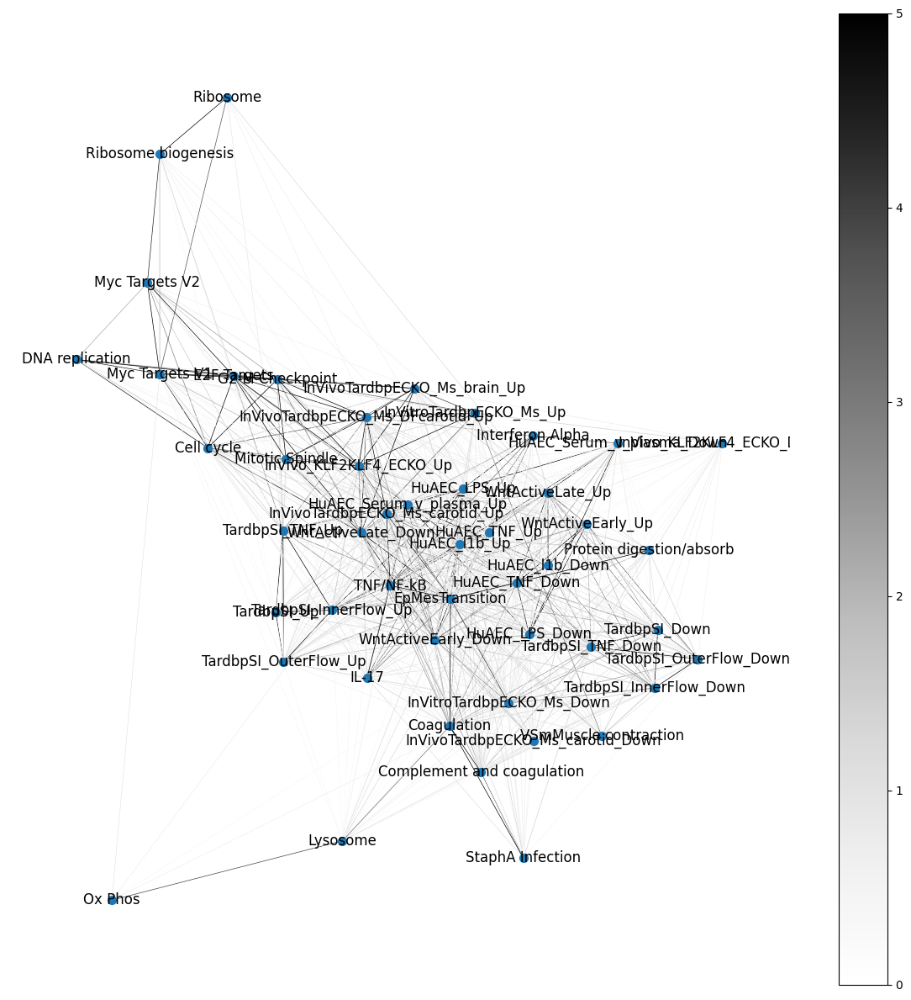

In [231]:
# Create a dictionary to store the mapping between node numbers and term names
node_names = {i: termgsea for i, termgsea in enumerate(GSEAterms_df_filtered_copy.columns)}

G = nx.Graph()

# Add nodes to the graph with numbering and store the mapping
for node, termgsea in node_names.items():
    G.add_node(node, label=termgsea)  # Add node with number and term label

    
# Add edges to the graph based on gene similarities
for i, term1 in enumerate(GSEAterms_df_filtered_copy.columns):
    for j, term2 in enumerate(GSEAterms_df_filtered_copy.columns):
        if i < j:  # Avoid self-loop and redundant connections
            genes1 = set(GSEAterms_df_filtered_copy[term1].dropna())
            genes2 = set(GSEAterms_df_filtered_copy[term2].dropna())
            common_genes = genes1.intersection(genes2)
            total_genes = genes1.union(genes2)
            num_total_genes = len(total_genes)
            num_common_genes = len(common_genes)
            if num_total_genes > 0:  # Avoid division by zero
                percent_overlap = (num_common_genes / num_total_genes) * 100
                if percent_overlap > 0:
                    G.add_edge(i, j, weight=percent_overlap, width=percent_overlap)

    
# Remove isolated nodes (those not connected to any other node)
isolated_nodes = list(nx.isolates(G))
G.remove_nodes_from(isolated_nodes)

for node in list(G.nodes()):
    if G.degree(node) <= 1:
        G.remove_node(node)

# After modifying the graph (adding/removing nodes and edges)
pos = nx.spring_layout(G)  # Recalculate positions for the updated graph

# Update node_labels only for nodes present in the updated graph
node_labels = {node: node_names[node] for node in G.nodes()}
        
# Now you can draw the graph
fig, ax = plt.subplots(figsize=(15, 15))

# Draw the graph
pos = nx.spring_layout(G)  # positions for all nodes

# Extracting weights from the graph for edge colors
weights = [G[u][v]['weight'] for u, v in G.edges()]

# Normalize the weights to a fixed range between 0 and 100 for coloring
norm = mcolors.Normalize(vmin=0, vmax=5)  # set fixed scale here

# Choose a colormap
cmap = plt.cm.Greys  # using Greys colormap for black and grey color scale

# Draw the graph with term labels
node_labels = {node: label for node, label in node_names.items()}
nx.draw(G, pos, labels=node_labels, with_labels=True,
        font_size=12,  # Adjust font size as needed
        edge_color=[cmap(norm(w)) for w in weights],
        width=0.5,  # Fixed thin width
        node_size=50,  # Adjust node size as needed
        ax=ax)

# Optionally, you can add a colorbar to the plot
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
plt.colorbar(sm, ax=ax)

plt.show()

# Save the figure as a PDF with 600 dpi
fig.savefig('/Users/patrickmurphy/Desktop/GSEA_figures/NetworkCustom.pdf', dpi=600, format='pdf')

In [230]:
node_labels

{0: 'HuAEC_TNF_Up',
 1: 'HuAEC_LPS_Up',
 2: 'HuAEC_l1b_Up',
 3: 'HuAEC_Serum_v_plasma_Up',
 4: 'TardbpSI_Up',
 5: 'TardbpSI_OuterFlow_Up',
 6: 'TardbpSI_InnerFlow_Up',
 7: 'TardbpSI_TNF_Up',
 8: 'WntActiveLate_Up',
 9: 'WntActiveEarly_Up',
 10: 'HuAEC_TNF_Down',
 11: 'HuAEC_LPS_Down',
 12: 'HuAEC_l1b_Down',
 13: 'HuAEC_Serum_v_plasma_Down',
 14: 'TardbpSI_Down',
 15: 'TardbpSI_OuterFlow_Down',
 16: 'TardbpSI_InnerFlow_Down',
 17: 'TardbpSI_TNF_Down',
 18: 'WntActiveLate_Down',
 19: 'WntActiveEarly_Down',
 20: 'InVivoTardbpECKO_Ms_brain_Up',
 21: 'InVivoTardbpECKO_Ms_carotid_Up',
 22: 'InVivoTardbpECKO_Ms_DFcarotid_Up',
 23: 'InVitroTardbpECKO_Ms_Up',
 24: 'InVivoTardbpECKO_Ms_carotid_Down',
 25: 'InVitroTardbpECKO_Ms_Down',
 26: 'InVivo_KLF2KLF4_ECKO_Up',
 27: 'InVivo_KLF2KLF4_ECKO_Down',
 28: 'Cell cycle',
 29: 'Complement and coagulation',
 30: 'DNA replication',
 31: 'IL-17',
 32: 'Lysosome',
 33: 'Ox Phos',
 34: 'Protein digestion/absorb',
 35: 'Ribosome',
 36: 'Ribosome biogenesis

# Show individual GSEA plots

In [ ]:
###NOTE to plot GSEA terms, need to use the correct results (from merging above)

In [179]:
for index, term in enumerate(terms_list):
    print(f"{index}: {term}")

NameError: name 'terms_list' is not defined

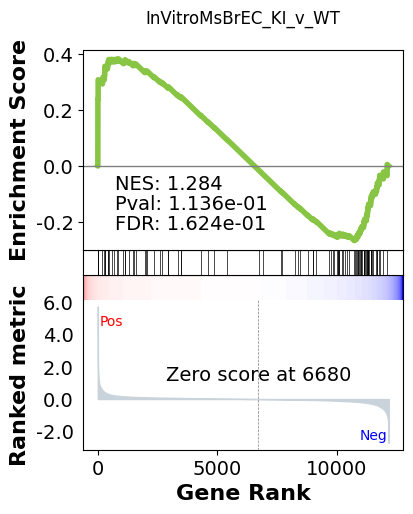

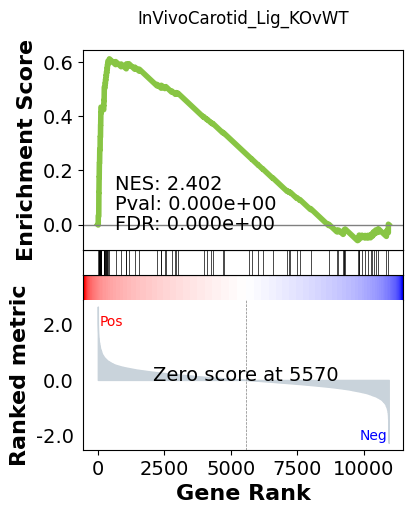

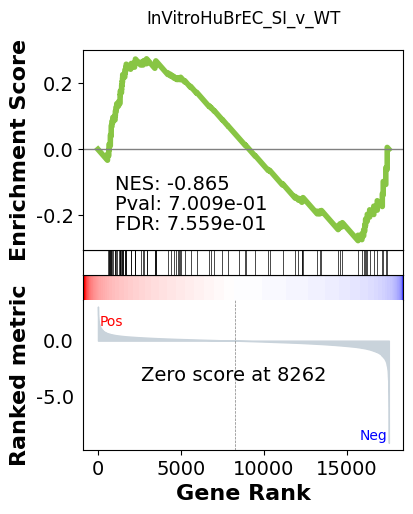

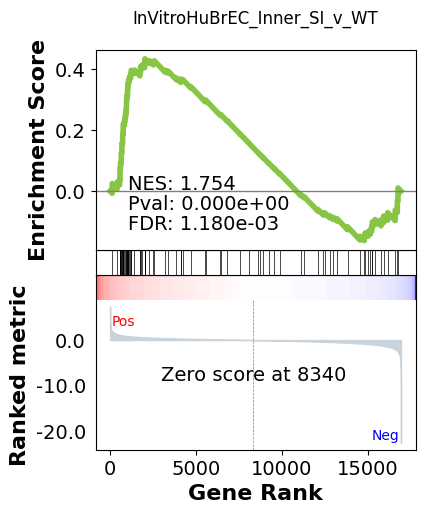

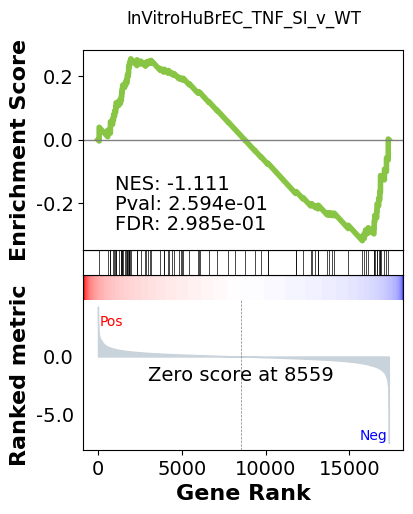

...

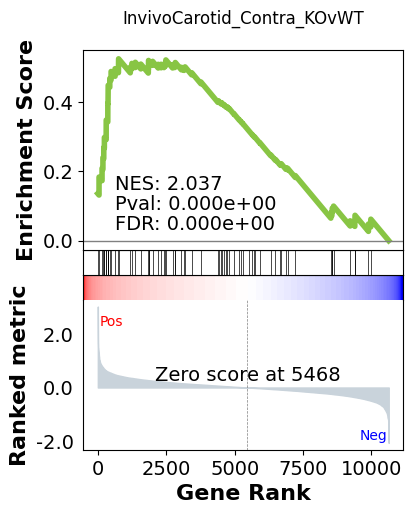

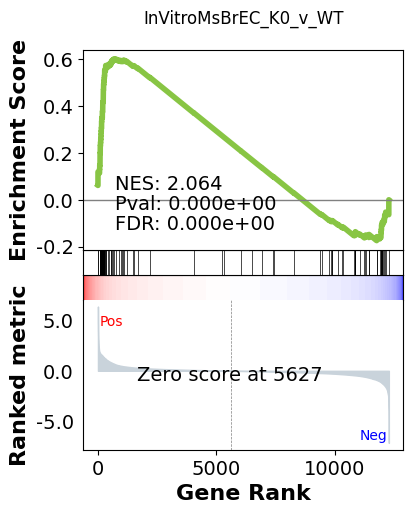

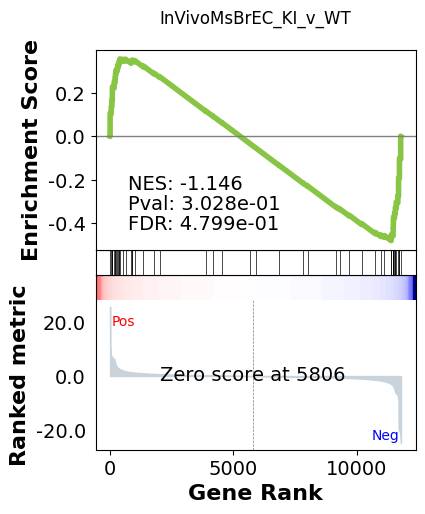

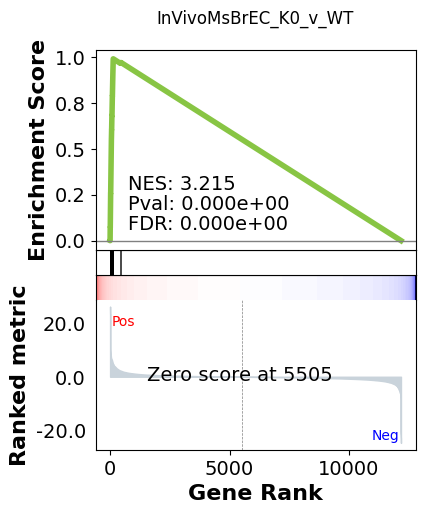

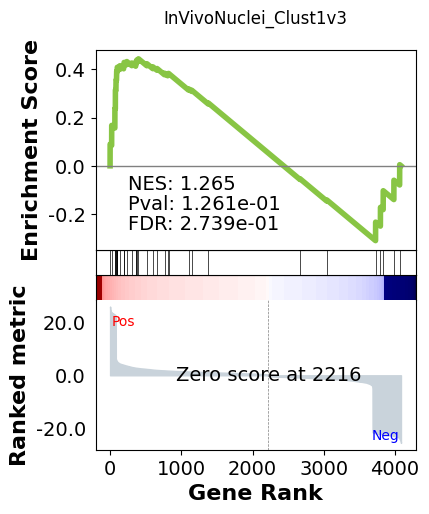

In [280]:
term_search = 'BrainEC_TardbpECKO_6v6_invivo_Up'

# Create a directory for the term if it doesn't exist
path = f"/Users/patrickmurphy/Desktop/GSEA_figures/{term_search}"
if not os.path.exists(path):
    os.makedirs(path)

# Loop through each item in the dictionary and plot
for title, data in gsea_result_custom.items():
    # Plot the data
    fig = data.plot(terms=term_search)
    
    # Set the title of the plot
    fig.suptitle(title)

    # Save the plot as a PDF in the specific term folder
    fig.savefig(f"{path}/{title.replace(' ', '_')}.pdf", format='pdf')
        
    # Display the plot
    plt.show()

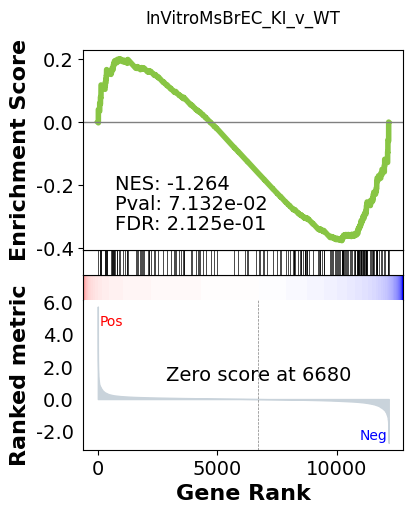

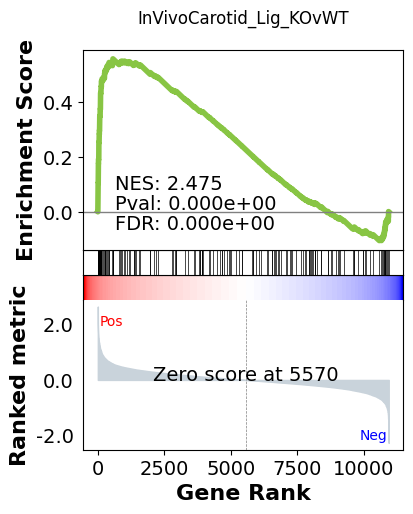

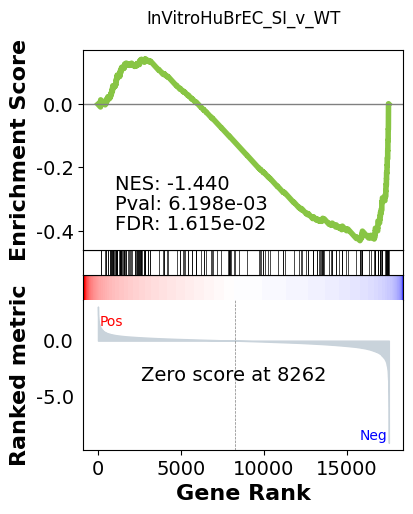

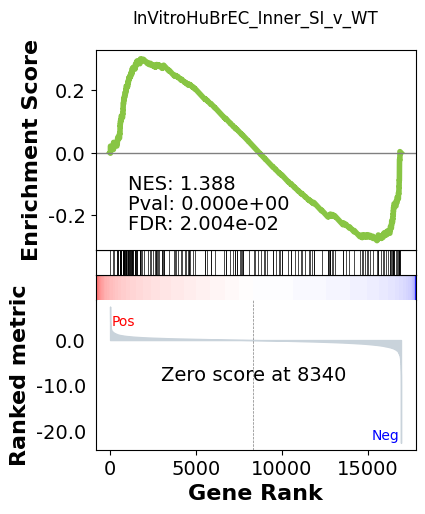

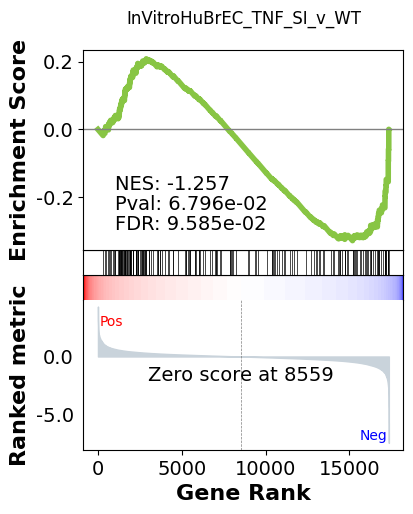

...

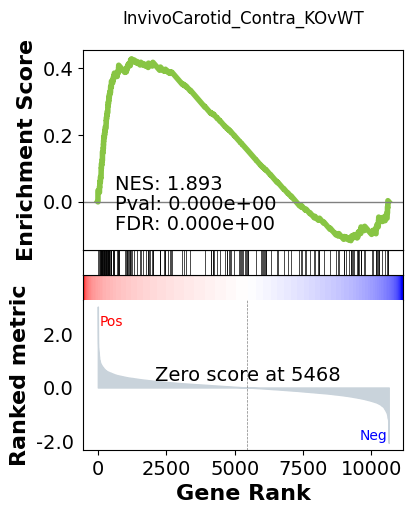

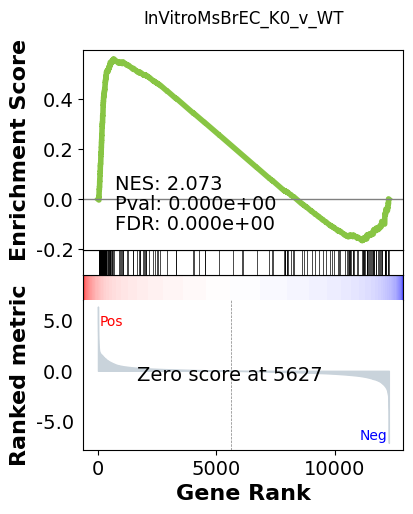

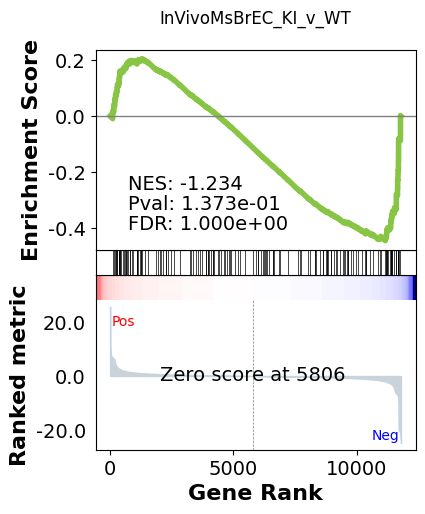

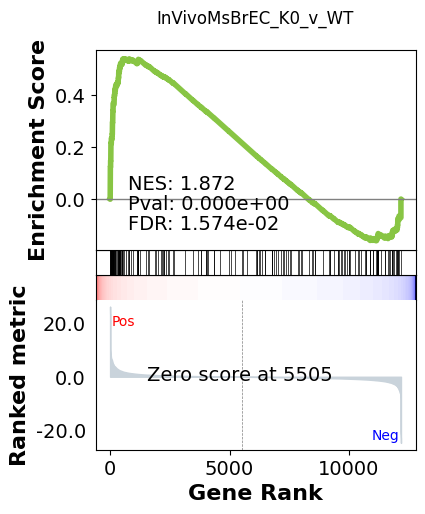

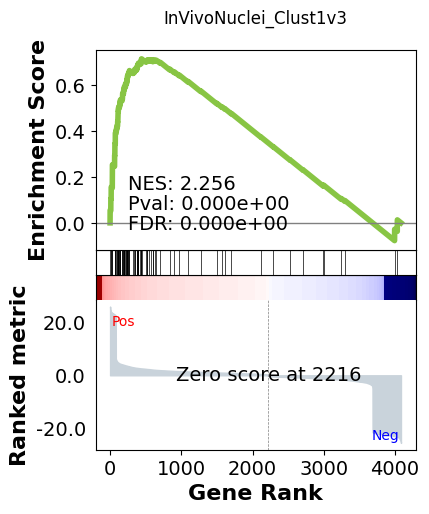

In [271]:
term_search = 'p3_iPSC_EC_CHIRvDMSO_PMID34755601_Down'

# Create a directory for the term if it doesn't exist
path = f"/Users/patrickmurphy/Desktop/GSEA_figures/{term_search}"
if not os.path.exists(path):
    os.makedirs(path)

# Loop through each item in the dictionary and plot
for title, data in gsea_result_custom2.items():
    # Plot the data
    fig = data.plot(terms=term_search)
    
    # Set the title of the plot
    fig.suptitle(title)

    # Save the plot as a PDF in the specific term folder
    fig.savefig(f"{path}/{title.replace(' ', '_')}.pdf", format='pdf')
        
    # Display the plot
    plt.show()

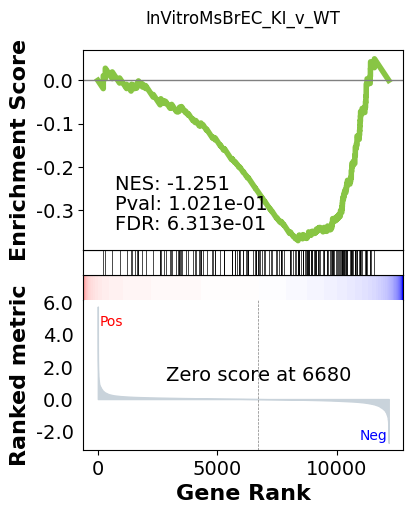

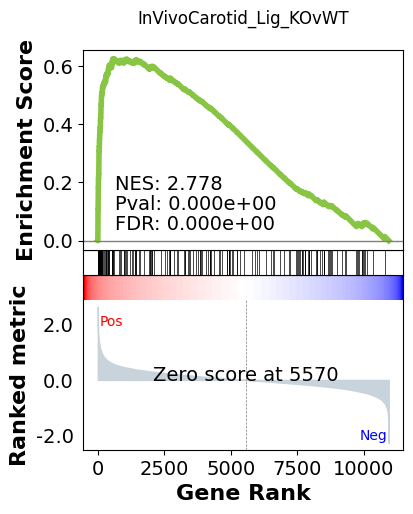

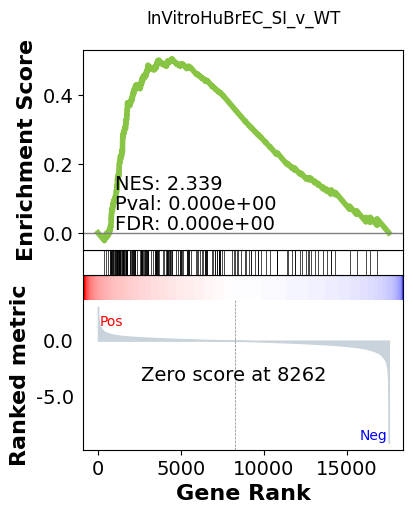

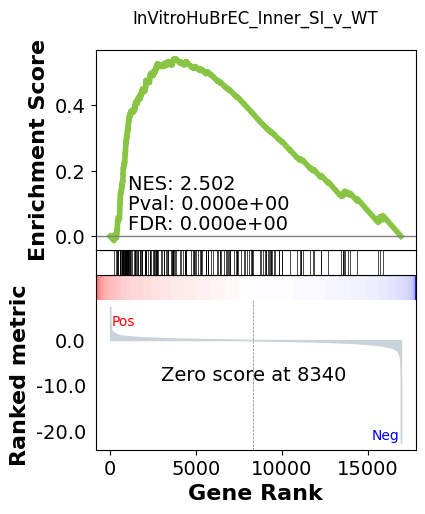

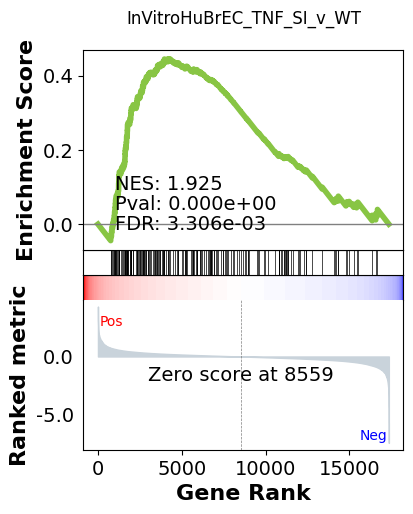

...

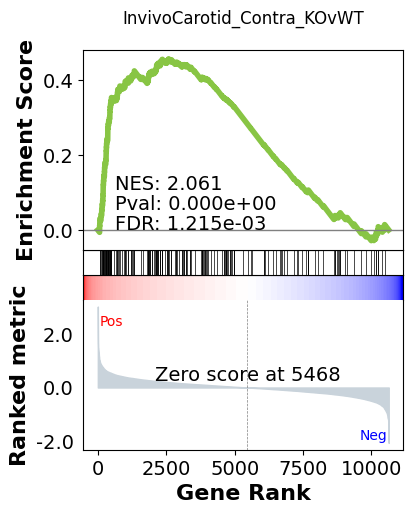

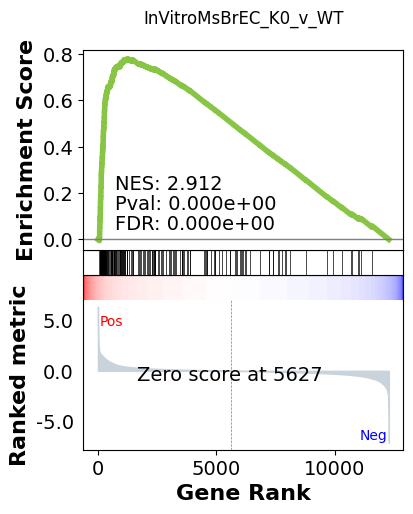

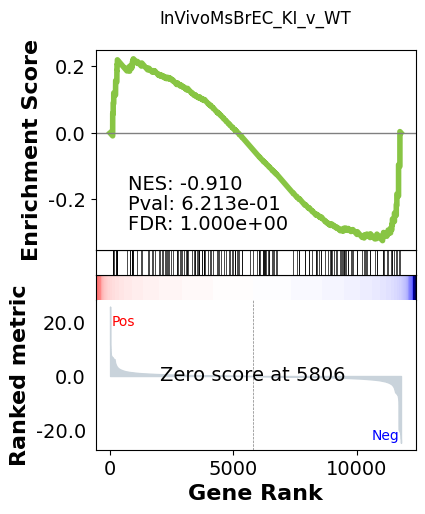

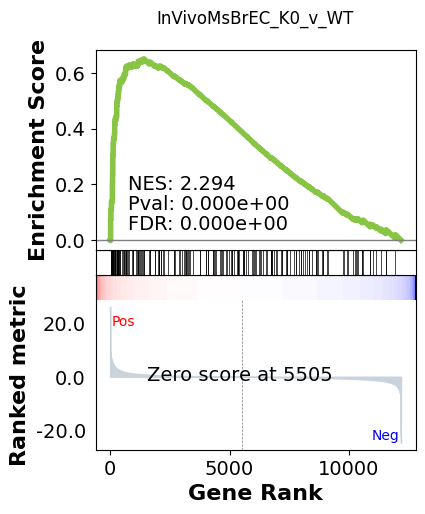

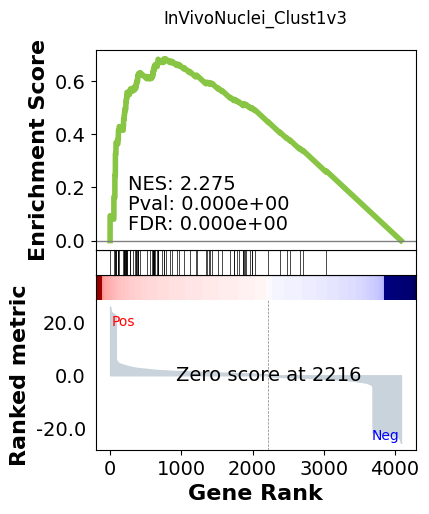

In [276]:
# Loop through each item in the dictionary and plot
for title, data in gsea_result.items():
    # Plot the data
    fig = data.plot(terms='MSigDB_Hallmark_2020__G2-M Checkpoint')
    
    # Set the title of the plot
    fig.suptitle(title)

# Save the plot as a PDF
    fig.savefig(f"/Users/patrickmurphy/Desktop/GSEA_figures/{title.replace(' ', '_')}.pdf", format='pdf')
    
    # Display the plot
    plt.show()

# Plot genes in term between datasets

In [59]:
#Prepare single cell res file so that it is in the same format as others

def reformat_df(combined_df):
    # Create a copy of the DataFrame
    formatted_df = combined_df.copy()

    # Print original columns for debugging
    print("Original columns:", formatted_df.columns.tolist())

    # If DataFrame has a column to be set as index, set it as index
    if '1_names' in formatted_df.columns:
        formatted_df.set_index('1_names', inplace=True)
    
    # Rename columns
    formatted_df.columns = formatted_df.columns.str.replace('1_logfoldchanges', 'log2FoldChange')
    formatted_df.columns = formatted_df.columns.str.replace('1_pvals_adj', 'padj')
    formatted_df.columns = formatted_df.columns.str.replace('1_pvals', 'pvalue')

    # Print new columns for debugging
    print("New columns:", formatted_df.columns.tolist())
    
    return formatted_df

def reformat_and_assign(df_name, df):
    reformatted_df = reformat_df(df)
    globals()[df_name + '_formatted'] = reformatted_df

# Example usage
reformat_and_assign('InVivoNuclei_Clust1v3_res', InVivoNuclei_Clust1v3_res)

Original columns: ['Unnamed: 0', '1_names', '1_scores', '1_logfoldchanges', '1_pvals_adj', '1_pvals']
New columns: ['Unnamed: 0', '1_scores', 'log2FoldChange', 'padj', 'pvalue']


In [60]:
InVitroMsBrEC_KI_v_WT_res_HsGeneID

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
NaN,3.179151,0.813513,0.596352,1.364149,0.172521,0.999194
NaN,0.317445,0.774325,2.147881,0.360506,0.718468,0.999194
NaN,921.291126,-0.038530,0.166296,-0.231694,0.816776,0.999194
NaN,34.786652,-0.590343,0.770232,-0.766448,0.443410,0.999194
NaN,41.353547,-0.241785,0.340506,-0.710076,0.477657,0.999194
...,...,...,...,...,...,...
ZYG11A,0.158409,-0.991949,3.059679,-0.324200,0.745786,0.999194
ZYG11B,1220.481218,-0.013288,0.154834,-0.085824,0.931606,0.999194
ZYX,9752.166948,-0.045955,0.149852,-0.306673,0.759092,0.999194
ZZEF1,3270.052145,0.149254,0.123193,1.211542,0.225688,0.999194


In [61]:
InVitroHuBrEC_SI_v_WT_res

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
A1BG,10.710318,0.605715,0.374846,1.615906,0.106115,0.526630
A1BG.AS1,30.181794,0.292548,0.227613,1.285288,0.198692,0.701234
A1CF,0.083955,-0.512714,3.060383,-0.167533,0.866951,0.981834
A2M,92.047299,-1.993204,0.719113,-2.771753,0.005576,0.106671
A2M.AS1,6.103447,-1.646046,0.620475,-2.652882,0.007981,0.132351
...,...,...,...,...,...,...
ZYG11AP1,0.000000,NaN,NaN,NaN,NaN,NaN
ZYG11B,1574.238641,-0.116119,0.142047,-0.817468,0.413661,0.940547
ZYX,12421.766933,0.471157,0.215884,2.182458,0.029076,0.273139
ZYXP1,0.000000,NaN,NaN,NaN,NaN,NaN


In [62]:
InVivoNuclei_Clust1v3_res_formatted

,Unnamed: 0,1_scores,log2FoldChange,padj,pvalue
1_names,,,,,
GPCPD1,0,-30.077017,-3.390145,5.510748e-118,1.681798e-122
SLCO1A2,1,-24.052660,-3.684128,2.069990e-95,1.263460e-99
SPOCK3,2,-17.108288,-2.280543,3.213209e-50,2.941870e-54
ABLIM1,3,-15.994058,-1.944379,2.340636e-43,3.571635e-47
ABCG2,4,-15.992470,-1.762335,3.760651e-43,6.886167e-47
...,...,...,...,...,...
EPB41L4B,4085,-1.965366,-22.226084,3.999690e-01,4.972911e-02
LRFN4,4088,-1.964947,-22.219006,4.000654e-01,4.977772e-02
AC103796.1,4091,-1.964215,-22.100552,4.006493e-01,4.986260e-02


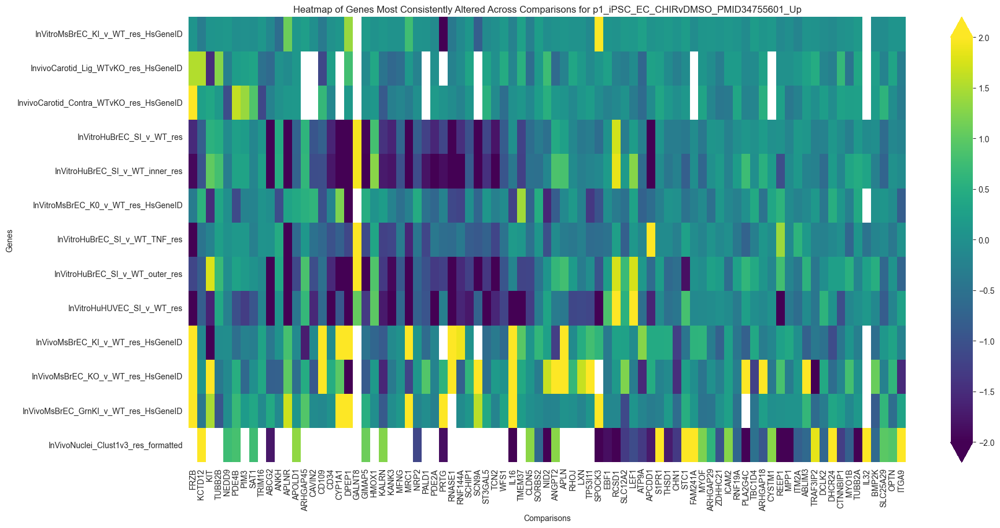

In [63]:
# Create a dictionary where keys are names and values are dataframes
df_dict_humangene_res = {
    'InVitroMsBrEC_KI_v_WT_res_HsGeneID': InVitroMsBrEC_KI_v_WT_res_HsGeneID,
    'InvivoCarotid_Lig_WTvKO_res_HsGeneID': InvivoCarotid_Lig_WTvKO_res_HsGeneID,
#    'InVitroMsBrEC_TNF_KIvWT_res_HsGeneID': InVitroMsBrEC_TNF_KIvWT_res_HsGeneID,
#    'InVitroHuHBEC_SI_v_WT_res' : InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res_HsGeneID' : InvivoCarotid_Contra_WTvKO_res_HsGeneID, 
    'InVitroHuBrEC_SI_v_WT_res' : InVitroHuBrEC_SI_v_WT_res,
#    'InVitroMsBrEC_Inner_KIvWT_res_HsGeneID' : InVitroMsBrEC_Inner_KIvWT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_inner_res' : InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res_HsGeneID' : InVitroMsBrEC_K0_v_WT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_TNF_res' : InVitroHuBrEC_TNF_siTDP43vWT_res,
    'InVitroHuBrEC_SI_v_WT_outer_res' : InVitroHuBrEC_SI_v_WT_outer_res,
    'InVitroHuHUVEC_SI_v_WT_res' : InVitroHuHUVEC_SI_v_WT_res,
#    'InVitroMsBrEC_Outer_KIvWT_res_HsGeneID' : InVitroMsBrEC_Outer_KIvWT_res_HsGeneID,
    'InVivoMsBrEC_KI_v_WT_res_HsGeneID' : InVivoMsBrEC_KI_v_WT_res_HsGeneID,
    'InVivoMsBrEC_KO_v_WT_res_HsGeneID' : InVivoMsBrEC_KO_v_WT_res_HsGeneID,
    'InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID' : InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID,
    'InVivoNuclei_Clust1v3_res_formatted': InVivoNuclei_Clust1v3_res_formatted
}

# To extract a specific gene set
gene_set_name = "p1_iPSC_EC_CHIRvDMSO_PMID34755601_Up" #Replace with your actual gene set name
gsea_term_genes = custom_endo_human_genesets.get(gene_set_name, [])

# Convert the set of genes to a list for the DataFrame index
gsea_term_genes_list = list(gsea_term_genes)

# Step 1: Count the occurrences of significant p-values for each gene
significant_count = Counter()

for df in df_dict_humangene_res.values():
    significant_genes = df[(df['padj'] < 0.05) & df.index.isin(gsea_term_genes_list)].index
    significant_count.update(significant_genes)

# Filter genes based on significance count
filtered_genes = [gene for gene, count in significant_count.items() if count >= 1]

# Initialize a DataFrame to hold the log2FoldChange for the filtered genes in each DataFrame
combined_df = pd.DataFrame(index=filtered_genes)

for df_name, df in df_dict_humangene_res.items():
    # Drop duplicates in the index (gene names)
    df = df[~df.index.duplicated(keep='first')]

    # Filter the DataFrame for genes in the filtered_genes list
    filtered_df = df[df.index.isin(filtered_genes)]
    
    # Add the log2FoldChange values of the filtered_df to the combined_df
    combined_df[df_name] = filtered_df['log2FoldChange']

# Transpose the DataFrame to have comparisons as columns and genes as rows
combined_df = combined_df.T


# Create the Heatmap with the custom colormap
plt.figure(figsize=(20, 10))
sns.heatmap(combined_df, annot=False, cmap='viridis', vmin=-2, vmax=2, cbar_kws={'extend': 'both'})
plt.title(f'Heatmap of Genes Most Consistently Altered Across Comparisons for {gene_set_name}')
plt.xlabel('Comparisons')
plt.ylabel('Genes')
plt.show()

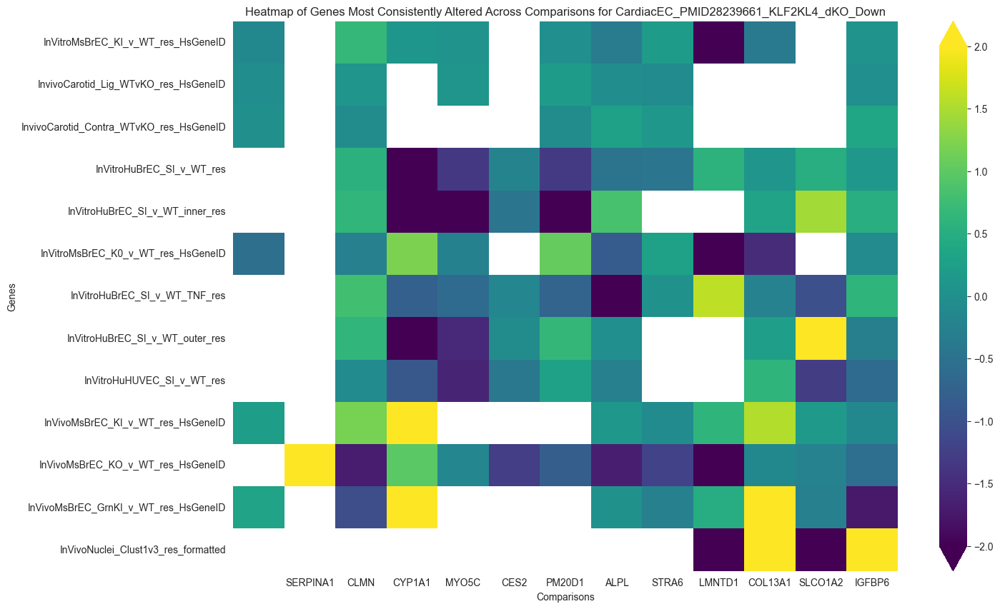

In [64]:
# Create a dictionary where keys are names and values are dataframes
df_dict_humangene_res = {
    'InVitroMsBrEC_KI_v_WT_res_HsGeneID': InVitroMsBrEC_KI_v_WT_res_HsGeneID,
    'InvivoCarotid_Lig_WTvKO_res_HsGeneID': InvivoCarotid_Lig_WTvKO_res_HsGeneID,
#    'InVitroMsBrEC_TNF_KIvWT_res_HsGeneID': InVitroMsBrEC_TNF_KIvWT_res_HsGeneID,
#    'InVitroHuHBEC_SI_v_WT_res' : InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res_HsGeneID' : InvivoCarotid_Contra_WTvKO_res_HsGeneID, 
    'InVitroHuBrEC_SI_v_WT_res' : InVitroHuBrEC_SI_v_WT_res,
#    'InVitroMsBrEC_Inner_KIvWT_res_HsGeneID' : InVitroMsBrEC_Inner_KIvWT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_inner_res' : InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res_HsGeneID' : InVitroMsBrEC_K0_v_WT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_TNF_res' : InVitroHuBrEC_TNF_siTDP43vWT_res,
    'InVitroHuBrEC_SI_v_WT_outer_res' : InVitroHuBrEC_SI_v_WT_outer_res,
    'InVitroHuHUVEC_SI_v_WT_res' : InVitroHuHUVEC_SI_v_WT_res,
#    'InVitroMsBrEC_Outer_KIvWT_res_HsGeneID' : InVitroMsBrEC_Outer_KIvWT_res_HsGeneID,
    'InVivoMsBrEC_KI_v_WT_res_HsGeneID' : InVivoMsBrEC_KI_v_WT_res_HsGeneID,
    'InVivoMsBrEC_KO_v_WT_res_HsGeneID' : InVivoMsBrEC_KO_v_WT_res_HsGeneID,
    'InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID' : InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID,
    'InVivoNuclei_Clust1v3_res_formatted': InVivoNuclei_Clust1v3_res_formatted
}

# To extract a specific gene set
gene_set_name = "CardiacEC_PMID28239661_KLF2KL4_dKO_Down" #Replace with your actual gene set name
gsea_term_genes = custom_endo_mus_HsID_genesets.get(gene_set_name, [])

# Convert the set of genes to a list for the DataFrame index
gsea_term_genes_list = list(gsea_term_genes)

# Step 1: Count the occurrences of significant p-values for each gene
significant_count = Counter()

for df in df_dict_humangene_res.values():
    significant_genes = df[(df['padj'] < 0.05) & df.index.isin(gsea_term_genes_list)].index
    significant_count.update(significant_genes)

# Filter genes based on significance count
filtered_genes = [gene for gene, count in significant_count.items() if count >= 1]

# Initialize a DataFrame to hold the log2FoldChange for the filtered genes in each DataFrame
combined_df = pd.DataFrame(index=filtered_genes)

for df_name, df in df_dict_humangene_res.items():
    # Drop duplicates in the index (gene names)
    df = df[~df.index.duplicated(keep='first')]

    # Filter the DataFrame for genes in the filtered_genes list
    filtered_df = df[df.index.isin(filtered_genes)]
    
    # Add the log2FoldChange values of the filtered_df to the combined_df
    combined_df[df_name] = filtered_df['log2FoldChange']

# Transpose the DataFrame to have comparisons as columns and genes as rows
combined_df = combined_df.T


# Create the Heatmap with the custom colormap
plt.figure(figsize=(15, 10))
sns.heatmap(combined_df, annot=False, cmap='viridis', vmin=-2, vmax=2, cbar_kws={'extend': 'both'})
plt.title(f'Heatmap of Genes Most Consistently Altered Across Comparisons for {gene_set_name}')
plt.xlabel('Comparisons')
plt.ylabel('Genes')
plt.show()

In [65]:
# Create a dictionary where keys are names and values are dataframes
df_dict_humangene_res = {
    'InVitroMsBrEC_KI_v_WT_res_HsGeneID': InVitroMsBrEC_KI_v_WT_res_HsGeneID,
    'InvivoCarotid_Lig_WTvKO_res_HsGeneID': InvivoCarotid_Lig_WTvKO_res_HsGeneID,
#    'InVitroMsBrEC_TNF_KIvWT_res_HsGeneID': InVitroMsBrEC_TNF_KIvWT_res_HsGeneID,
#    'InVitroHuHBEC_SI_v_WT_res' : InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res_HsGeneID' : InvivoCarotid_Contra_WTvKO_res_HsGeneID, 
    'InVitroHuBrEC_SI_v_WT_res' : InVitroHuBrEC_SI_v_WT_res,
#    'InVitroMsBrEC_Inner_KIvWT_res_HsGeneID' : InVitroMsBrEC_Inner_KIvWT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_inner_res' : InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res_HsGeneID' : InVitroMsBrEC_K0_v_WT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_TNF_res' : InVitroHuBrEC_TNF_siTDP43vWT_res,
    'InVitroHuBrEC_SI_v_WT_outer_res' : InVitroHuBrEC_SI_v_WT_outer_res,
    'InVitroHuHUVEC_SI_v_WT_res' : InVitroHuHUVEC_SI_v_WT_res,
#    'InVitroMsBrEC_Outer_KIvWT_res_HsGeneID' : InVitroMsBrEC_Outer_KIvWT_res_HsGeneID,
    'InVivoMsBrEC_KI_v_WT_res_HsGeneID' : InVivoMsBrEC_KI_v_WT_res_HsGeneID,
    'InVivoMsBrEC_KO_v_WT_res_HsGeneID' : InVivoMsBrEC_KO_v_WT_res_HsGeneID,
    'InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID' : InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID,
    'InVivoNuclei_Clust1v3_res_formatted': InVivoNuclei_Clust1v3_res_formatted
}

term='MSigDB_Hallmark_2020__Myc Targets V1'
gsea_term_genes = all_terms.get(term, set())

# Convert the set of genes to a list for the DataFrame index
gsea_term_genes_list = list(gsea_term_genes)

# Step 1: Count the occurrences of significant p-values for each gene
significant_count = Counter()

for df in df_dict_humangene_res.values():
    significant_genes = df[(df['padj'] < 0.05) & df.index.isin(gsea_term_genes_list)].index
    significant_count.update(significant_genes)

# Filter genes based on significance count
filtered_genes = [gene for gene, count in significant_count.items() if count >= 1]

# Initialize a DataFrame to hold the log2FoldChange for the filtered genes in each DataFrame
combined_df = pd.DataFrame(index=filtered_genes)

for df_name, df in df_dict_humangene_res.items():
    # Drop duplicates in the index (gene names)
    df = df[~df.index.duplicated(keep='first')]

    # Filter the DataFrame for genes in the filtered_genes list
    filtered_df = df[df.index.isin(filtered_genes)]
    
    # Add the log2FoldChange values of the filtered_df to the combined_df
    combined_df[df_name] = filtered_df['log2FoldChange']

# Transpose the DataFrame to have comparisons as columns and genes as rows
combined_df = combined_df.T


# Create the Heatmap with the custom colormap
plt.figure(figsize=(20, 10))
sns.heatmap(combined_df, annot=False, cmap='viridis', vmin=-2, vmax=2, cbar_kws={'extend': 'both'})
plt.title(f'Heatmap of Genes Most Consistently Altered Across Comparisons for {term}')
plt.xlabel('Comparisons')
plt.ylabel('Genes')
plt.show()

NameError: name 'all_terms' is not defined

In [86]:
#This will extract the top genes for each term in each data set

# Create a dictionary where keys are names and values are dataframes
df_dict_humangene_res = {
    'InVitroMsBrEC_KI_v_WT_res_HsGeneID': InVitroMsBrEC_KI_v_WT_res_HsGeneID,
    'InvivoCarotid_Lig_WTvKO_res_HsGeneID': InvivoCarotid_Lig_WTvKO_res_HsGeneID,
    'InVitroMsBrEC_TNF_KIvWT_res_HsGeneID': InVitroMsBrEC_TNF_KIvWT_res_HsGeneID,
    'InVitroHuHBEC_SI_v_WT_res' : InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res_HsGeneID' : InvivoCarotid_Contra_WTvKO_res_HsGeneID, 
    'InVitroHuBrEC_SI_v_WT_res_HsGeneID' : InVitroHuBrEC_SI_v_WT_res_HsGeneID,
    'InVitroMsBrEC_Inner_KIvWT_res_HsGeneID' : InVitroMsBrEC_Inner_KIvWT_res_HsGeneID,
    'InVitroHuBrEC_Inner_siTDP43vWT_res' : InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res_HsGeneID' : InVitroMsBrEC_K0_v_WT_res_HsGeneID,
    'InVitroHuBrEC_TNF_siTDP43vWT_res' : InVitroHuBrEC_TNF_siTDP43vWT_res,
    'InVitroHuBrEC_SI_v_WT_outer_res' : InVitroHuBrEC_SI_v_WT_outer_res,
    'InVitroHuHUVEC_SI_v_WT_res' : InVitroHuHUVEC_SI_v_WT_res,
    'InVitroMsBrEC_Outer_KIvWT_res_HsGeneID' : InVitroMsBrEC_Outer_KIvWT_res_HsGeneID,
    'InVivoMsBrEC_KI_v_WT_res_HsGeneID' : InVivoMsBrEC_KI_v_WT_res_HsGeneID,
    'InVivoMsBrEC_KO_v_WT_res_HsGeneID' : InVivoMsBrEC_KO_v_WT_res_HsGeneID,
    'InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID' : InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID,
    'InVivoNuclei_Clust1v3_res_format': InVivoNuclei_Clust1v3_res_format
}

term='KEGG_2021_Human__Focal adhesion'
term_genes = all_terms.get(term, set())

def extract_genes(combined_df, term_genes, df_name):
    # Filter the dataframe by pvalue < 0.05
    df = df[df['pvalue'] < 0.05]
    
    # Filter genes that are in the term_genes
    df = df[df.index.isin(term_genes)]

    # Further filter the dataframe to ensure top genes have log2FC > 0 and bottom genes have log2FC < 0
    top_genes = df[df['log2FoldChange'] > 0]
    bottom_genes = df[df['log2FoldChange'] < 0]

    # Sort the filtered dataframe by log2FoldChange and extract the bottom and top 100 genes
    bottom_100 = bottom_genes.sort_values(by='log2FoldChange').head(100)
    top_100 = top_genes.sort_values(by='log2FoldChange', ascending=False).head(100)

    # Combine the results and add a column indicating which dict the results came from
    result = pd.concat([bottom_100, top_100])
    result['source_df'] = df_name  # adding a column indicating which DataFrame the results came from

    return result


all_results = []  # to store the results from all DataFrames

# Iterate over each dataframe in the dictionary
for df_name, df in df_dict_humangene_res.items():
    extracted_genes_df = extract_genes(df, term_genes, df_name)
    all_results.append(extracted_genes_df)

# Concatenate all results into a single dataframe
final_result = pd.concat(all_results)

#final_result.to_csv('/Users/patrickmurphy/Desktop/top_terms_results_Focaladhesion.csv', index=True)

df = final_result

def count_pos_neg(group):
    count_pos = group[group['log2FoldChange'] > 0].shape[0]
    count_neg = group[group['log2FoldChange'] < 0].shape[0]
    return pd.Series({'count_pos': count_pos, 'count_neg': count_neg})

# If gene names are in the index, reset the index first
df.reset_index(inplace=True)

# Rename the column containing gene names to 'gene'
df.rename(columns={'index': 'gene'}, inplace=True)

# Now group by 'gene' and apply the custom function
result = df.groupby('gene').apply(count_pos_neg).reset_index()

# Sorting the DataFrame based on the count_pos column in descending order and printing top 5 rows
top_5_pos = result.sort_values(by='count_pos', ascending=False).head(5)
print("Top 5 counts for positive log2FoldChange:")
print(top_5_pos)

# Sorting the DataFrame based on the count_neg column in descending order and printing top 5 rows
top_5_neg = result.sort_values(by='count_neg', ascending=False).head(5)
print("\nTop 5 counts for negative log2FoldChange:")
print(top_5_neg)

NameError: name 'InVitroHuBrEC_SI_v_WT_res_HsGeneID' is not defined

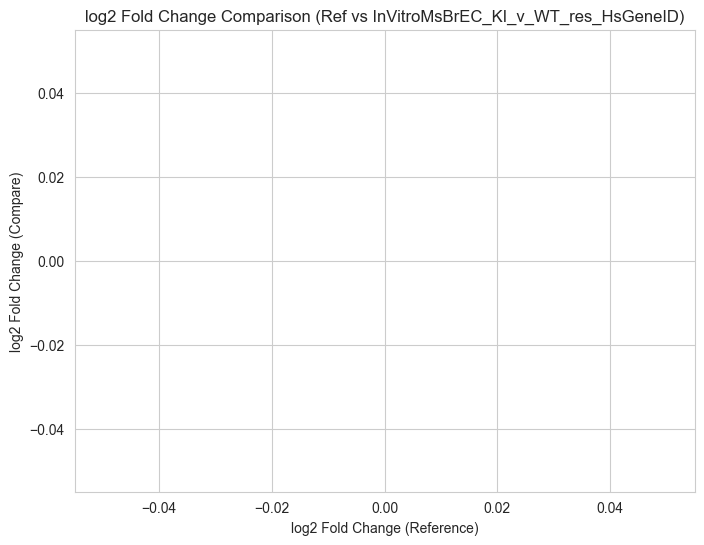

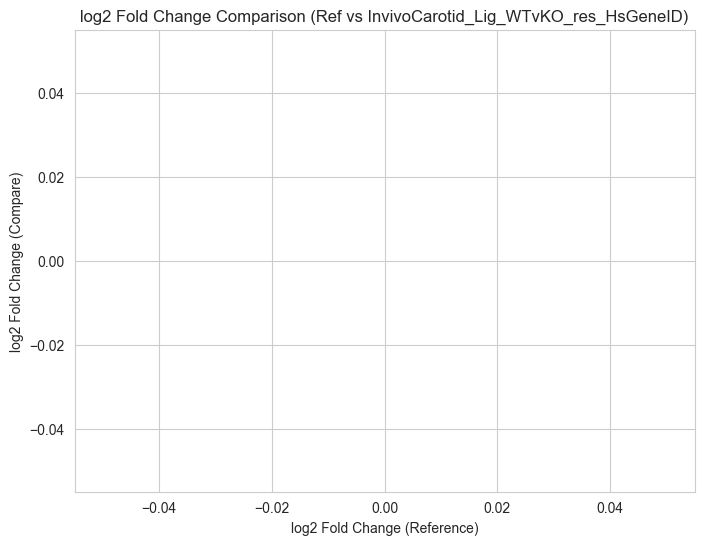

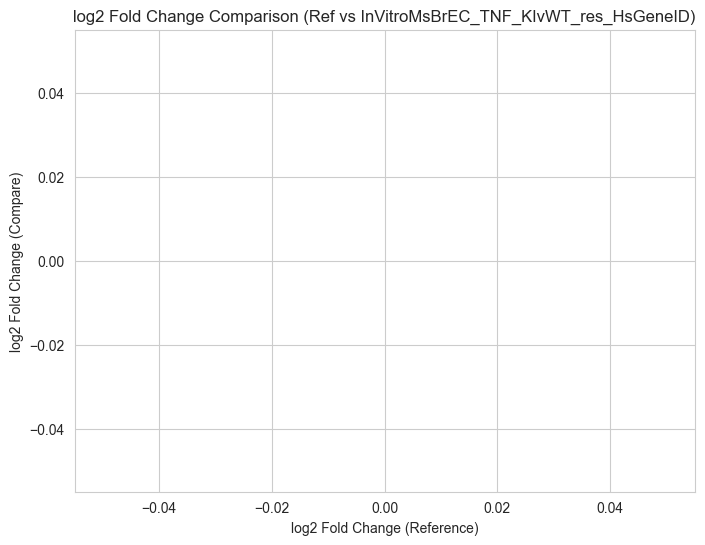

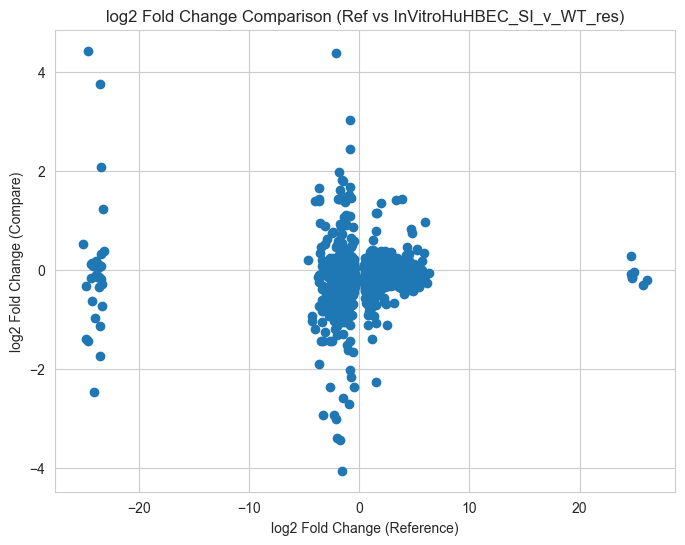

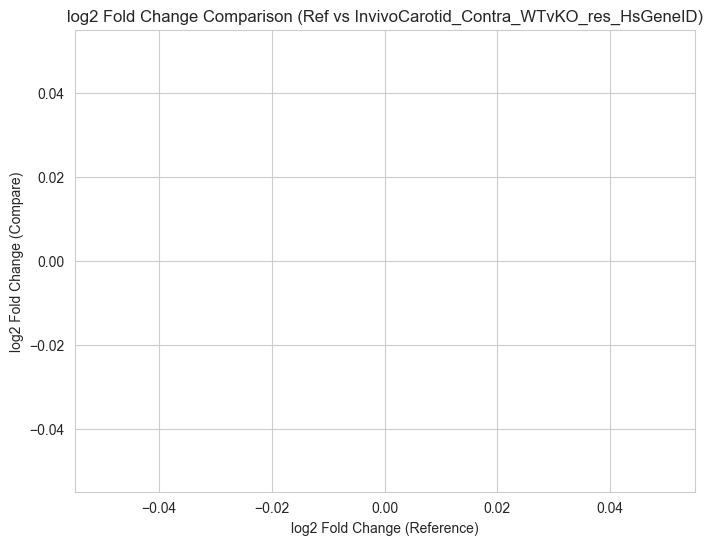

...

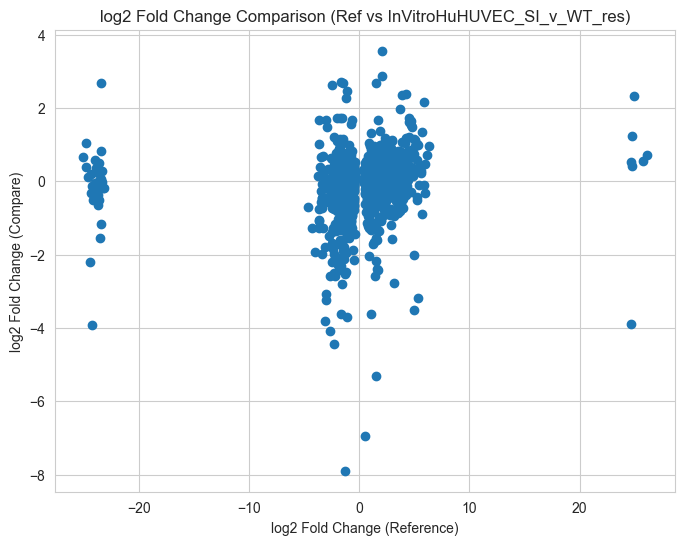

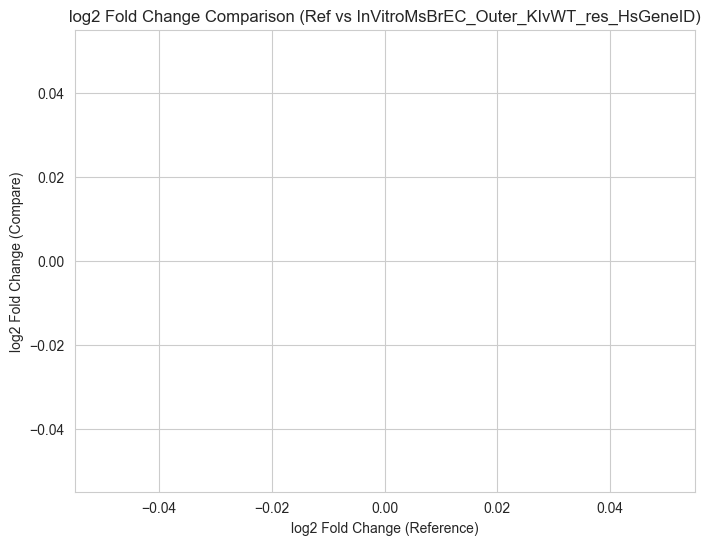

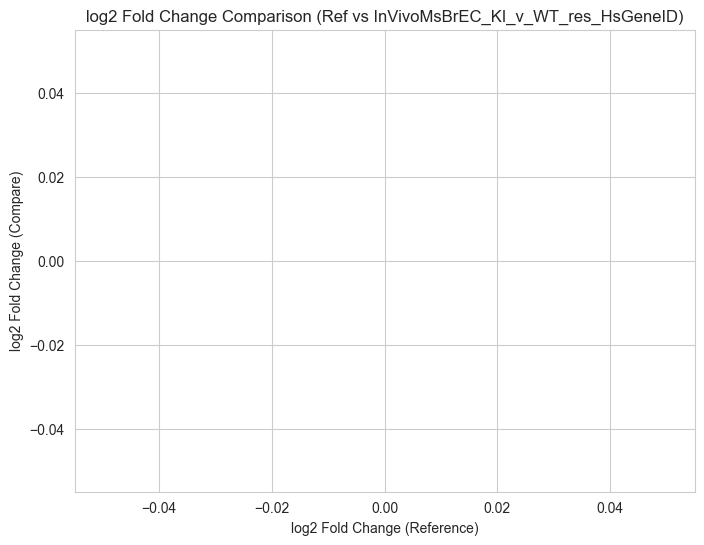

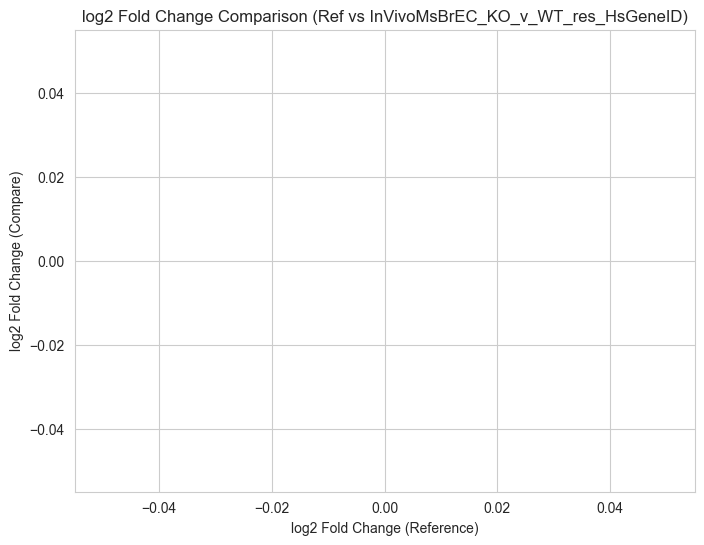

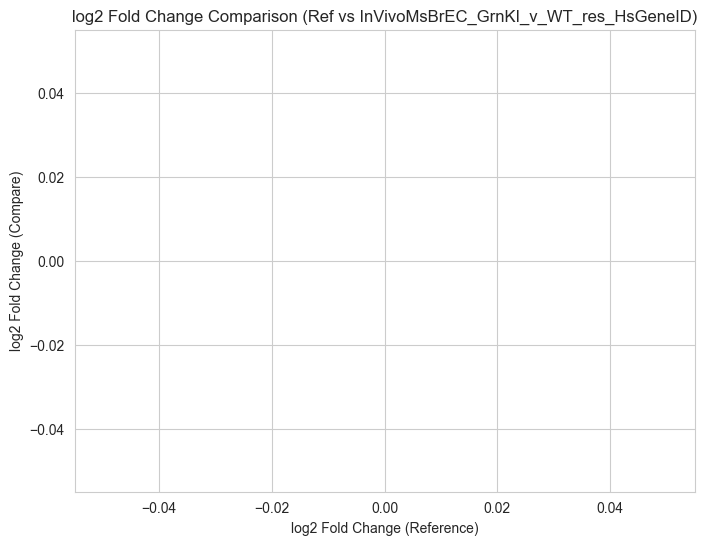

In [100]:
df_dict_humangene_res = {
    'InVitroMsBrEC_KI_v_WT_res_HsGeneID': InVitroMsBrEC_KI_v_WT_res_HsGeneID,
    'InvivoCarotid_Lig_WTvKO_res_HsGeneID': InvivoCarotid_Lig_WTvKO_res_HsGeneID,
    'InVitroMsBrEC_TNF_KIvWT_res_HsGeneID': InVitroMsBrEC_TNF_KIvWT_res_HsGeneID,
    'InVitroHuHBEC_SI_v_WT_res': InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res_HsGeneID': InvivoCarotid_Contra_WTvKO_res_HsGeneID, 
    'InVitroHuBrEC_SI_v_WT_res': InVitroHuBrEC_SI_v_WT_res,
    'InVitroMsBrEC_Inner_KIvWT_res_HsGeneID': InVitroMsBrEC_Inner_KIvWT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_inner_res': InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res_HsGeneID': InVitroMsBrEC_K0_v_WT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_TNF_res': InVitroHuBrEC_TNF_siTDP43vWT_res,
    'InVitroHuBrEC_SI_v_WT_outer_res': InVitroHuBrEC_SI_v_WT_outer_res,
    'InVitroHuHUVEC_SI_v_WT_res': InVitroHuHUVEC_SI_v_WT_res,
    'InVitroMsBrEC_Outer_KIvWT_res_HsGeneID': InVitroMsBrEC_Outer_KIvWT_res_HsGeneID,
    'InVivoMsBrEC_KI_v_WT_res_HsGeneID': InVivoMsBrEC_KI_v_WT_res_HsGeneID,
    'InVivoMsBrEC_KO_v_WT_res_HsGeneID': InVivoMsBrEC_KO_v_WT_res_HsGeneID,
    'InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID': InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID,
    'InVivoNuclei_Clust1v3_res_format': InVivoNuclei_Clust1v3_res_formatted
}

# Function to join, filter, and plot for a single comparison DataFrame
def plot_log2foldchange_comparison(reference_df, compare_df, title):
    # Rename overlapping columns in reference_df (or compare_df if preferred)
    reference_df = reference_df.rename(
        columns={'padj': 'padj_ref', 'log2FoldChange': 'log2FoldChange_ref'}
    )
    compare_df = compare_df.rename(
        columns={'padj': 'padj_comp', 'log2FoldChange': 'log2FoldChange_comp'}
    )
    joined_df = reference_df.join(compare_df[['padj_comp', 'log2FoldChange_comp']], how='outer')
    filtered_df = joined_df[(joined_df['padj_ref'] < 0.05) | (joined_df['padj_comp'] < 0.05)]
    log2fold_ref = filtered_df['log2FoldChange_ref']
    log2fold_comp = filtered_df['log2FoldChange_comp']
    plt.figure(figsize=(8, 6))
    plt.scatter(log2fold_ref, log2fold_comp)
    plt.xlabel('log2 Fold Change (Reference)')
    plt.ylabel('log2 Fold Change (Compare)')
    plt.title(title)
    plt.grid(True)
    plt.show()

# Reference DataFrame (assuming you have a separate reference)
reference_df = df_dict_humangene_res['InVivoNuclei_Clust1v3_res_format']  # Example reference

# Loop through comparison DataFrames in the dictionary
for compare_name, compare_df in df_dict_humangene_res.items():
    # Skip the reference DataFrame (if it's included in the dictionary)
    if compare_name == 'InVivoNuclei_Clust1v3_res_format':
        continue
    title = f'log2 Fold Change Comparison (Ref vs {compare_name})'
    plot_log2foldchange_comparison(reference_df, compare_df, title)


In [101]:
InVitroMsBrEC_TNF_KIvWT_res_HsGeneID

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
NaN,6383.426118,0.045933,0.122478,0.375030,0.707639,0.999649
S100A9,0.000000,NaN,NaN,NaN,NaN,NaN
NaN,303.683360,-0.223736,0.248219,-0.901365,0.367394,0.999649
S100A9,4.526374,-5.647577,2.158544,-2.616383,0.008887,0.999649
NaN,40.492522,0.291924,0.544030,0.536595,0.591547,0.999649
...,...,...,...,...,...,...
S100A9,0.000000,NaN,NaN,NaN,NaN,NaN
S100A9,0.000000,NaN,NaN,NaN,NaN,NaN
S100A9,0.000000,NaN,NaN,NaN,NaN,NaN
NaN,6.828168,0.530496,1.363191,0.389158,0.697159,0.999649


In [75]:
InVivoNuclei_Clust1v3_res_formatted

,Unnamed: 0,1_scores,log2FoldChange,padj,pvalue
1_names,,,,,
GPCPD1,0,-30.077017,-3.390145,5.510748e-118,1.681798e-122
SLCO1A2,1,-24.052660,-3.684128,2.069990e-95,1.263460e-99
SPOCK3,2,-17.108288,-2.280543,3.213209e-50,2.941870e-54
ABLIM1,3,-15.994058,-1.944379,2.340636e-43,3.571635e-47
ABCG2,4,-15.992470,-1.762335,3.760651e-43,6.886167e-47
...,...,...,...,...,...
EPB41L4B,4085,-1.965366,-22.226084,3.999690e-01,4.972911e-02
LRFN4,4088,-1.964947,-22.219006,4.000654e-01,4.977772e-02
AC103796.1,4091,-1.964215,-22.100552,4.006493e-01,4.986260e-02


In [76]:
InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
NaN,8.493370,-0.109065,2.009712,-0.054269,0.956721,0.998840
NaN,0.000000,NaN,NaN,NaN,NaN,NaN
NaN,548.678680,0.617600,0.313304,1.971248,0.048695,0.926150
NaN,13.806328,1.615899,1.516511,1.065537,0.286633,0.997618
NaN,70.904611,0.459778,0.763229,0.602412,0.546900,0.997618
...,...,...,...,...,...,...
ZYG11A,0.000000,NaN,NaN,NaN,NaN,NaN
ZYG11B,1986.042411,-0.196196,0.176465,-1.111814,0.266218,0.997618
ZYX,4212.515496,0.265180,0.356072,0.744738,0.456430,0.997618
ZZEF1,1057.160511,-1.231421,0.388398,-3.170514,0.001522,0.198444


In [77]:
df_dict_humangene_res = {
    'InVitroMsBrEC_KI_v_WT_res_HsGeneID': InVitroMsBrEC_KI_v_WT_res_HsGeneID,
    'InvivoCarotid_Lig_WTvKO_res_HsGeneID': InvivoCarotid_Lig_WTvKO_res_HsGeneID,
    'InVitroMsBrEC_TNF_KIvWT_res_HsGeneID': InVitroMsBrEC_TNF_KIvWT_res_HsGeneID,
    'InVitroHuHBEC_SI_v_WT_res': InVitroHuHBEC_SI_v_WT_res,
    'InvivoCarotid_Contra_WTvKO_res_HsGeneID': InvivoCarotid_Contra_WTvKO_res_HsGeneID, 
    'InVitroHuBrEC_SI_v_WT_res': InVitroHuBrEC_SI_v_WT_res,
    'InVitroMsBrEC_Inner_KIvWT_res_HsGeneID': InVitroMsBrEC_Inner_KIvWT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_inner_res': InVitroHuBrEC_Inner_siTDP43vWT_res,
    'InVitroMsBrEC_K0_v_WT_res_HsGeneID': InVitroMsBrEC_K0_v_WT_res_HsGeneID,
    'InVitroHuBrEC_SI_v_WT_TNF_res': InVitroHuBrEC_TNF_siTDP43vWT_res,
    'InVitroHuBrEC_SI_v_WT_outer_res': InVitroHuBrEC_SI_v_WT_outer_res,
    'InVitroHuHUVEC_SI_v_WT_res': InVitroHuHUVEC_SI_v_WT_res,
    'InVitroMsBrEC_Outer_KIvWT_res_HsGeneID': InVitroMsBrEC_Outer_KIvWT_res_HsGeneID,
    'InVivoMsBrEC_KI_v_WT_res_HsGeneID': InVivoMsBrEC_KI_v_WT_res_HsGeneID,
    'InVivoMsBrEC_KO_v_WT_res_HsGeneID': InVivoMsBrEC_KO_v_WT_res_HsGeneID,
    'InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID': InVivoMsBrEC_GrnKI_v_WT_res_HsGeneID,
    'InVivoNuclei_Clust1v3_res_format': InVivoNuclei_Clust1v3_res_formatted
}


# Function to filter DataFrames by padj < 0.05 in either DataFrame and plot log2FoldChange comparison
def plot_log2FoldChange_comparison(reference_df, compare_df, title):
    # Ensure 'padj' and 'log2FoldChange' columns are present in both DataFrames
    if 'padj' not in reference_df.columns or 'log2FoldChange' not in reference_df.columns:
        raise KeyError("Reference DataFrame must contain 'padj' and 'log2FoldChange' columns")
    if 'padj' not in compare_df.columns or 'log2FoldChange' not in compare_df.columns:
        raise KeyError("Comparison DataFrame must contain 'padj' and 'log2FoldChange' columns")
    
    # Remove any rows with missing values in the necessary columns
    reference_df = reference_df.dropna(subset=['padj', 'log2FoldChange'])
    compare_df = compare_df.dropna(subset=['padj', 'log2FoldChange'])

    # Get indices where padj < 0.05 in either DataFrame
    ref_indices = reference_df[reference_df['padj'] < 0.05].index
    comp_indices = compare_df[compare_df['padj'] < 0.05].index
    combined_indices = ref_indices.union(comp_indices)

    # Filter DataFrames using the combined indices
    filtered_ref = reference_df.loc[combined_indices]
    filtered_comp = compare_df.loc[combined_indices]

    # Merge on gene names
    merged_df = filtered_ref[['log2FoldChange']].merge(
        filtered_comp[['log2FoldChange']],
        left_index=True,
        right_index=True,
        suffixes=('_ref', '_comp'),
        how='inner'  # Only keep common genes
    )

    # Plot
    plt.figure(figsize=(8, 6))
    plt.scatter(merged_df['log2FoldChange_ref'], merged_df['log2FoldChange_comp'], alpha=0.5)
    plt.title(title)
    plt.xlabel('Reference log2FoldChange')
    plt.ylabel('Compared log2FoldChange')
    plt.grid(True)
    plt.show()

# Assuming the DataFrames are already loaded into the df_dict_humangene_res dictionary
# and the reference DataFrame is chosen
reference_df = df_dict_humangene_res['InVivoNuclei_Clust1v3_res_format']  # Example reference

# Loop through each DataFrame and create plots
for key, df in df_dict_humangene_res.items():
    if key != 'InVivoNuclei_Clust1v3_res_format':  # Skip the reference DataFrame itself
        try:
            plot_log2FoldChange_comparison(reference_df, df, f'log2FoldChange: Reference vs {key}')
        except KeyError as e:
            print(f"Error comparing with {key}: {e}")


Error comparing with InVitroMsBrEC_KI_v_WT_res_HsGeneID: "['', 'ALX1', 'FGF7', 'FKBP6', 'FOXG1', 'GRB14', 'NCKAP1L', 'PLEKHA5', 'PODNL1', 'TSPAN11', nan] not in index"
Error comparing with InvivoCarotid_Lig_WTvKO_res_HsGeneID: "['', 'ADAMDEC1', 'AHSG', 'AKT1', 'ALDH1A3', 'ARHGAP20', 'ATXN2', 'C4orf46', 'CCNA2', 'CIRBP', 'COL18A1', 'DKK2', 'FRZB', 'GDF6', 'GLB1', 'GLT8D2', 'GNA12', 'GPC6', 'GPM6A', 'HS3ST3B1', 'HS6ST1', 'IFIT1B', 'KIF20A', 'KIF22', 'KIT', 'KLF15', 'LAMC2', 'LARP1', 'LIN9', 'MARVELD1', 'MIS18BP1', 'NSL1', 'PLVAP', 'PRC1', 'QPCT', 'RRP12', 'SFRP2', 'SGK1', 'SLC10A6', 'SMAD4', 'SPON1', 'SPP1', 'SPPL3', 'STUB1', 'TUBB2B', 'TUFT1', 'ZFP69', nan] not in index"
Error comparing with InVitroMsBrEC_TNF_KIvWT_res_HsGeneID: "['', 'AQP1', 'ATP1B1', 'CCL7', 'CRISPLD1', 'CSPG4', 'CTSC', 'DES', 'EDIL3', 'FABP5', 'FGF7', 'GJB3', 'GRIK2', 'LTBP1', 'LTBP2', 'MGP', 'MMP2', 'MX1', 'NCS1', 'NDRG2', 'PCSK9', 'PENK', 'PLAC8', 'PLEKHA5', 'SERPINA3', 'SLC7A11', 'SPP1', 'TSPAN11', 'VCAN', 'ZCCHC2